In [1]:
from gurobipy import *
from gurobipy import tupledict

import numpy as np
import pandas as pd
import scipy
import timeit
import time
import random
import math

import pdb

from pandas import ExcelWriter

from IPython import display

import matplotlib.pyplot as plt
%matplotlib inline

In [8]:
def intersection(lst1, lst2):
    return [value for value in lst1 if value in lst2]

def diff_set(lst1, lst2):
    return [value for value in lst1 if value not in lst2]

def simulate_dynamic(low_Td=2, max_Td=10, eta_v = 0.9, eta_DC_v= 0.9, Trans_P=100, low_dl =0.75, high_dl=0.95, S=1, 
                             gamma_v=1, delta=0.05, delta1=1, delta3=1, NumberOfDays=1,Day_of_Month=15, plan_int = 1, p=1, 
                             NumberOfVehicles=100, delta2=0, MipGap=2e-2, timelim=200, intervalTime=0.25):

    low_Td = low_Td/intervalTime ## convert to delta t
    max_Td = max_Td/intervalTime
    N = NumberOfVehicles*NumberOfDays
    num_interval = int(1/intervalTime)     ### number of intervals in one hour
    T = int(NumberOfDays*24*num_interval)
    Onehour_interval = NumberOfDays*24
    plan_interval = NumberOfDays*24*plan_int

    ##Setting number
    global l

    ## Determine the vehicles in discharge mode vs only charge mode
    np.random.seed(101)
    array= np.arange(1,N+1)
    random.shuffle(array)
    V2G_EV= list(array[:int(len(array)*p)])
    G2V_EV = [i for i in range(1,N+1) if i not in V2G_EV]

    ##### General EV data
    #####
    df= pd.read_excel('OptimizationEV.xlsx', sheet_name= 'Opt100_2')
    EV_data= df[['EV', 'Ta', 'Td', 'BC', "IS", 'DL', 'pc', 'AR', 'CostBattery']].iloc[0:100]
    wind_data= df[['Price', 'Time','Time2', 'Wind prod']].iloc[0:96]

    wind_data.set_index('Time2', inplace=True)
    EV_data.set_index('EV', inplace=True)

    ######## EV arrivals
    ########
    trip_df = pd.read_csv('TripStartTime_TripReason.csv')
    trip_df2= trip_df.iloc[31:, :]
    trip_df2.columns = trip_df.iloc[30]
    trip_df2.reset_index(inplace=True)
    trip_df2[['Home', 'Work']] = trip_df2[['Home', 'Work']].astype('int32', inplace=True)

    prob_home= list(trip_df2.iloc[:-1]['Home']/trip_df2.iloc[-1]['Home'])
    prob_work =list(trip_df2.iloc[:-1]['Work']/trip_df2.iloc[-1]['Work'])

    np.random.seed(3)
    elems = range(1, NumberOfDays*24+1)
    probabilities = [(x+y)/(NumberOfDays*2) for x,y in zip(prob_home, prob_work)]*NumberOfDays
    trips = list(np.random.choice(elems, int(N), p=probabilities))

    np.random.seed(2)
    ######### Wind data
    #########
    df_results = pd.read_csv("results_power.csv")

    Apr_wind = df_results[df_results['Time stamp'].str.find('Apr '+ str(Day_of_Month)) != -1]
    May_wind = df_results[df_results['Time stamp'].str.find('May '+ str(Day_of_Month)) != -1]
    Jun_wind = df_results[df_results['Time stamp'].str.find('Jun '+ str(Day_of_Month)) != -1]
    Jul_wind = df_results[df_results['Time stamp'].str.find('Jul '+ str(Day_of_Month)) != -1]
    Aug_wind = df_results[df_results['Time stamp'].str.find('Aug '+ str(Day_of_Month)) != -1]

    Oct_wind = df_results[df_results['Time stamp'].str.find('Oct '+ str(Day_of_Month)) != -1]
    Dec_wind = df_results[df_results['Time stamp'].str.find('Dec '+ str(Day_of_Month)) != -1]
    Jan_wind = df_results[df_results['Time stamp'].str.find('Jan '+ str(Day_of_Month)) != -1]
    Feb_wind = df_results[df_results['Time stamp'].str.find('Feb '+ str(Day_of_Month)) != -1]
    Nov_wind = df_results[df_results['Time stamp'].str.find('Nov '+ str(Day_of_Month)) != -1]

    if NumberOfDays>1:
        for i in range(1,NumberOfDays):
            Apr_wind = Apr_wind.append(df_results[df_results['Time stamp'].str.find('Apr ' +str(Day_of_Month+i)) != -1])
            May_wind = May_wind.append(df_results[df_results['Time stamp'].str.find('May ' +str(Day_of_Month+i)) != -1])
            Jun_wind = Jun_wind.append(df_results[df_results['Time stamp'].str.find('Jun ' +str(Day_of_Month+i)) != -1])
            Jul_wind = Jul_wind.append(df_results[df_results['Time stamp'].str.find('Jul ' +str(Day_of_Month+i)) != -1])
            Aug_wind = Aug_wind.append(df_results[df_results['Time stamp'].str.find('Aug ' +str(Day_of_Month+i)) != -1])

            Oct_wind = Oct_wind.append(df_results[df_results['Time stamp'].str.find('Oct ' +str(Day_of_Month+i)) != -1])
            Dec_wind = Dec_wind.append(df_results[df_results['Time stamp'].str.find('Dec ' +str(Day_of_Month+i)) != -1])
            Jan_wind = Jan_wind.append(df_results[df_results['Time stamp'].str.find('Jan ' +str(Day_of_Month+i)) != -1])
            Feb_wind = Feb_wind.append(df_results[df_results['Time stamp'].str.find('Feb ' +str(Day_of_Month+i)) != -1])
            Nov_wind = Nov_wind.append(df_results[df_results['Time stamp'].str.find('Nov ' +str(Day_of_Month+i)) != -1])

    Summer_wind = [Apr_wind, May_wind, Jun_wind, Jul_wind, Aug_wind]
    Winter_wind = [Oct_wind, Dec_wind, Jan_wind, Feb_wind, Nov_wind]

    wind_summer = []
    for month in Summer_wind:
        month= [month.iloc[k//num_interval]['System power generated | (kW)']/num_interval for k in range(T)] 
        month = pd.Series(month, index= range(T))
        wind_summer.append(month)

    wind_winter = []
    for month in Winter_wind:
        month= [month.iloc[k//num_interval]['System power generated | (kW)']/num_interval for k in range(T)] 
        month = pd.Series(month, index= range(T))
        wind_winter.append(month)

    ####### Price Data 
    #######
    Price_df = pd.DataFrame(np.zeros((Onehour_interval,1)), index = range(Onehour_interval))
    Summer = ['Apr', 'May', 'Jun', 'Jul', 'Aug']
    Winter = ['Oct', 'Nov', 'Dec','Jan', 'Feb']

    for i in Summer:
        name_df = pd.read_csv('LMPdata/' + i+'_LMP.csv')
        name_df = name_df[name_df['XML_DATA_ITEM'] == 'LMP_PRC']
        name_df = name_df.sort_values('INTERVALSTARTTIME_GMT')[['INTERVALSTARTTIME_GMT', 'MW']]
        name_df.reset_index(inplace=True)
        Price_df[i+'LMP'] = name_df.iloc[:Onehour_interval]['MW']

    for i in Winter:
        name_df = pd.read_csv('LMPdata/' + i+'_LMP.csv')
        name_df = name_df[name_df['XML_DATA_ITEM'] == 'LMP_PRC']
        name_df = name_df.sort_values('INTERVALSTARTTIME_GMT')[['INTERVALSTARTTIME_GMT', 'MW']]
        name_df.reset_index(inplace=True)
        Price_df[i+'LMP'] = name_df.iloc[:Onehour_interval]['MW']

    price_summer = []
    for month in Summer:
        price = [max(0.01,Price_df.iloc[k//num_interval][month+'LMP'])/10 for k in range(T)] #wind data for 96 time slots (every 15 minutes)
        price = pd.Series(price, index= range(T))
        price_summer.append(price)

    price_winter = []
    for month in Winter:
        price = [max(0.01,Price_df.iloc[k//num_interval][month+'LMP'])/10 for k in range(T)] #wind data for 96 time slots (every 15 minutes)
        price = pd.Series(price, index= range(T))
        price_winter.append(price)

    ### Degradation params
    alpha= 1e-1
    beta = 5e-2

    excedding_consumption, wind_curtailment, degradation_c, objective = [], [], [], []

    Total_consumption, Charge_cost, total_wind, Charge_time, Num_variables, Num_Constraints, RunTime = [],[], [], [],[], [],[]

    charge_load, discharge_load, Cost_tot, Revenue= [],[],[],[]
    violation=[]

    Month = ''
    dataset=[]

    park_time = (low_Td +max_Td)/2 -2

    #Simulate S times
    for k in range(S):
        FinalState = np.zeros((N,1))
        if k<5:
            Month = Summer[k%5]
            w = wind_summer[k%5]
            price = price_summer[k%5]
        else:
            Month = Winter[k%5]
            w = wind_winter[k%5]
            price = price_winter[k%5]


        elements = range(1, NumberOfDays*24+1)
        probabilities = [x/NumberOfDays for x in prob_home]*NumberOfDays
        home_trip_time = np.random.choice(elements, int(N/2), p=probabilities)

        probabilities = [x/NumberOfDays for x in prob_work]*NumberOfDays
        work_trip_time = np.random.choice(elements, int(N/2), p=probabilities)

        Ta = list(home_trip_time*num_interval-np.random.randint(1,num_interval,int(N/2)))
        Ta += list(work_trip_time*num_interval-np.random.randint(1,num_interval,int(N/2)))
        Td = list(Ta + np.random.randint(low_Td,max_Td+1, N))
        Td= map(lambda x: min(x,T), Td)
        Ta= pd.Series(Ta, index=range(1,N+1))
        Td= pd.Series(Td, index=range(1,N+1))

        E={}
        for i in range(1,Onehour_interval+1):
            lst= list(Ta[np.ceil(Ta/num_interval) == i].index)
            E['E' + str(i)] = list(map(int, lst))



        ## The set of EVs are fixed

        car = np.random.randint(1,101, N)
        BC = EV_data['BC'][list(car)]
        BC.index = range(1,N+1)
        AR = EV_data['AR'][list(car)]
        pc= EV_data['pc'][list(car)]
        CB = EV_data['CostBattery'][list(car)]
        AR.index = range(1,N+1)
        pc.index = range(1,N+1)
        CB.index = range(1,N+1)

        chargepow = np.minimum(AR.values, pc.values)
        chargepow= pd.Series(chargepow, index=range(1,N+1))
        eta = pd.Series(eta_v, index=range(1,N+1))
        eta_DC = pd.Series(eta_DC_v, index=range(1,N+1))

        Degradation_cost1 = pd.Series(0.0, index= range(1,N+1))
        Degradation_cost2 = pd.Series(0.0, index= range(1,N+1))
        revenue = pd.Series(0.0, index= range(1,N+1))
        FinalState = pd.Series(np.zeros((N)), index = range(1,N+1))
        Xch = pd.Series(0.0, index= range(1,N+1))
        Xdch = pd.Series(0.0, index= range(1,N+1))

        cons_w = pd.Series(0.0, index= range(1,N+1))
        cons_z = pd.Series(0.0, index= range(1,N+1))
        cons_DC = pd.Series(0.0, index= range(1,N+1))
        cost = pd.Series(0.0, index= range(1,N+1))
        wind_ev = pd.Series(0.0, index= range(1,N+1))

        #generate using uniform :D
        IS = pd.Series(np.zeros((N)),index = range(1,N+1))
        DL = pd.Series(np.zeros((N)), index= range(1,N+1))
        minSOC = pd.Series(np.ones((N))*5, index= range(1,N+1))

        for i in range(1,N+1):
            IS[i] = np.random.uniform(0.1, (low_dl-0.1)*BC[i])
            DL[i] = np.random.uniform(low_dl*BC[i], high_dl*BC[i])
            #np.random.uniform(0.1*BC[i], 0.1*BC[i])

        for i in range(1,N+1):
            if Td[i] == T:
                DL[i] = DL[i] * (T-Td[i]) / (max_Td - low_Td)

        ISSS = IS.copy()
        mean_IS= IS.mean()

        for i in range(1,N+1):
            BC[i] = max(BC[i], chargepow[i]/num_interval+DL[i])

        EE ={}
        for t in range(T):
            EE[t] = [i for i in range(1, N+1) if t in range(Ta[i], Td[i])]

        consumption =0
        m =[]

        D = pd.Series(0, index=range(0,T), dtype= 'float32')
        charging_load = pd.Series(0, index=range(0,T), dtype= 'float32')
        discharging_load = pd.Series(0, index=range(0,T), dtype= 'float32')

        Consumption_wind, Consumption_DC, Consumption_z = 0 ,0 ,0

        X= tupledict()
        Y1= tupledict()
        Y2= tupledict()
        SOC= tupledict()
        z= tupledict()
        c= tupledict()
        SOC_D= tupledict()

        XX= tupledict()

        numVar=0
        numCon = 0
        runTime = 0
        obj =0 

        rev=0

        Num_Charge_restarts = pd.Series(np.zeros((N)), index= range(1,N+1))
        Num_DisCharge_restarts = pd.Series(np.zeros((N)), index= range(1,N+1))

        #################################### DYNAMIC 
        for j in range(1,Onehour_interval):

            m.append(Model('Dynamic_Time' + str(j) + ' Scenario' + str(k)))
            print('\nSolving problem at TIME {}_{}'.format(k, j))
            period=j*num_interval

            if j==1:
                Last_charge = pd.Series([int(0) for i in E['E'+str(j)]], index= [i for i in E['E'+str(j)]])
                Last_charge_XX = pd.Series([int(0) for i in intersection(E['E'+str(j)],V2G_EV)], 
                                           index= [i for i in intersection(E['E'+str(j)],V2G_EV)])
                V2G_EVV = intersection(E['E'+str(j)], V2G_EV)
                G2V_EVV = intersection(E['E'+str(j)], G2V_EV)
            if j>1:
                for i in E['E'+str(j-1)]:
                    if Td[i] > period:
                        E['E'+str(j)] += [i]
                        IS[i] = SOC[j-2][i,period].x
                    else:
                        continue

                V2G_EVV = intersection(E['E'+str(j)], V2G_EV)
                G2V_EVV = intersection(E['E'+str(j)], G2V_EV)
                Last_charge = pd.Series([round(X[j-2][i,period-1].x) for i in intersection(E['E'+str(j)], E['E'+str(j-1)])]
                                        +[int(0) for i in diff_set(E['E'+str(j)], E['E'+str(j-1)])],
                                        index= [i for i in intersection(E['E'+str(j)], E['E'+str(j-1)])] 
                                        +[i for i in diff_set(E['E'+str(j)], E['E'+str(j-1)])])
                Last_charge_XX = pd.Series([round(XX[j-2][i,period-1].x) for i in intersection(V2G_EVV, E['E'+str(j-1)])]
                                           +[int(0) for i in diff_set(V2G_EVV, E['E'+str(j-1)])],
                                            index= [i for i in intersection(V2G_EVV, E['E'+str(j-1)])] 
                                           +[i for i in diff_set(V2G_EVV, E['E'+str(j-1)])])

            Immediate_chargeP = pd.Series(np.zeros((N)), index= range(1,N+1), dtype='int')  ## number of charging periods required

            for i in E['E'+str(j)]:
                if minSOC[i]> IS[i]:
    #                     print('LOOK HERE', i, minSOC[i], IS[i])
                    timetoreachminLev= int(math.ceil((minSOC[i]+0.1-IS[i])*num_interval/(eta[i]*chargepow[i])))
                    Immediate_chargeP[i]= min(Td[i]-period, timetoreachminLev)

            B = [i for i in E['E'+str(j)] if IS[i] < minSOC[i]]
            AA = [i for i in E['E'+str(j)] if IS[i] >= minSOC[i]]

            ## if there is no vehicle to plan go to the next planning time
            if E['E' +str(j)] == []:
                continue

    #         print('Td', Td)

            max_tau = max([Td[i] for i in E['E' +str(j)]])


            DF ={} ## dummy future arrivals
            TAD =[]
            TDD =[]
            ISD, DLD, BCD, CPD = [],[],[],[]

            for per in range(j+1, ((max_tau-1)//num_interval)+1):
                DF['E'+str(j)+'_' + str(per)]= sum([1 for i in trips if i==per])
                for v in range(DF['E'+str(j)+'_' + str(per)]):
                    TAD.append(per*num_interval)
                    TDD.append(int(min(per*num_interval +park_time, T)))
                    ISD.append(mean_IS)
                    DLD.append(DL.mean())
                    BCD.append(BC.mean())
                    CPD.append(chargepow.mean())

            set_DF = range(0,len(TAD))

            EE_D ={}
            n_arrival_t ={}
            D_DA ={}
            for t in range(period, max_tau):
                EE_D[t] = [i for i in set_DF if t in range(TAD[i], TDD[i])]
                n_arrival_t[t] = len([i for i in set_DF if t in range(TAD[i], TDD[i])])
                D_DA[t] = ((DL.mean()-mean_IS)/park_time)*n_arrival_t[t]

            #Creating a model instance
            X[j-1] = m[j-1].addVars(((i,t) for i in E['E'+str(j)] for t in range(period, Td[i])),ub=1, vtype= GRB.CONTINUOUS, name= 'X_' +str(j))

            XX[j-1] = m[j-1].addVars(((i,t) for i in V2G_EVV for t in range (period, Td[i])),ub=1, vtype= GRB.CONTINUOUS, name= 'XX'+str(j))

            Y1[j-1] = m[j-1].addVars(((i,t) for i in V2G_EVV for t in range (period, Td[i])), vtype= GRB.BINARY, name= 'Y')
            Y2[j-1] = m[j-1].addVars(((i,t) for i in V2G_EVV for t in range(period, Td[i])), vtype= GRB.BINARY, name= 'YY')

            SOC[j-1] = m[j-1].addVars(((i,t) for i in E['E'+str(j)] for t in range(period,Td[i]+1)), vtype= GRB.CONTINUOUS, name= 'SOC')

            z[j-1] = m[j-1].addVars((t for t in range(period, max_tau)), vtype= GRB.CONTINUOUS, lb=0, name= 'z')

            c[j-1] = m[j-1].addVars((t for t in range(period, max_tau)), vtype = GRB.CONTINUOUS, lb= 0, name='Curtail')

            m[j-1].update()

            #Obj Function

            ### I think I need to change this later
            m[j-1].setObjective((sum(delta1*z[j-1][t]*price[t] + delta*price[t]*c[j-1][t]  for t in range(period,max_tau))
                                + delta3*
                                       (quicksum((4.2*CB[i]/(5000*BC[i]))*(eta[i]*chargepow[i]/num_interval)
                                                 for i in E['E'+str(j)] for t in range(period, Td[i]))
                                       + quicksum((4.2*CB[i]/(5000*BC[i]))*((chargepow[i]/num_interval)/eta_DC[i])
                                                 for i in V2G_EVV for t in range(period, Td[i]))
                                       )), GRB.MINIMIZE)


            #Initial State of Battery
            m[j-1].addConstrs((SOC[j-1][i,period] == IS[i] for i in E['E'+str(j)]), name='InitialState')

            # State of Charge
            m[j-1].addConstrs((SOC[j-1][i,t]==SOC[j-1][i,t-1] + X[j-1][i,t-1]*eta[i]*chargepow[i]/num_interval 
                               for i in G2V_EVV for t in range(period+1, Td[i]+1)), name= 'StateofChargeG2V')
            m[j-1].addConstrs((SOC[j-1][i,t]==SOC[j-1][i,t-1] + (X[j-1][i,t-1]*eta[i]*chargepow[i] - XX[j-1][i,t-1]/eta_DC[i]*chargepow[i])/num_interval 
                               for i in V2G_EVV for t in range(period+1, Td[i]+1)), name= 'StateofChargeV2G')


            # Excessive Consumption
            m[j-1].addConstrs(z[j-1][t] >= sum((X[j-1][i,t]-XX[j-1][i,t])*chargepow[i]/num_interval for i in intersection(V2G_EVV, EE[t]))
                                      + sum((X[j-1][i,t])*chargepow[i]/num_interval for i in intersection(G2V_EVV, EE[t]))
                                      + D_DA[t]
                                      - w[t] for t in range(period,max_tau))

            # Transmission limit
            m[j-1].addConstrs((z[j-1][t] <= Trans_P for t in range(period,max_tau)), name ='transmission')

            # either Charge or discharge or do nothing
            m[j-1].addConstrs(X[j-1][i,t] <= 2*(1-Y1[j-1][i,t]) for i in V2G_EVV for t in range(period, Td[i]))
            m[j-1].addConstrs(XX[j-1][i,t] <= 2*(1-Y2[j-1][i,t]) for i in V2G_EVV for t in range(period, Td[i]))
            m[j-1].addConstrs(0.99<=Y1[j-1][i,t]+Y2[j-1][i,t]<=1.01 for i in V2G_EVV for t in range(period, Td[i]))

            #Full Charge when we don't reach the desired level during plugin
            m[j-1].addConstrs((X[j-1][i,t]>=1 for i in E['E'+str(j)] for t in range(period, Td[i]) 
                               if IS[i]+chargepow[i]*eta[i]*(Td[i] - period)/num_interval < DL[i]), name='full charge')

            #Final state of charge should be more than desired level
            m[j-1].addConstrs(SOC[j-1][i,Td[i]] >= DL[i] for i in E['E'+str(j)] if 
                              IS[i]+ chargepow[i]*eta[i]*(Td[i] - period)/num_interval >= DL[i])

            #BatteryCapacity
            m[j-1].addConstrs((SOC[j-1][i,t] <= BC[i] for i in E['E'+str(j)] for t in range(period, Td[i]+1)), name= 'Battery Capacity')

            # Min level of Charge
            m[j-1].addConstrs((SOC[j-1][i,t] >= minSOC[i]+0.1 for i in AA for t in range(period+1,Td[i]+1)), name= 'MinStateofCharge')

            # Min level of Charge2
            m[j-1].addConstrs((X[j-1][i,t]>=1 for i in B for t in range(period, period+Immediate_chargeP[i])),name= 'MinStateofCharge2')

            # Min level of Charge3
            m[j-1].addConstrs((SOC[j-1][i,t] >= minSOC[i]-0.1 for i in B for t in range(period+Immediate_chargeP[i], Td[i]+1) 
                             if period+Immediate_chargeP[i] != Td[i]), name= 'MinStateofCharge3')

            #curtailment
            m[j-1].addConstrs(c[j-1][t] >= w[t]- sum((X[j-1][i,t]-XX[j-1][i,t])*chargepow[i]/num_interval for i in intersection(V2G_EVV, EE[t]))
                                      - sum((X[j-1][i,t])*chargepow[i]/num_interval for i in intersection(G2V_EVV, EE[t]))
                                      - D_DA[t]
                                      for t in range(period,max_tau))


            m[j-1].update()

            print('NumVar and NumConstr = {}, {}'.format(m[j-1].NumVars, m[j-1].NumConstrs))

            m[j-1].params.OutputFlag = 0
            m[j-1].params.MIPGap = MipGap
            m[j-1].params.TimeLimit = timelim
            m[j-1].optimize()

            status = m[j-1].status

            #Loop until we reduce to a model that can be solved
            if status == GRB.Status.INFEASIBLE:
                m[j-1].computeIIS()
                print('\nThe following constraint cannot be satisfied:')
                for c in m[j-1].getConstrs():
                    if c.IISConstr:
                        print('%s' % c.constrName)
                print('')

            ## lets model the consumption for each EV:
            for t in range(period,(j+1)*num_interval):
                avail_w =  w[t]
                avail_DC = sum(XX[j-1][i,t].x*chargepow[i]/num_interval for i in intersection(EE[t], V2G_EVV))
                EVV = [(i,SOC[j-1][i,Td[i]].x - SOC[j-1][i,t].x) for i in intersection(E['E'+str(j)],EE[t]) if X[j-1][i,t].x>0]
                EVV.sort(key=lambda x: x[1], reverse = True) ##Set of charging vehicles, order the vehicles in ascending order of energy they require
                if len(EVV)==0:
                    continue
                for (ev, _) in EVV:
                    if avail_DC >= X[j-1][ev,t].x*chargepow[ev]/num_interval:
                        avail_DC -= X[j-1][ev,t].x*chargepow[ev]/num_interval
                        cons_DC[ev] += X[j-1][ev,t].x*chargepow[ev]/num_interval
                        Consumption_DC += X[j-1][ev,t].x*chargepow[ev]/num_interval
                        cost[ev] += 0.9*price[t]*(X[j-1][ev,t].x*chargepow[ev]/num_interval)
                        rev += 0.9*price[t]*(X[j-1][ev,t].x*chargepow[ev]/num_interval)
                    elif avail_DC< X[j-1][ev,t].x*chargepow[ev]/num_interval:
                        cons_DC[ev] += avail_DC
                        Consumption_DC += avail_DC
                        cost[ev] += 0.9*price[t]*avail_DC
                        rev += 0.9*price[t]*avail_DC
                        charge_required = X[j-1][ev,t].x*chargepow[ev]/num_interval-avail_DC
                        avail_DC = 0
                        if avail_w >= charge_required:
                            avail_w -= charge_required
                            cons_w[ev] += charge_required
                            Consumption_wind += charge_required
                            #cost[ev] += 0*price[t]*(charge_required)
                        elif avail_w < charge_required:
                            cons_w[ev] += avail_w
                            cons_z[ev] += charge_required - avail_w
                            Consumption_wind += avail_w
                            Consumption_z += charge_required - avail_w
                            #cost[ev] += 0*price[t]*(avail_w)
                            cost[ev] += price[t]*(charge_required - avail_w)
                            avail_w = 0


            for i in V2G_EVV:
                v= min(Td[i], (j+1)*num_interval)
                Degradation_cost2[i] += sum((4.2*CB[i]/(5000*BC[i]))*(eta[i]*chargepow[i]/num_interval)*(X[j-1][i,t].x) for t in range(period, v))
                Degradation_cost2[i] += sum((4.2*CB[i]/(5000*BC[i]))*((chargepow[i]/num_interval)/eta_DC[i])*(XX[j-1][i,t].x) for t in range(period, v))
                Xch[i] += sum(X[j-1][i,t].x *chargepow[i]/num_interval for t in range(period, v))
                Xdch[i] += sum(XX[j-1][i,t].x *chargepow[i]/num_interval for t in range(period, v))
                revenue[i] += sum(0.9*price[t]*XX[j-1][i,t].x for t in range(period, v))

                for t in range(period, v):
                    D[t] += ((X[j-1][i,t].x-XX[j-1][i,t].x)*chargepow[i]/num_interval)
                    charging_load[t] += (X[j-1][i,t].x*chargepow[i]/num_interval)
                    discharging_load[t] += (XX[j-1][i,t].x*chargepow[i]/num_interval)  
                if Td[i] <= (j+1)*num_interval:  ### if the vehicle leaves before the next planning time
                    FinalState[i] = SOC[j-1][i,Td[i]].x

            for i in G2V_EVV:
                v= min(Td[i], (j+1)*num_interval)
                Degradation_cost2[i] += sum((4.2*CB[i]/(5000*BC[i]))*(eta[i]*chargepow[i]/num_interval)*(X[j-1][i,t].x) for t in range(period, v))
                Xch[i] += sum(X[j-1][i,t].x *chargepow[i]/num_interval for t in range(period, v))
                for t in range(period, v):
                    D[t] += (X[j-1][i,t].x *chargepow[i]/num_interval)
                    charging_load[t] += (X[j-1][i,t].x*chargepow[i]/num_interval) 
                if Td[i] <= (j+1)*num_interval:  ### if the vehicle leaves before the next planning time
                    FinalState[i] = SOC[j-1][i,Td[i]].x

            numVar += m[j-1].NumVars
            numCon += m[j-1].NumConstrs
            runTime += m[j-1].Runtime
            obj += m[j-1].objVal


        n_violated=0
        for i in range(1,N+1):
            wind_ev[i] = sum(w[t] for t in range(Ta[i], Td[i]))
            if FinalState[i]<DL[i]-0.01:
                n_violated+=1

        total_cost = pd.Series(cost+Degradation_cost1+Degradation_cost2, index=range(1,N+1))

        violation.append(n_violated)

        ZZ= (D-w).apply(lambda x: max(x, 0))
        CC = (w-D).apply(lambda x: max(x, 0))


        plt.figure(figsize=(20,8))
        plt.plot(range(T), charging_load, label= 'Charging load')
        plt.plot(range(T), w, label= 'Wind energy generated')
        plt.plot(range(T), discharging_load, label= 'Discharging load')
        plt.legend(loc='best')
        plt.xticks(np.arange(0,T,16), labels=[int(x/num_interval) for x in list(np.arange(0,96,16))*NumberOfDays])
        plt.xlabel('Time of the day',fontsize= 15)
        plt.ylabel('Energy in kWh', fontsize= 15)

    #         print('\n\n\nTotal exceeding energy consumption is {} kWh \n'.format(ZZ.sum()))
    #         print('Total wind production is {} kWh\n'.format(w.sum()))
    #         print('Total curtailment is {} kWh\n'.format(CC.sum()))
    #         print('Total Consumption is {} kWh\n'.format(D.sum()))
    #         print('Total charging cost is {} USD'.format(charging_cost))

        charging_cost = sum(ZZ[t]*price[t] for t in range(T))

        print(Consumption_wind,Consumption_DC, Consumption_z)

        degradation_c.append(sum(Degradation_cost1+Degradation_cost2))
        total_wind.append(w.sum())
        excedding_consumption.append(ZZ.sum())
        wind_curtailment.append(sum(CC))  
        Total_consumption.append(D.sum())
        Charge_cost.append(charging_cost)
        Charge_time.append((Td-Ta).mean())
        Cost_tot.append(total_cost.sum()-rev)
        Num_variables.append(numVar)
        Num_Constraints.append(numCon)
        RunTime.append(runTime)
        objective.append(obj)
        charge_load.append(charging_load.sum())
        discharge_load.append(discharging_load.sum())
        Revenue.append(rev)

        dummy_df= pd.DataFrame(data=[BC, AR, pc, chargepow, ISSS, DL, Ta, Td, FinalState, Degradation_cost1, Degradation_cost2],
                               index=['BC', 'AR', 'pc','chargepow', 'IS', 'DL', 'Ta', 'Td','FinalState','DegCost1','DegCost2']).transpose()

        dummy_df['wind']=pd.Series(w.sum(), index= range(1,N+1))
        dummy_df['Charge load kWh'] =pd.Series([Xch[i] for i in range(1,N+1)], index= range(1,N+1))
        dummy_df['Total Discharge kWh'] = pd.Series([Xdch[i] for i in V2G_EV], index= V2G_EV)
        dummy_df['Charge Cost'] =pd.Series([cost[i] for i in range(1,N+1)], index= range(1,N+1))
        dummy_df['Wind Usage'] = pd.Series([cons_w[i] for i in range(1,N+1)], index= range(1,N+1))
        dummy_df['Consumption from discharge'] = pd.Series([cons_DC[i] for i in range(1,N+1)], index= range(1,N+1))
        dummy_df['Consumption from grid'] = pd.Series([cons_z[i] for i in range(1,N+1)], index= range(1,N+1))
        dummy_df['Degradation Cost'] = pd.Series([Degradation_cost1[i]+Degradation_cost2[i] for i in range(1,N+1)], index= range(1,N+1))
        dummy_df['wind during park'] = pd.Series([wind_ev[i] for i in range(1,N+1)], index= range(1,N+1))
        dummy_df['Revenue'] = pd.Series([revenue[i] for i in range(1,N+1)], index= range(1,N+1))
        dummy_df['Is in V2G'] = pd.Series([(i in V2G_EV) for i in range(1,N+1)], index= range(1,N+1))
        dataset.append(dummy_df)

    EV_dataset = pd.concat(dataset, axis=0)
    EV_dataset.reset_index(inplace=True)
    if l ==1:
        with ExcelWriter('EV_Dataset_Dynamic.xlsx') as writer:
            EV_dataset.to_excel(writer, sheet_name='setting {}'.format(l))
    else: 
        with ExcelWriter('EV_Dataset_Dynamic.xlsx',engine="openpyxl", mode='a') as writer:
            EV_dataset.to_excel(writer, sheet_name='setting {}'.format(l))

    print('THIS IS DYNAMIC CASE With future arrivals:')
    print('Simulation Parameters are: \n')
    print('min parking time {}\nmax parking time {}\nnumber of Scenarios {}'.format(low_Td, max_Td, S))
    print('Delta {}\nNumber of Days {}\nNumber of Vehicles {}\nMin desired level {}\nMax desired level {}'.format
          (delta, NumberOfDays, N, low_dl, high_dl))
    print('Delta2 {}\neta_c {}\neta_dc {}\nTrans_P {}\nProb of V2G is {}'.format
          (delta2, eta_v, eta_DC_v, Trans_P, p))
    print('Total wind production: ', total_wind)
    print('exceeding consumption: ', excedding_consumption)
    print('Wind curtailment: ', wind_curtailment)
    print('total consumption: ', Total_consumption)
    print('total charging cost: ', Charge_cost)
    print('total charge demand: ', charge_load)
    print('total discharge: ', discharge_load)
    print('Charge cost per kWh is: ', [x/y for x,y in zip(Charge_cost, Total_consumption)])
    print('degradation cost: ', degradation_c)
    print('Total revenue: ', Revenue)
    print('total cost (charge cost + deg cost - revenue): ', Cost_tot)
#     print('average charge time: ', Charge_time)
#     print('Total run time is: ', RunTime)
#     print('Total number of variables: ', Num_variables)
#     print('Total number of Constraints: ', Num_Constraints)
    print('Total number of Violations: ', violation)
#     print('objective is: ', objective)

#### Performance evaluation for objective function hyperparameters
************curtailment delta is a function of real-time price*********

C:\Users\pouyasharifi\AppData\Local\Continuum\anaconda3\lib\site-packages\pandas\core\frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]



Solving problem at TIME 0_1

Solving problem at TIME 0_2

Solving problem at TIME 0_3

Solving problem at TIME 0_4

Solving problem at TIME 0_5
NumVar and NumConstr = 288, 372

Solving problem at TIME 0_6
NumVar and NumConstr = 750, 930

Solving problem at TIME 0_7
NumVar and NumConstr = 1682, 2082

Solving problem at TIME 0_8
NumVar and NumConstr = 2101, 2591

Solving problem at TIME 0_9
NumVar and NumConstr = 2849, 3503

Solving problem at TIME 0_10
NumVar and NumConstr = 2815, 3477

Solving problem at TIME 0_11
NumVar and NumConstr = 3144, 3916

Solving problem at TIME 0_12
NumVar and NumConstr = 3285, 4073

Solving problem at TIME 0_13
NumVar and NumConstr = 3787, 4683

Solving problem at TIME 0_14
NumVar and NumConstr = 4260, 5241

Solving problem at TIME 0_15
NumVar and NumConstr = 4248, 5216

Solving problem at TIME 0_16
NumVar and NumConstr = 4598, 5649

Solving problem at TIME 0_17
NumVar and NumConstr = 4122, 5068

Solving problem at TIME 0_18
NumVar and NumConstr = 4287, 52

NumVar and NumConstr = 4231, 5219

Solving problem at TIME 0_132
NumVar and NumConstr = 3592, 4431

Solving problem at TIME 0_133
NumVar and NumConstr = 3915, 4813

Solving problem at TIME 0_134
NumVar and NumConstr = 4041, 4983

Solving problem at TIME 0_135
NumVar and NumConstr = 4154, 5117

Solving problem at TIME 0_136
NumVar and NumConstr = 4343, 5345

Solving problem at TIME 0_137
NumVar and NumConstr = 4150, 5115

Solving problem at TIME 0_138
NumVar and NumConstr = 4711, 5789

Solving problem at TIME 0_139
NumVar and NumConstr = 4557, 5598

Solving problem at TIME 0_140
NumVar and NumConstr = 4091, 5029

Solving problem at TIME 0_141
NumVar and NumConstr = 3888, 4775

Solving problem at TIME 0_142
NumVar and NumConstr = 3352, 4134

Solving problem at TIME 0_143
NumVar and NumConstr = 3078, 3794

Solving problem at TIME 0_144
NumVar and NumConstr = 2371, 2931

Solving problem at TIME 0_145
NumVar and NumConstr = 1752, 2179

Solving problem at TIME 0_146
NumVar and NumConstr = 12

NumVar and NumConstr = 4433, 5447

Solving problem at TIME 1_20
NumVar and NumConstr = 3702, 4571

Solving problem at TIME 1_21
NumVar and NumConstr = 4025, 4957

Solving problem at TIME 1_22
NumVar and NumConstr = 3352, 4127

Solving problem at TIME 1_23
NumVar and NumConstr = 2916, 3600

Solving problem at TIME 1_24
NumVar and NumConstr = 2572, 3177

Solving problem at TIME 1_25
NumVar and NumConstr = 1872, 2322

Solving problem at TIME 1_26
NumVar and NumConstr = 1288, 1608

Solving problem at TIME 1_27
NumVar and NumConstr = 847, 1062

Solving problem at TIME 1_28
NumVar and NumConstr = 769, 969

Solving problem at TIME 1_29
NumVar and NumConstr = 643, 810

Solving problem at TIME 1_30
NumVar and NumConstr = 728, 909

Solving problem at TIME 1_31
NumVar and NumConstr = 1816, 2235

Solving problem at TIME 1_32
NumVar and NumConstr = 3677, 4508

Solving problem at TIME 1_33
NumVar and NumConstr = 4800, 5894

Solving problem at TIME 1_34
NumVar and NumConstr = 5364, 6567

Solving prob


Solving problem at TIME 1_148
NumVar and NumConstr = 436, 552

Solving problem at TIME 1_149
NumVar and NumConstr = 295, 375

Solving problem at TIME 1_150
NumVar and NumConstr = 733, 917

Solving problem at TIME 1_151
NumVar and NumConstr = 1804, 2232

Solving problem at TIME 1_152
NumVar and NumConstr = 3721, 4572

Solving problem at TIME 1_153
NumVar and NumConstr = 4740, 5800

Solving problem at TIME 1_154
NumVar and NumConstr = 4997, 6107

Solving problem at TIME 1_155
NumVar and NumConstr = 5348, 6555

Solving problem at TIME 1_156
NumVar and NumConstr = 5198, 6393

Solving problem at TIME 1_157
NumVar and NumConstr = 4762, 5847

Solving problem at TIME 1_158
NumVar and NumConstr = 4604, 5648

Solving problem at TIME 1_159
NumVar and NumConstr = 5212, 6379

Solving problem at TIME 1_160
NumVar and NumConstr = 4722, 5785

Solving problem at TIME 1_161
NumVar and NumConstr = 5186, 6354

Solving problem at TIME 1_162
NumVar and NumConstr = 5409, 6643

Solving problem at TIME 1_163


NumVar and NumConstr = 6804, 8304

Solving problem at TIME 2_39
NumVar and NumConstr = 7022, 8596

Solving problem at TIME 2_40
NumVar and NumConstr = 6463, 7945

Solving problem at TIME 2_41
NumVar and NumConstr = 6146, 7576

Solving problem at TIME 2_42
NumVar and NumConstr = 5864, 7242

Solving problem at TIME 2_43
NumVar and NumConstr = 5689, 7007

Solving problem at TIME 2_44
NumVar and NumConstr = 4746, 5847

Solving problem at TIME 2_45
NumVar and NumConstr = 3949, 4862

Solving problem at TIME 2_46
NumVar and NumConstr = 3068, 3783

Solving problem at TIME 2_47
NumVar and NumConstr = 2239, 2763

Solving problem at TIME 2_48
NumVar and NumConstr = 1867, 2313

Solving problem at TIME 2_49
NumVar and NumConstr = 1336, 1668

Solving problem at TIME 2_50
NumVar and NumConstr = 876, 1101

Solving problem at TIME 2_51
NumVar and NumConstr = 582, 735

Solving problem at TIME 2_52
NumVar and NumConstr = 377, 483

Solving problem at TIME 2_53
NumVar and NumConstr = 296, 394

Solving prob

NumVar and NumConstr = 3454, 4262

Solving problem at TIME 2_167
NumVar and NumConstr = 2908, 3594

Solving problem at TIME 2_168
NumVar and NumConstr = 2326, 2873

Solving problem at TIME 2_169
NumVar and NumConstr = 1698, 2104

Solving problem at TIME 2_170
NumVar and NumConstr = 1449, 1797

Solving problem at TIME 2_171
NumVar and NumConstr = 1070, 1338

Solving problem at TIME 2_172
NumVar and NumConstr = 742, 933

Solving problem at TIME 2_173
NumVar and NumConstr = 490, 621

Solving problem at TIME 2_174
NumVar and NumConstr = 561, 705

Solving problem at TIME 2_175
NumVar and NumConstr = 817, 1017

Solving problem at TIME 2_176
NumVar and NumConstr = 2200, 2698

Solving problem at TIME 2_177
NumVar and NumConstr = 3024, 3697

Solving problem at TIME 2_178
NumVar and NumConstr = 3216, 3935

Solving problem at TIME 2_179
NumVar and NumConstr = 3914, 4788

Solving problem at TIME 2_180
NumVar and NumConstr = 4271, 5222

Solving problem at TIME 2_181
NumVar and NumConstr = 5147, 631

NumVar and NumConstr = 3595, 4414

Solving problem at TIME 3_58
NumVar and NumConstr = 3828, 4696

Solving problem at TIME 3_59
NumVar and NumConstr = 4444, 5482

Solving problem at TIME 3_60
NumVar and NumConstr = 4351, 5362

Solving problem at TIME 3_61
NumVar and NumConstr = 4158, 5124

Solving problem at TIME 3_62
NumVar and NumConstr = 3398, 4193

Solving problem at TIME 3_63
NumVar and NumConstr = 2997, 3695

Solving problem at TIME 3_64
NumVar and NumConstr = 2799, 3450

Solving problem at TIME 3_65
NumVar and NumConstr = 2745, 3372

Solving problem at TIME 3_66
NumVar and NumConstr = 2830, 3480

Solving problem at TIME 3_67
NumVar and NumConstr = 2502, 3076

Solving problem at TIME 3_68
NumVar and NumConstr = 2678, 3306

Solving problem at TIME 3_69
NumVar and NumConstr = 2522, 3112

Solving problem at TIME 3_70
NumVar and NumConstr = 2114, 2616

Solving problem at TIME 3_71
NumVar and NumConstr = 1804, 2234

Solving problem at TIME 3_72
NumVar and NumConstr = 1482, 1842

Solvi

NumVar and NumConstr = 4324, 5334

Solving problem at TIME 3_186
NumVar and NumConstr = 3913, 4818

Solving problem at TIME 3_187
NumVar and NumConstr = 3478, 4278

Solving problem at TIME 3_188
NumVar and NumConstr = 3111, 3855

Solving problem at TIME 3_189
NumVar and NumConstr = 3334, 4158

Solving problem at TIME 3_190
NumVar and NumConstr = 2593, 3238

Solving problem at TIME 3_191
NumVar and NumConstr = 1989, 2496

Solving problem at TIME 3_192
NumVar and NumConstr = 1497, 1880

Solving problem at TIME 3_193
NumVar and NumConstr = 1049, 1348

Solving problem at TIME 3_194
NumVar and NumConstr = 703, 899

Solving problem at TIME 3_195
NumVar and NumConstr = 441, 566

Solving problem at TIME 3_196
NumVar and NumConstr = 269, 345

Solving problem at TIME 3_197
NumVar and NumConstr = 401, 516

Solving problem at TIME 3_198
NumVar and NumConstr = 1149, 1460

Solving problem at TIME 3_199
NumVar and NumConstr = 1657, 2082

Solving problem at TIME 3_200
NumVar and NumConstr = 2118, 2630

NumVar and NumConstr = 473, 600

Solving problem at TIME 4_78
NumVar and NumConstr = 1152, 1442

Solving problem at TIME 4_79
NumVar and NumConstr = 2483, 3071

Solving problem at TIME 4_80
NumVar and NumConstr = 3391, 4170

Solving problem at TIME 4_81
NumVar and NumConstr = 4051, 4969

Solving problem at TIME 4_82
NumVar and NumConstr = 3739, 4587

Solving problem at TIME 4_83
NumVar and NumConstr = 3652, 4521

Solving problem at TIME 4_84
NumVar and NumConstr = 3933, 4858

Solving problem at TIME 4_85
NumVar and NumConstr = 3323, 4104

Solving problem at TIME 4_86
NumVar and NumConstr = 3420, 4212

Solving problem at TIME 4_87
NumVar and NumConstr = 3330, 4145

Solving problem at TIME 4_88
NumVar and NumConstr = 3698, 4595

Solving problem at TIME 4_89
NumVar and NumConstr = 4581, 5647

Solving problem at TIME 4_90
NumVar and NumConstr = 4231, 5209

Solving problem at TIME 4_91
NumVar and NumConstr = 3952, 4860

Solving problem at TIME 4_92
NumVar and NumConstr = 3599, 4425

Solving

NumVar and NumConstr = 3815, 4695

Solving problem at TIME 4_205
NumVar and NumConstr = 4454, 5471

Solving problem at TIME 4_206
NumVar and NumConstr = 4442, 5451

Solving problem at TIME 4_207
NumVar and NumConstr = 3878, 4790

Solving problem at TIME 4_208
NumVar and NumConstr = 3748, 4627

Solving problem at TIME 4_209
NumVar and NumConstr = 3529, 4359

Solving problem at TIME 4_210
NumVar and NumConstr = 3716, 4594

Solving problem at TIME 4_211
NumVar and NumConstr = 4115, 5067

Solving problem at TIME 4_212
NumVar and NumConstr = 3893, 4791

Solving problem at TIME 4_213
NumVar and NumConstr = 3462, 4262

Solving problem at TIME 4_214
NumVar and NumConstr = 2768, 3412

Solving problem at TIME 4_215
NumVar and NumConstr = 2247, 2788

Solving problem at TIME 4_216
NumVar and NumConstr = 1749, 2186

Solving problem at TIME 4_217
NumVar and NumConstr = 1290, 1623

Solving problem at TIME 4_218
NumVar and NumConstr = 883, 1120

Solving problem at TIME 4_219
NumVar and NumConstr = 535

NumVar and NumConstr = 3028, 3753

Solving problem at TIME 5_95
NumVar and NumConstr = 2465, 3054

Solving problem at TIME 5_96
NumVar and NumConstr = 1863, 2328

Solving problem at TIME 5_97
NumVar and NumConstr = 1326, 1674

Solving problem at TIME 5_98
NumVar and NumConstr = 897, 1133

Solving problem at TIME 5_99
NumVar and NumConstr = 551, 702

Solving problem at TIME 5_100
NumVar and NumConstr = 263, 339

Solving problem at TIME 5_101
NumVar and NumConstr = 229, 304

Solving problem at TIME 5_102
NumVar and NumConstr = 597, 750

Solving problem at TIME 5_103
NumVar and NumConstr = 1476, 1813

Solving problem at TIME 5_104
NumVar and NumConstr = 2495, 3067

Solving problem at TIME 5_105
NumVar and NumConstr = 3776, 4644

Solving problem at TIME 5_106
NumVar and NumConstr = 4215, 5167

Solving problem at TIME 5_107
NumVar and NumConstr = 4014, 4931

Solving problem at TIME 5_108
NumVar and NumConstr = 4577, 5616

Solving problem at TIME 5_109
NumVar and NumConstr = 4944, 6051

Solv

NumVar and NumConstr = 837, 1047

Solving problem at TIME 5_223
NumVar and NumConstr = 2248, 2759

Solving problem at TIME 5_224
NumVar and NumConstr = 3640, 4441

Solving problem at TIME 5_225
NumVar and NumConstr = 4720, 5757

Solving problem at TIME 5_226
NumVar and NumConstr = 4778, 5829

Solving problem at TIME 5_227
NumVar and NumConstr = 4108, 5042

Solving problem at TIME 5_228
NumVar and NumConstr = 4587, 5630

Solving problem at TIME 5_229
NumVar and NumConstr = 4148, 5094

Solving problem at TIME 5_230
NumVar and NumConstr = 4593, 5633

Solving problem at TIME 5_231
NumVar and NumConstr = 3766, 4627

Solving problem at TIME 5_232
NumVar and NumConstr = 3506, 4307

Solving problem at TIME 5_233
NumVar and NumConstr = 3842, 4716

Solving problem at TIME 5_234
NumVar and NumConstr = 3802, 4669

Solving problem at TIME 5_235
NumVar and NumConstr = 3071, 3773

Solving problem at TIME 5_236
NumVar and NumConstr = 2736, 3374

Solving problem at TIME 5_237
NumVar and NumConstr = 201

NumVar and NumConstr = 4220, 5192

Solving problem at TIME 6_112
NumVar and NumConstr = 4680, 5768

Solving problem at TIME 6_113
NumVar and NumConstr = 5599, 6887

Solving problem at TIME 6_114
NumVar and NumConstr = 5435, 6686

Solving problem at TIME 6_115
NumVar and NumConstr = 5429, 6679

Solving problem at TIME 6_116
NumVar and NumConstr = 4509, 5540

Solving problem at TIME 6_117
NumVar and NumConstr = 3652, 4491

Solving problem at TIME 6_118
NumVar and NumConstr = 3445, 4238

Solving problem at TIME 6_119
NumVar and NumConstr = 3041, 3745

Solving problem at TIME 6_120
NumVar and NumConstr = 2316, 2860

Solving problem at TIME 6_121
NumVar and NumConstr = 2018, 2495

Solving problem at TIME 6_122
NumVar and NumConstr = 1510, 1869

Solving problem at TIME 6_123
NumVar and NumConstr = 1108, 1377

Solving problem at TIME 6_124
NumVar and NumConstr = 786, 981

Solving problem at TIME 6_125
NumVar and NumConstr = 549, 687

Solving problem at TIME 6_126
NumVar and NumConstr = 581, 7

NumVar and NumConstr = 1234, 1545

Solving problem at TIME 6_239
NumVar and NumConstr = 646, 838
17829.809352308195 12107.96902964241 10676.227771513131

Solving problem at TIME 7_1
NumVar and NumConstr = 155, 201

Solving problem at TIME 7_2
NumVar and NumConstr = 127, 165

Solving problem at TIME 7_3
NumVar and NumConstr = 99, 129

Solving problem at TIME 7_4
NumVar and NumConstr = 71, 93

Solving problem at TIME 7_5
NumVar and NumConstr = 637, 798

Solving problem at TIME 7_6
NumVar and NumConstr = 1054, 1336

Solving problem at TIME 7_7
NumVar and NumConstr = 1807, 2241

Solving problem at TIME 7_8
NumVar and NumConstr = 3536, 4354

Solving problem at TIME 7_9
NumVar and NumConstr = 4671, 5722

Solving problem at TIME 7_10
NumVar and NumConstr = 4276, 5232

Solving problem at TIME 7_11
NumVar and NumConstr = 4470, 5474

Solving problem at TIME 7_12
NumVar and NumConstr = 3898, 4783

Solving problem at TIME 7_13
NumVar and NumConstr = 4557, 5584

Solving problem at TIME 7_14
NumVar 

NumVar and NumConstr = 2184, 2677

Solving problem at TIME 7_128
NumVar and NumConstr = 4149, 5057

Solving problem at TIME 7_129
NumVar and NumConstr = 4230, 5161

Solving problem at TIME 7_130
NumVar and NumConstr = 4763, 5810

Solving problem at TIME 7_131
NumVar and NumConstr = 4784, 5843

Solving problem at TIME 7_132
NumVar and NumConstr = 4779, 5844

Solving problem at TIME 7_133
NumVar and NumConstr = 5159, 6344

Solving problem at TIME 7_134
NumVar and NumConstr = 4861, 6001

Solving problem at TIME 7_135
NumVar and NumConstr = 4925, 6070

Solving problem at TIME 7_136
NumVar and NumConstr = 4908, 6036

Solving problem at TIME 7_137
NumVar and NumConstr = 4810, 5916

Solving problem at TIME 7_138
NumVar and NumConstr = 4781, 5929

Solving problem at TIME 7_139
NumVar and NumConstr = 4290, 5316

Solving problem at TIME 7_140
NumVar and NumConstr = 3967, 4908

Solving problem at TIME 7_141
NumVar and NumConstr = 3082, 3818

Solving problem at TIME 7_142
NumVar and NumConstr = 29

NumVar and NumConstr = 4590, 5642

Solving problem at TIME 8_18
NumVar and NumConstr = 4180, 5138

Solving problem at TIME 8_19
NumVar and NumConstr = 4064, 5018

Solving problem at TIME 8_20
NumVar and NumConstr = 3664, 4524

Solving problem at TIME 8_21
NumVar and NumConstr = 3886, 4826

Solving problem at TIME 8_22
NumVar and NumConstr = 3424, 4273

Solving problem at TIME 8_23
NumVar and NumConstr = 2531, 3175

Solving problem at TIME 8_24
NumVar and NumConstr = 1774, 2230

Solving problem at TIME 8_25
NumVar and NumConstr = 1206, 1516

Solving problem at TIME 8_26
NumVar and NumConstr = 798, 1006

Solving problem at TIME 8_27
NumVar and NumConstr = 501, 636

Solving problem at TIME 8_28
NumVar and NumConstr = 299, 384

Solving problem at TIME 8_29
NumVar and NumConstr = 171, 219

Solving problem at TIME 8_30
NumVar and NumConstr = 363, 465

Solving problem at TIME 8_31
NumVar and NumConstr = 1225, 1530

Solving problem at TIME 8_32
NumVar and NumConstr = 3418, 4186

Solving proble


Solving problem at TIME 8_146
NumVar and NumConstr = 372, 491

Solving problem at TIME 8_147
NumVar and NumConstr = 180, 235

Solving problem at TIME 8_148
NumVar and NumConstr = 321, 418

Solving problem at TIME 8_149
NumVar and NumConstr = 239, 310

Solving problem at TIME 8_150
NumVar and NumConstr = 628, 787

Solving problem at TIME 8_151
NumVar and NumConstr = 2584, 3159

Solving problem at TIME 8_152
NumVar and NumConstr = 3814, 4669

Solving problem at TIME 8_153
NumVar and NumConstr = 5213, 6362

Solving problem at TIME 8_154
NumVar and NumConstr = 4980, 6082

Solving problem at TIME 8_155
NumVar and NumConstr = 5928, 7265

Solving problem at TIME 8_156
NumVar and NumConstr = 5979, 7320

Solving problem at TIME 8_157
NumVar and NumConstr = 5824, 7129

Solving problem at TIME 8_158
NumVar and NumConstr = 4993, 6123

Solving problem at TIME 8_159
NumVar and NumConstr = 4672, 5730

Solving problem at TIME 8_160
NumVar and NumConstr = 3966, 4876

Solving problem at TIME 8_161
NumV

NumVar and NumConstr = 5310, 6527

Solving problem at TIME 9_37
NumVar and NumConstr = 5518, 6785

Solving problem at TIME 9_38
NumVar and NumConstr = 4990, 6136

Solving problem at TIME 9_39
NumVar and NumConstr = 5032, 6180

Solving problem at TIME 9_40
NumVar and NumConstr = 5620, 6887

Solving problem at TIME 9_41
NumVar and NumConstr = 5647, 6913

Solving problem at TIME 9_42
NumVar and NumConstr = 5091, 6232

Solving problem at TIME 9_43
NumVar and NumConstr = 5207, 6397

Solving problem at TIME 9_44
NumVar and NumConstr = 5024, 6187

Solving problem at TIME 9_45
NumVar and NumConstr = 4464, 5520

Solving problem at TIME 9_46
NumVar and NumConstr = 3799, 4718

Solving problem at TIME 9_47
NumVar and NumConstr = 3007, 3742

Solving problem at TIME 9_48
NumVar and NumConstr = 2192, 2733

Solving problem at TIME 9_49
NumVar and NumConstr = 1486, 1857

Solving problem at TIME 9_50
NumVar and NumConstr = 948, 1200

Solving problem at TIME 9_51
NumVar and NumConstr = 542, 703

Solving 

NumVar and NumConstr = 4062, 4990

Solving problem at TIME 9_165
NumVar and NumConstr = 3688, 4533

Solving problem at TIME 9_166
NumVar and NumConstr = 3018, 3720

Solving problem at TIME 9_167
NumVar and NumConstr = 2215, 2736

Solving problem at TIME 9_168
NumVar and NumConstr = 1614, 1998

Solving problem at TIME 9_169
NumVar and NumConstr = 1152, 1434

Solving problem at TIME 9_170
NumVar and NumConstr = 789, 987

Solving problem at TIME 9_171
NumVar and NumConstr = 502, 633

Solving problem at TIME 9_172
NumVar and NumConstr = 281, 360

Solving problem at TIME 9_173
NumVar and NumConstr = 343, 441

Solving problem at TIME 9_174
NumVar and NumConstr = 761, 949

Solving problem at TIME 9_175
NumVar and NumConstr = 1541, 1898

Solving problem at TIME 9_176
NumVar and NumConstr = 2541, 3110

Solving problem at TIME 9_177
NumVar and NumConstr = 3402, 4155

Solving problem at TIME 9_178
NumVar and NumConstr = 4044, 4959

Solving problem at TIME 9_179
NumVar and NumConstr = 4148, 5090



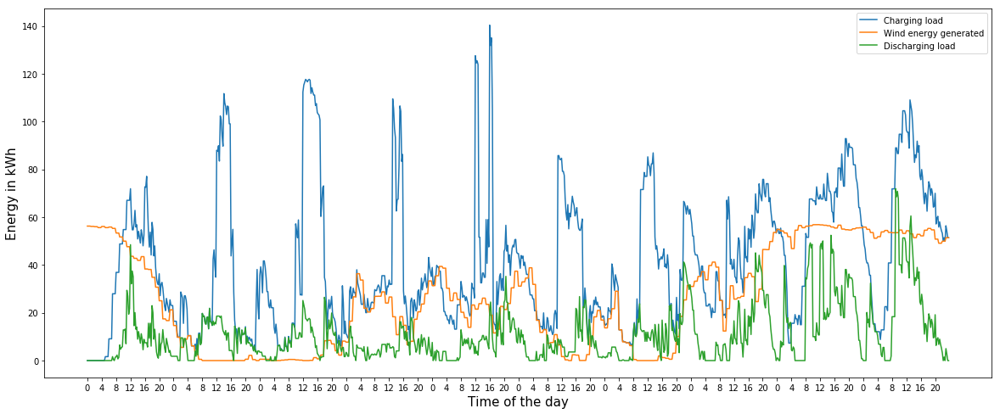

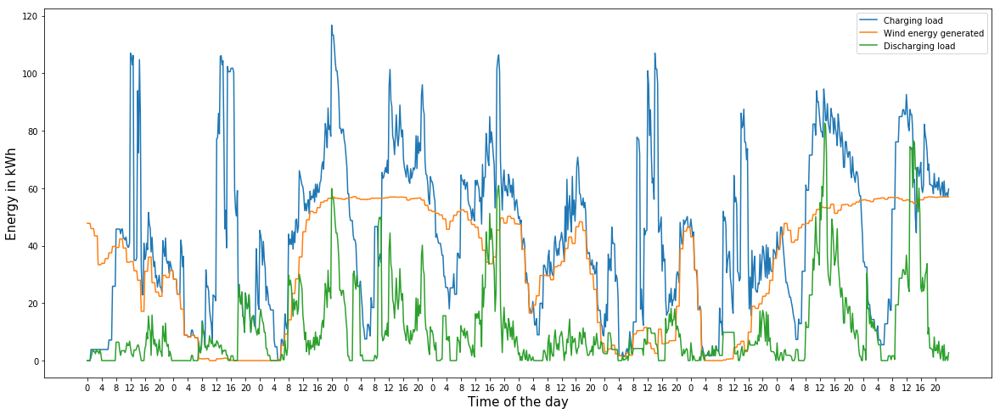

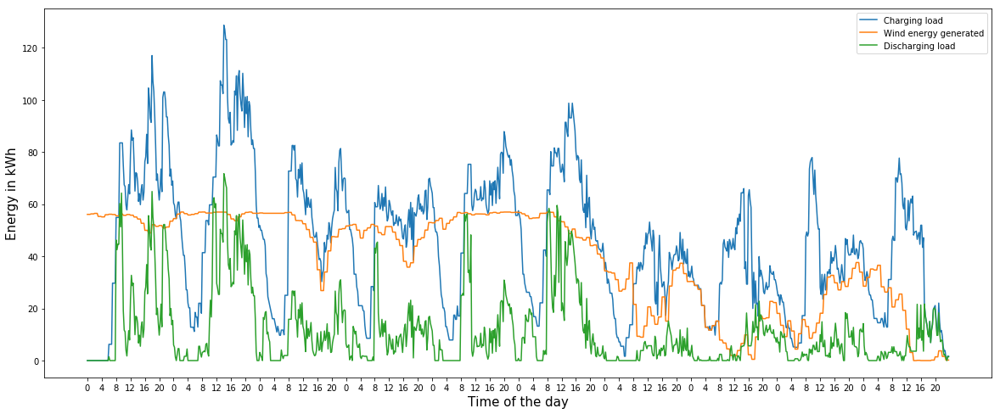

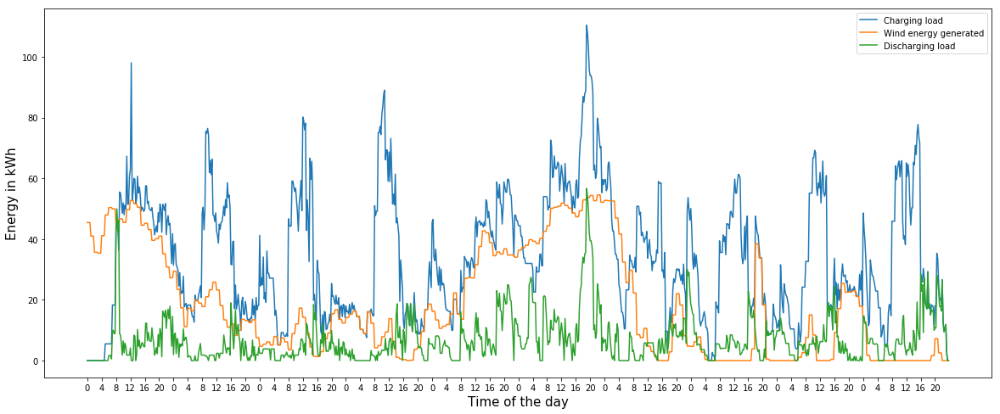

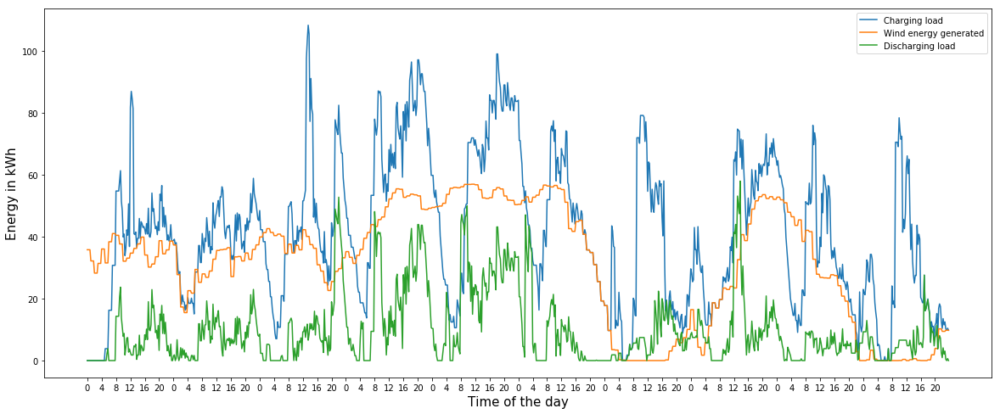

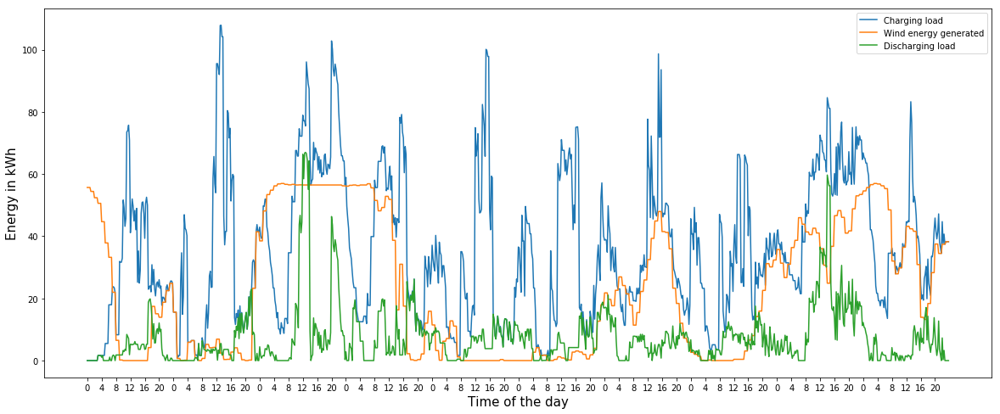

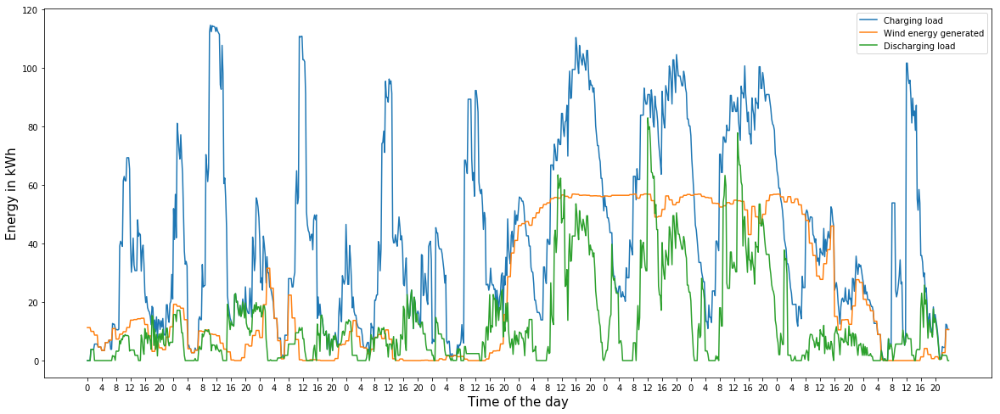

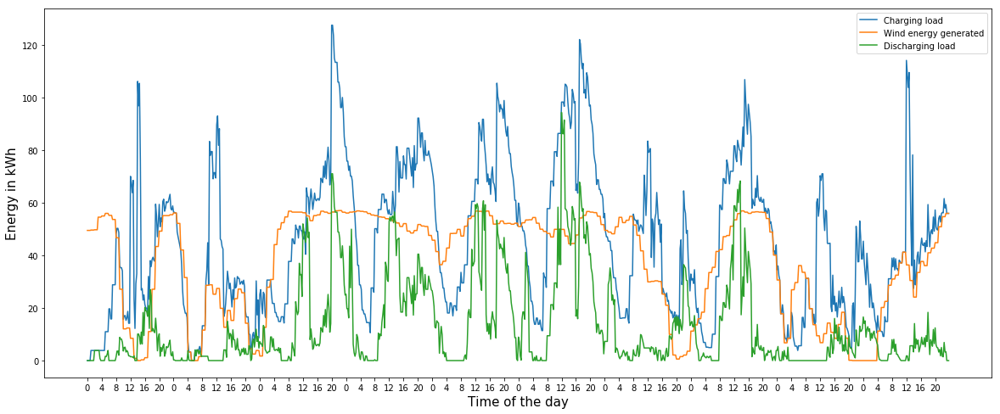

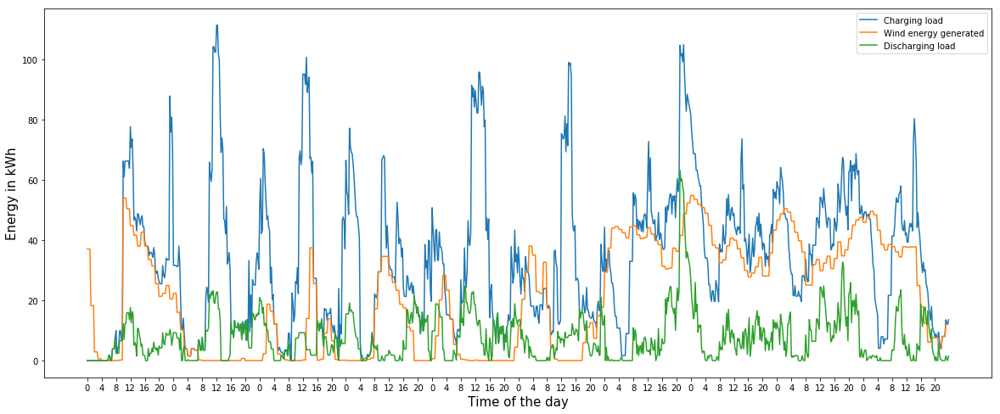

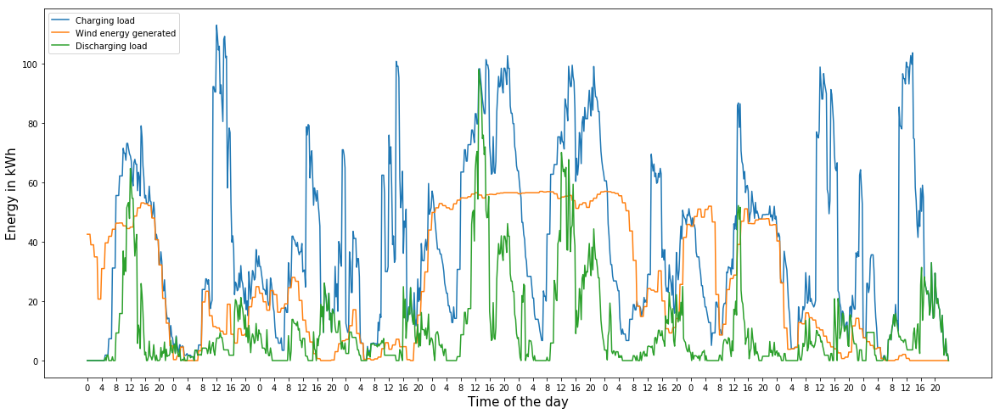

In [9]:
l=1
simulate_dynamic(S=10,low_Td=4, max_Td=12, eta_v=0.9, delta=0.25, delta1=1, delta2=0, delta3=1, NumberOfDays=10, eta_DC_v=0.9,
                            Day_of_Month=15, p=1, Trans_P = 100, timelim =1000)
l+=1

#### Performance evaluation for value of flexibility

C:\tools\Anaconda3\lib\site-packages\pandas\core\frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]



Solving problem at TIME 0_1

Solving problem at TIME 0_2

Solving problem at TIME 0_3

Solving problem at TIME 0_4

Solving problem at TIME 0_5
NumVar and NumConstr = 133, 201

Solving problem at TIME 0_6
NumVar and NumConstr = 268, 408

Solving problem at TIME 0_7
NumVar and NumConstr = 514, 827

Solving problem at TIME 0_8
NumVar and NumConstr = 607, 970

Solving problem at TIME 0_9
NumVar and NumConstr = 808, 1267

Solving problem at TIME 0_10
NumVar and NumConstr = 746, 1167

Solving problem at TIME 0_11
NumVar and NumConstr = 842, 1329

Solving problem at TIME 0_12
NumVar and NumConstr = 883, 1382

Solving problem at TIME 0_13
NumVar and NumConstr = 1017, 1595

Solving problem at TIME 0_14
NumVar and NumConstr = 1156, 1811

Solving problem at TIME 0_15
NumVar and NumConstr = 1145, 1782

Solving problem at TIME 0_16
NumVar and NumConstr = 1196, 1884

Solving problem at TIME 0_17
NumVar and NumConstr = 1008, 1594

Solving problem at TIME 0_18
NumVar and NumConstr = 1001, 1616

Solv

NumVar and NumConstr = 1003, 1598

Solving problem at TIME 0_134
NumVar and NumConstr = 1014, 1615

Solving problem at TIME 0_135
NumVar and NumConstr = 1008, 1631

Solving problem at TIME 0_136
NumVar and NumConstr = 1073, 1728

Solving problem at TIME 0_137
NumVar and NumConstr = 1047, 1699

Solving problem at TIME 0_138
NumVar and NumConstr = 1217, 1930

Solving problem at TIME 0_139
NumVar and NumConstr = 1176, 1837

Solving problem at TIME 0_140
NumVar and NumConstr = 1048, 1626

Solving problem at TIME 0_141
NumVar and NumConstr = 1001, 1549

Solving problem at TIME 0_142
NumVar and NumConstr = 833, 1300

Solving problem at TIME 0_143
NumVar and NumConstr = 756, 1176

Solving problem at TIME 0_144
NumVar and NumConstr = 558, 867

Solving problem at TIME 0_145
NumVar and NumConstr = 399, 624

Solving problem at TIME 0_146
NumVar and NumConstr = 263, 414

Solving problem at TIME 0_147
NumVar and NumConstr = 161, 252

Solving problem at TIME 0_148
NumVar and NumConstr = 102, 159

So


Solving problem at TIME 1_23
NumVar and NumConstr = 637, 999

Solving problem at TIME 1_24
NumVar and NumConstr = 568, 888

Solving problem at TIME 1_25
NumVar and NumConstr = 382, 597

Solving problem at TIME 1_26
NumVar and NumConstr = 256, 402

Solving problem at TIME 1_27
NumVar and NumConstr = 158, 249

Solving problem at TIME 1_28
NumVar and NumConstr = 181, 279

Solving problem at TIME 1_29
NumVar and NumConstr = 171, 279

Solving problem at TIME 1_30
NumVar and NumConstr = 215, 349

Solving problem at TIME 1_31
NumVar and NumConstr = 555, 874

Solving problem at TIME 1_32
NumVar and NumConstr = 1092, 1708

Solving problem at TIME 1_33
NumVar and NumConstr = 1379, 2153

Solving problem at TIME 1_34
NumVar and NumConstr = 1519, 2358

Solving problem at TIME 1_35
NumVar and NumConstr = 1434, 2244

Solving problem at TIME 1_36
NumVar and NumConstr = 1432, 2263

Solving problem at TIME 1_37
NumVar and NumConstr = 1549, 2426

Solving problem at TIME 1_38
NumVar and NumConstr = 1367,

NumVar and NumConstr = 1088, 1747

Solving problem at TIME 1_153
NumVar and NumConstr = 1367, 2151

Solving problem at TIME 1_154
NumVar and NumConstr = 1382, 2173

Solving problem at TIME 1_155
NumVar and NumConstr = 1435, 2232

Solving problem at TIME 1_156
NumVar and NumConstr = 1380, 2146

Solving problem at TIME 1_157
NumVar and NumConstr = 1222, 1910

Solving problem at TIME 1_158
NumVar and NumConstr = 1177, 1853

Solving problem at TIME 1_159
NumVar and NumConstr = 1372, 2161

Solving problem at TIME 1_160
NumVar and NumConstr = 1189, 1883

Solving problem at TIME 1_161
NumVar and NumConstr = 1313, 2055

Solving problem at TIME 1_162
NumVar and NumConstr = 1397, 2186

Solving problem at TIME 1_163
NumVar and NumConstr = 1186, 1849

Solving problem at TIME 1_164
NumVar and NumConstr = 890, 1387

Solving problem at TIME 1_165
NumVar and NumConstr = 826, 1302

Solving problem at TIME 1_166
NumVar and NumConstr = 626, 986

Solving problem at TIME 1_167
NumVar and NumConstr = 412, 6

NumVar and NumConstr = 929, 1450

Solving problem at TIME 2_46
NumVar and NumConstr = 704, 1107

Solving problem at TIME 2_47
NumVar and NumConstr = 493, 778

Solving problem at TIME 2_48
NumVar and NumConstr = 399, 624

Solving problem at TIME 2_49
NumVar and NumConstr = 273, 426

Solving problem at TIME 2_50
NumVar and NumConstr = 185, 291

Solving problem at TIME 2_51
NumVar and NumConstr = 113, 177

Solving problem at TIME 2_52
NumVar and NumConstr = 72, 111

Solving problem at TIME 2_53
NumVar and NumConstr = 66, 110

Solving problem at TIME 2_54
NumVar and NumConstr = 214, 331

Solving problem at TIME 2_55
NumVar and NumConstr = 484, 761

Solving problem at TIME 2_56
NumVar and NumConstr = 1078, 1749

Solving problem at TIME 2_57
NumVar and NumConstr = 1299, 2057

Solving problem at TIME 2_58
NumVar and NumConstr = 1271, 2007

Solving problem at TIME 2_59
NumVar and NumConstr = 1158, 1826

Solving problem at TIME 2_60
NumVar and NumConstr = 1188, 1888

Solving problem at TIME 2_6

NumVar and NumConstr = 664, 1043

Solving problem at TIME 2_177
NumVar and NumConstr = 891, 1389

Solving problem at TIME 2_178
NumVar and NumConstr = 889, 1404

Solving problem at TIME 2_179
NumVar and NumConstr = 1113, 1731

Solving problem at TIME 2_180
NumVar and NumConstr = 1206, 1882

Solving problem at TIME 2_181
NumVar and NumConstr = 1423, 2245

Solving problem at TIME 2_182
NumVar and NumConstr = 1454, 2298

Solving problem at TIME 2_183
NumVar and NumConstr = 1314, 2065

Solving problem at TIME 2_184
NumVar and NumConstr = 1273, 2004

Solving problem at TIME 2_185
NumVar and NumConstr = 1292, 2035

Solving problem at TIME 2_186
NumVar and NumConstr = 1163, 1842

Solving problem at TIME 2_187
NumVar and NumConstr = 1000, 1597

Solving problem at TIME 2_188
NumVar and NumConstr = 797, 1270

Solving problem at TIME 2_189
NumVar and NumConstr = 561, 903

Solving problem at TIME 2_190
NumVar and NumConstr = 370, 602

Solving problem at TIME 2_191
NumVar and NumConstr = 255, 419



NumVar and NumConstr = 712, 1111

Solving problem at TIME 3_69
NumVar and NumConstr = 652, 1013

Solving problem at TIME 3_70
NumVar and NumConstr = 518, 804

Solving problem at TIME 3_71
NumVar and NumConstr = 430, 669

Solving problem at TIME 3_72
NumVar and NumConstr = 347, 540

Solving problem at TIME 3_73
NumVar and NumConstr = 243, 378

Solving problem at TIME 3_74
NumVar and NumConstr = 164, 258

Solving problem at TIME 3_75
NumVar and NumConstr = 98, 153

Solving problem at TIME 3_76
NumVar and NumConstr = 59, 93

Solving problem at TIME 3_77
NumVar and NumConstr = 27, 45

Solving problem at TIME 3_78
NumVar and NumConstr = 255, 390

Solving problem at TIME 3_79
NumVar and NumConstr = 478, 752

Solving problem at TIME 3_80
NumVar and NumConstr = 911, 1435

Solving problem at TIME 3_81
NumVar and NumConstr = 1260, 2000

Solving problem at TIME 3_82
NumVar and NumConstr = 1389, 2215

Solving problem at TIME 3_83
NumVar and NumConstr = 1111, 1755

Solving problem at TIME 3_84
NumV

NumVar and NumConstr = 527, 836

Solving problem at TIME 3_200
NumVar and NumConstr = 634, 990

Solving problem at TIME 3_201
NumVar and NumConstr = 1025, 1593

Solving problem at TIME 3_202
NumVar and NumConstr = 1260, 1960

Solving problem at TIME 3_203
NumVar and NumConstr = 1359, 2114

Solving problem at TIME 3_204
NumVar and NumConstr = 1395, 2166

Solving problem at TIME 3_205
NumVar and NumConstr = 1333, 2067

Solving problem at TIME 3_206
NumVar and NumConstr = 1182, 1831

Solving problem at TIME 3_207
NumVar and NumConstr = 1293, 2013

Solving problem at TIME 3_208
NumVar and NumConstr = 1419, 2203

Solving problem at TIME 3_209
NumVar and NumConstr = 1230, 1925

Solving problem at TIME 3_210
NumVar and NumConstr = 1019, 1600

Solving problem at TIME 3_211
NumVar and NumConstr = 967, 1524

Solving problem at TIME 3_212
NumVar and NumConstr = 881, 1379

Solving problem at TIME 3_213
NumVar and NumConstr = 762, 1198

Solving problem at TIME 3_214
NumVar and NumConstr = 589, 926


NumVar and NumConstr = 1038, 1630

Solving problem at TIME 4_92
NumVar and NumConstr = 920, 1439

Solving problem at TIME 4_93
NumVar and NumConstr = 886, 1370

Solving problem at TIME 4_94
NumVar and NumConstr = 683, 1056

Solving problem at TIME 4_95
NumVar and NumConstr = 622, 963

Solving problem at TIME 4_96
NumVar and NumConstr = 463, 720

Solving problem at TIME 4_97
NumVar and NumConstr = 351, 554

Solving problem at TIME 4_98
NumVar and NumConstr = 245, 388

Solving problem at TIME 4_99
NumVar and NumConstr = 157, 246

Solving problem at TIME 4_100
NumVar and NumConstr = 98, 156

Solving problem at TIME 4_101
NumVar and NumConstr = 127, 198

Solving problem at TIME 4_102
NumVar and NumConstr = 139, 213

Solving problem at TIME 4_103
NumVar and NumConstr = 241, 381

Solving problem at TIME 4_104
NumVar and NumConstr = 857, 1359

Solving problem at TIME 4_105
NumVar and NumConstr = 894, 1413

Solving problem at TIME 4_106
NumVar and NumConstr = 950, 1499

Solving problem at TIME

NumVar and NumConstr = 164, 249

Solving problem at TIME 4_222
NumVar and NumConstr = 245, 395

Solving problem at TIME 4_223
NumVar and NumConstr = 793, 1234

Solving problem at TIME 4_224
NumVar and NumConstr = 991, 1570

Solving problem at TIME 4_225
NumVar and NumConstr = 1139, 1807

Solving problem at TIME 4_226
NumVar and NumConstr = 1127, 1780

Solving problem at TIME 4_227
NumVar and NumConstr = 975, 1541

Solving problem at TIME 4_228
NumVar and NumConstr = 774, 1221

Solving problem at TIME 4_229
NumVar and NumConstr = 940, 1472

Solving problem at TIME 4_230
NumVar and NumConstr = 736, 1163

Solving problem at TIME 4_231
NumVar and NumConstr = 1237, 1918

Solving problem at TIME 4_232
NumVar and NumConstr = 1414, 2202

Solving problem at TIME 4_233
NumVar and NumConstr = 1348, 2105

Solving problem at TIME 4_234
NumVar and NumConstr = 1344, 2099

Solving problem at TIME 4_235
NumVar and NumConstr = 1220, 1902

Solving problem at TIME 4_236
NumVar and NumConstr = 1016, 1600



NumVar and NumConstr = 1124, 1746

Solving problem at TIME 5_113
NumVar and NumConstr = 1249, 1945

Solving problem at TIME 5_114
NumVar and NumConstr = 1367, 2148

Solving problem at TIME 5_115
NumVar and NumConstr = 1123, 1759

Solving problem at TIME 5_116
NumVar and NumConstr = 971, 1516

Solving problem at TIME 5_117
NumVar and NumConstr = 824, 1276

Solving problem at TIME 5_118
NumVar and NumConstr = 737, 1143

Solving problem at TIME 5_119
NumVar and NumConstr = 673, 1044

Solving problem at TIME 5_120
NumVar and NumConstr = 565, 887

Solving problem at TIME 5_121
NumVar and NumConstr = 413, 651

Solving problem at TIME 5_122
NumVar and NumConstr = 409, 670

Solving problem at TIME 5_123
NumVar and NumConstr = 299, 488

Solving problem at TIME 5_124
NumVar and NumConstr = 223, 367

Solving problem at TIME 5_125
NumVar and NumConstr = 159, 267

Solving problem at TIME 5_126
NumVar and NumConstr = 187, 322

Solving problem at TIME 5_127
NumVar and NumConstr = 501, 790

Solving pr


Solving problem at TIME 6_1
NumVar and NumConstr = 57, 87

Solving problem at TIME 6_2
NumVar and NumConstr = 56, 93

Solving problem at TIME 6_3
NumVar and NumConstr = 32, 53

Solving problem at TIME 6_4
NumVar and NumConstr = 9, 15

Solving problem at TIME 6_5
NumVar and NumConstr = 109, 165

Solving problem at TIME 6_6
NumVar and NumConstr = 93, 141

Solving problem at TIME 6_7
NumVar and NumConstr = 479, 754

Solving problem at TIME 6_8
NumVar and NumConstr = 747, 1195

Solving problem at TIME 6_9
NumVar and NumConstr = 832, 1309

Solving problem at TIME 6_10
NumVar and NumConstr = 851, 1351

Solving problem at TIME 6_11
NumVar and NumConstr = 757, 1193

Solving problem at TIME 6_12
NumVar and NumConstr = 824, 1284

Solving problem at TIME 6_13
NumVar and NumConstr = 753, 1171

Solving problem at TIME 6_14
NumVar and NumConstr = 807, 1266

Solving problem at TIME 6_15
NumVar and NumConstr = 961, 1489

Solving problem at TIME 6_16
NumVar and NumConstr = 1075, 1665

Solving problem 

NumVar and NumConstr = 1100, 1725

Solving problem at TIME 6_132
NumVar and NumConstr = 1061, 1676

Solving problem at TIME 6_133
NumVar and NumConstr = 1303, 2030

Solving problem at TIME 6_134
NumVar and NumConstr = 1219, 1895

Solving problem at TIME 6_135
NumVar and NumConstr = 1020, 1597

Solving problem at TIME 6_136
NumVar and NumConstr = 1008, 1568

Solving problem at TIME 6_137
NumVar and NumConstr = 1002, 1585

Solving problem at TIME 6_138
NumVar and NumConstr = 1003, 1605

Solving problem at TIME 6_139
NumVar and NumConstr = 986, 1557

Solving problem at TIME 6_140
NumVar and NumConstr = 1066, 1660

Solving problem at TIME 6_141
NumVar and NumConstr = 847, 1316

Solving problem at TIME 6_142
NumVar and NumConstr = 671, 1041

Solving problem at TIME 6_143
NumVar and NumConstr = 490, 765

Solving problem at TIME 6_144
NumVar and NumConstr = 555, 864

Solving problem at TIME 6_145
NumVar and NumConstr = 403, 624

Solving problem at TIME 6_146
NumVar and NumConstr = 294, 459

S

NumVar and NumConstr = 1028, 1622

Solving problem at TIME 7_21
NumVar and NumConstr = 796, 1250

Solving problem at TIME 7_22
NumVar and NumConstr = 572, 894

Solving problem at TIME 7_23
NumVar and NumConstr = 473, 741

Solving problem at TIME 7_24
NumVar and NumConstr = 398, 624

Solving problem at TIME 7_25
NumVar and NumConstr = 266, 414

Solving problem at TIME 7_26
NumVar and NumConstr = 183, 285

Solving problem at TIME 7_27
NumVar and NumConstr = 127, 198

Solving problem at TIME 7_28
NumVar and NumConstr = 84, 132

Solving problem at TIME 7_29
NumVar and NumConstr = 53, 81

Solving problem at TIME 7_30
NumVar and NumConstr = 191, 298

Solving problem at TIME 7_31
NumVar and NumConstr = 481, 737

Solving problem at TIME 7_32
NumVar and NumConstr = 1132, 1764

Solving problem at TIME 7_33
NumVar and NumConstr = 1516, 2360

Solving problem at TIME 7_34
NumVar and NumConstr = 1353, 2105

Solving problem at TIME 7_35
NumVar and NumConstr = 1198, 1877

Solving problem at TIME 7_36


NumVar and NumConstr = 276, 454

Solving problem at TIME 7_151
NumVar and NumConstr = 435, 713

Solving problem at TIME 7_152
NumVar and NumConstr = 1081, 1740

Solving problem at TIME 7_153
NumVar and NumConstr = 1181, 1878

Solving problem at TIME 7_154
NumVar and NumConstr = 1227, 1952

Solving problem at TIME 7_155
NumVar and NumConstr = 1260, 1999

Solving problem at TIME 7_156
NumVar and NumConstr = 983, 1547

Solving problem at TIME 7_157
NumVar and NumConstr = 967, 1523

Solving problem at TIME 7_158
NumVar and NumConstr = 1429, 2237

Solving problem at TIME 7_159
NumVar and NumConstr = 1387, 2173

Solving problem at TIME 7_160
NumVar and NumConstr = 1288, 2008

Solving problem at TIME 7_161
NumVar and NumConstr = 1353, 2131

Solving problem at TIME 7_162
NumVar and NumConstr = 1171, 1882

Solving problem at TIME 7_163
NumVar and NumConstr = 901, 1465

Solving problem at TIME 7_164
NumVar and NumConstr = 754, 1209

Solving problem at TIME 7_165
NumVar and NumConstr = 648, 1040


NumVar and NumConstr = 1321, 2067

Solving problem at TIME 8_43
NumVar and NumConstr = 1321, 2062

Solving problem at TIME 8_44
NumVar and NumConstr = 1260, 1971

Solving problem at TIME 8_45
NumVar and NumConstr = 1327, 2102

Solving problem at TIME 8_46
NumVar and NumConstr = 1144, 1808

Solving problem at TIME 8_47
NumVar and NumConstr = 840, 1329

Solving problem at TIME 8_48
NumVar and NumConstr = 595, 936

Solving problem at TIME 8_49
NumVar and NumConstr = 423, 667

Solving problem at TIME 8_50
NumVar and NumConstr = 297, 484

Solving problem at TIME 8_51
NumVar and NumConstr = 179, 294

Solving problem at TIME 8_52
NumVar and NumConstr = 101, 164

Solving problem at TIME 8_53
NumVar and NumConstr = 83, 133

Solving problem at TIME 8_54
NumVar and NumConstr = 214, 330

Solving problem at TIME 8_55
NumVar and NumConstr = 563, 879

Solving problem at TIME 8_56
NumVar and NumConstr = 1075, 1677

Solving problem at TIME 8_57
NumVar and NumConstr = 1227, 1931

Solving problem at TIME


Solving problem at TIME 8_174
NumVar and NumConstr = 197, 307

Solving problem at TIME 8_175
NumVar and NumConstr = 422, 646

Solving problem at TIME 8_176
NumVar and NumConstr = 1024, 1608

Solving problem at TIME 8_177
NumVar and NumConstr = 1102, 1739

Solving problem at TIME 8_178
NumVar and NumConstr = 1035, 1609

Solving problem at TIME 8_179
NumVar and NumConstr = 1140, 1767

Solving problem at TIME 8_180
NumVar and NumConstr = 1403, 2178

Solving problem at TIME 8_181
NumVar and NumConstr = 1503, 2370

Solving problem at TIME 8_182
NumVar and NumConstr = 1583, 2469

Solving problem at TIME 8_183
NumVar and NumConstr = 1378, 2163

Solving problem at TIME 8_184
NumVar and NumConstr = 1319, 2086

Solving problem at TIME 8_185
NumVar and NumConstr = 1546, 2434

Solving problem at TIME 8_186
NumVar and NumConstr = 1494, 2358

Solving problem at TIME 8_187
NumVar and NumConstr = 1379, 2164

Solving problem at TIME 8_188
NumVar and NumConstr = 1100, 1724

Solving problem at TIME 8_18

NumVar and NumConstr = 936, 1512

Solving problem at TIME 9_67
NumVar and NumConstr = 1048, 1646

Solving problem at TIME 9_68
NumVar and NumConstr = 916, 1433

Solving problem at TIME 9_69
NumVar and NumConstr = 970, 1509

Solving problem at TIME 9_70
NumVar and NumConstr = 788, 1219

Solving problem at TIME 9_71
NumVar and NumConstr = 734, 1143

Solving problem at TIME 9_72
NumVar and NumConstr = 575, 901

Solving problem at TIME 9_73
NumVar and NumConstr = 419, 656

Solving problem at TIME 9_74
NumVar and NumConstr = 279, 438

Solving problem at TIME 9_75
NumVar and NumConstr = 175, 279

Solving problem at TIME 9_76
NumVar and NumConstr = 87, 138

Solving problem at TIME 9_77
NumVar and NumConstr = 43, 69

Solving problem at TIME 9_78
NumVar and NumConstr = 263, 424

Solving problem at TIME 9_79
NumVar and NumConstr = 455, 708

Solving problem at TIME 9_80
NumVar and NumConstr = 759, 1177

Solving problem at TIME 9_81
NumVar and NumConstr = 894, 1390

Solving problem at TIME 9_82
Nu


Solving problem at TIME 9_199
NumVar and NumConstr = 524, 845

Solving problem at TIME 9_200
NumVar and NumConstr = 1215, 1930

Solving problem at TIME 9_201
NumVar and NumConstr = 1397, 2241

Solving problem at TIME 9_202
NumVar and NumConstr = 1239, 1968

Solving problem at TIME 9_203
NumVar and NumConstr = 1187, 1863

Solving problem at TIME 9_204
NumVar and NumConstr = 1048, 1655

Solving problem at TIME 9_205
NumVar and NumConstr = 1119, 1776

Solving problem at TIME 9_206
NumVar and NumConstr = 1159, 1837

Solving problem at TIME 9_207
NumVar and NumConstr = 1172, 1847

Solving problem at TIME 9_208
NumVar and NumConstr = 1301, 2057

Solving problem at TIME 9_209
NumVar and NumConstr = 1115, 1758

Solving problem at TIME 9_210
NumVar and NumConstr = 1065, 1683

Solving problem at TIME 9_211
NumVar and NumConstr = 1207, 1891

Solving problem at TIME 9_212
NumVar and NumConstr = 970, 1514

Solving problem at TIME 9_213
NumVar and NumConstr = 924, 1466

Solving problem at TIME 9_21

C:\tools\Anaconda3\lib\site-packages\pandas\core\frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]



Solving problem at TIME 0_1

Solving problem at TIME 0_2

Solving problem at TIME 0_3

Solving problem at TIME 0_4

Solving problem at TIME 0_5
NumVar and NumConstr = 133, 201

Solving problem at TIME 0_6
NumVar and NumConstr = 268, 408

Solving problem at TIME 0_7
NumVar and NumConstr = 514, 827

Solving problem at TIME 0_8
NumVar and NumConstr = 607, 970

Solving problem at TIME 0_9
NumVar and NumConstr = 808, 1267

Solving problem at TIME 0_10
NumVar and NumConstr = 746, 1167

Solving problem at TIME 0_11
NumVar and NumConstr = 842, 1329

Solving problem at TIME 0_12
NumVar and NumConstr = 883, 1382

Solving problem at TIME 0_13
NumVar and NumConstr = 1017, 1595

Solving problem at TIME 0_14
NumVar and NumConstr = 1156, 1811

Solving problem at TIME 0_15
NumVar and NumConstr = 1145, 1782

Solving problem at TIME 0_16
NumVar and NumConstr = 1196, 1884

Solving problem at TIME 0_17
NumVar and NumConstr = 1008, 1594

Solving problem at TIME 0_18
NumVar and NumConstr = 1001, 1616

Solv

NumVar and NumConstr = 1003, 1598

Solving problem at TIME 0_134
NumVar and NumConstr = 1014, 1615

Solving problem at TIME 0_135
NumVar and NumConstr = 1008, 1631

Solving problem at TIME 0_136
NumVar and NumConstr = 1073, 1728

Solving problem at TIME 0_137
NumVar and NumConstr = 1047, 1699

Solving problem at TIME 0_138
NumVar and NumConstr = 1217, 1930

Solving problem at TIME 0_139
NumVar and NumConstr = 1176, 1837

Solving problem at TIME 0_140
NumVar and NumConstr = 1048, 1626

Solving problem at TIME 0_141
NumVar and NumConstr = 1001, 1549

Solving problem at TIME 0_142
NumVar and NumConstr = 833, 1300

Solving problem at TIME 0_143
NumVar and NumConstr = 756, 1176

Solving problem at TIME 0_144
NumVar and NumConstr = 558, 867

Solving problem at TIME 0_145
NumVar and NumConstr = 399, 624

Solving problem at TIME 0_146
NumVar and NumConstr = 263, 414

Solving problem at TIME 0_147
NumVar and NumConstr = 161, 252

Solving problem at TIME 0_148
NumVar and NumConstr = 102, 159

So

Solving problem at TIME 1_23
NumVar and NumConstr = 637, 999

Solving problem at TIME 1_24
NumVar and NumConstr = 568, 888

Solving problem at TIME 1_25
NumVar and NumConstr = 382, 597

Solving problem at TIME 1_26
NumVar and NumConstr = 256, 402

Solving problem at TIME 1_27
NumVar and NumConstr = 158, 249

Solving problem at TIME 1_28
NumVar and NumConstr = 181, 279

Solving problem at TIME 1_29
NumVar and NumConstr = 171, 279

Solving problem at TIME 1_30
NumVar and NumConstr = 215, 349

Solving problem at TIME 1_31
NumVar and NumConstr = 555, 874

Solving problem at TIME 1_32
NumVar and NumConstr = 1092, 1708

Solving problem at TIME 1_33
NumVar and NumConstr = 1379, 2153

Solving problem at TIME 1_34
NumVar and NumConstr = 1519, 2358

Solving problem at TIME 1_35
NumVar and NumConstr = 1434, 2244

Solving problem at TIME 1_36
NumVar and NumConstr = 1432, 2263

Solving problem at TIME 1_37
NumVar and NumConstr = 1549, 2426

Solving problem at TIME 1_38
NumVar and NumConstr = 1367, 

NumVar and NumConstr = 1088, 1747

Solving problem at TIME 1_153
NumVar and NumConstr = 1367, 2151

Solving problem at TIME 1_154
NumVar and NumConstr = 1382, 2173

Solving problem at TIME 1_155
NumVar and NumConstr = 1435, 2232

Solving problem at TIME 1_156
NumVar and NumConstr = 1380, 2146

Solving problem at TIME 1_157
NumVar and NumConstr = 1222, 1910

Solving problem at TIME 1_158
NumVar and NumConstr = 1177, 1853

Solving problem at TIME 1_159
NumVar and NumConstr = 1372, 2161

Solving problem at TIME 1_160
NumVar and NumConstr = 1189, 1883

Solving problem at TIME 1_161
NumVar and NumConstr = 1313, 2055

Solving problem at TIME 1_162
NumVar and NumConstr = 1397, 2186

Solving problem at TIME 1_163
NumVar and NumConstr = 1186, 1849

Solving problem at TIME 1_164
NumVar and NumConstr = 890, 1387

Solving problem at TIME 1_165
NumVar and NumConstr = 826, 1302

Solving problem at TIME 1_166
NumVar and NumConstr = 626, 986

Solving problem at TIME 1_167
NumVar and NumConstr = 412, 6

NumVar and NumConstr = 929, 1450

Solving problem at TIME 2_46
NumVar and NumConstr = 704, 1107

Solving problem at TIME 2_47
NumVar and NumConstr = 493, 778

Solving problem at TIME 2_48
NumVar and NumConstr = 399, 624

Solving problem at TIME 2_49
NumVar and NumConstr = 273, 426

Solving problem at TIME 2_50
NumVar and NumConstr = 185, 291

Solving problem at TIME 2_51
NumVar and NumConstr = 113, 177

Solving problem at TIME 2_52
NumVar and NumConstr = 72, 111

Solving problem at TIME 2_53
NumVar and NumConstr = 66, 110

Solving problem at TIME 2_54
NumVar and NumConstr = 214, 331

Solving problem at TIME 2_55
NumVar and NumConstr = 484, 761

Solving problem at TIME 2_56
NumVar and NumConstr = 1078, 1749

Solving problem at TIME 2_57
NumVar and NumConstr = 1299, 2057

Solving problem at TIME 2_58
NumVar and NumConstr = 1271, 2007

Solving problem at TIME 2_59
NumVar and NumConstr = 1158, 1826

Solving problem at TIME 2_60
NumVar and NumConstr = 1188, 1888

Solving problem at TIME 2_6

NumVar and NumConstr = 674, 1042

Solving problem at TIME 3_68
NumVar and NumConstr = 712, 1111

Solving problem at TIME 3_69
NumVar and NumConstr = 652, 1013

Solving problem at TIME 3_70
NumVar and NumConstr = 518, 804

Solving problem at TIME 3_71
NumVar and NumConstr = 430, 669

Solving problem at TIME 3_72
NumVar and NumConstr = 347, 540

Solving problem at TIME 3_73
NumVar and NumConstr = 243, 378

Solving problem at TIME 3_74
NumVar and NumConstr = 164, 258

Solving problem at TIME 3_75
NumVar and NumConstr = 98, 153

Solving problem at TIME 3_76
NumVar and NumConstr = 59, 93

Solving problem at TIME 3_77
NumVar and NumConstr = 27, 45

Solving problem at TIME 3_78
NumVar and NumConstr = 255, 390

Solving problem at TIME 3_79
NumVar and NumConstr = 478, 752

Solving problem at TIME 3_80
NumVar and NumConstr = 911, 1435

Solving problem at TIME 3_81
NumVar and NumConstr = 1260, 2000

Solving problem at TIME 3_82
NumVar and NumConstr = 1389, 2215

Solving problem at TIME 3_83
NumVa

NumVar and NumConstr = 527, 836

Solving problem at TIME 3_200
NumVar and NumConstr = 634, 990

Solving problem at TIME 3_201
NumVar and NumConstr = 1025, 1593

Solving problem at TIME 3_202
NumVar and NumConstr = 1260, 1960

Solving problem at TIME 3_203
NumVar and NumConstr = 1359, 2114

Solving problem at TIME 3_204
NumVar and NumConstr = 1395, 2166

Solving problem at TIME 3_205
NumVar and NumConstr = 1333, 2067

Solving problem at TIME 3_206
NumVar and NumConstr = 1182, 1831

Solving problem at TIME 3_207
NumVar and NumConstr = 1293, 2013

Solving problem at TIME 3_208
NumVar and NumConstr = 1419, 2203

Solving problem at TIME 3_209
NumVar and NumConstr = 1230, 1925

Solving problem at TIME 3_210
NumVar and NumConstr = 1019, 1600

Solving problem at TIME 3_211
NumVar and NumConstr = 967, 1524

Solving problem at TIME 3_212
NumVar and NumConstr = 881, 1379

Solving problem at TIME 3_213
NumVar and NumConstr = 762, 1198

Solving problem at TIME 3_214
NumVar and NumConstr = 589, 926


NumVar and NumConstr = 920, 1439

Solving problem at TIME 4_93
NumVar and NumConstr = 886, 1370

Solving problem at TIME 4_94
NumVar and NumConstr = 683, 1056

Solving problem at TIME 4_95
NumVar and NumConstr = 622, 963

Solving problem at TIME 4_96
NumVar and NumConstr = 463, 720

Solving problem at TIME 4_97
NumVar and NumConstr = 351, 554

Solving problem at TIME 4_98
NumVar and NumConstr = 245, 388

Solving problem at TIME 4_99
NumVar and NumConstr = 157, 246

Solving problem at TIME 4_100
NumVar and NumConstr = 98, 156

Solving problem at TIME 4_101
NumVar and NumConstr = 127, 198

Solving problem at TIME 4_102
NumVar and NumConstr = 139, 213

Solving problem at TIME 4_103
NumVar and NumConstr = 241, 381

Solving problem at TIME 4_104
NumVar and NumConstr = 857, 1359

Solving problem at TIME 4_105
NumVar and NumConstr = 894, 1413

Solving problem at TIME 4_106
NumVar and NumConstr = 950, 1499

Solving problem at TIME 4_107
NumVar and NumConstr = 808, 1265

Solving problem at TIME

NumVar and NumConstr = 245, 395

Solving problem at TIME 4_223
NumVar and NumConstr = 793, 1234

Solving problem at TIME 4_224
NumVar and NumConstr = 991, 1570

Solving problem at TIME 4_225
NumVar and NumConstr = 1139, 1807

Solving problem at TIME 4_226
NumVar and NumConstr = 1127, 1780

Solving problem at TIME 4_227
NumVar and NumConstr = 975, 1541

Solving problem at TIME 4_228
NumVar and NumConstr = 774, 1221

Solving problem at TIME 4_229
NumVar and NumConstr = 940, 1472

Solving problem at TIME 4_230
NumVar and NumConstr = 736, 1163

Solving problem at TIME 4_231
NumVar and NumConstr = 1237, 1918

Solving problem at TIME 4_232
NumVar and NumConstr = 1414, 2202

Solving problem at TIME 4_233
NumVar and NumConstr = 1348, 2105

Solving problem at TIME 4_234
NumVar and NumConstr = 1344, 2099

Solving problem at TIME 4_235
NumVar and NumConstr = 1220, 1902

Solving problem at TIME 4_236
NumVar and NumConstr = 1016, 1600

Solving problem at TIME 4_237
NumVar and NumConstr = 762, 1215


NumVar and NumConstr = 1249, 1945

Solving problem at TIME 5_114
NumVar and NumConstr = 1367, 2148

Solving problem at TIME 5_115
NumVar and NumConstr = 1123, 1759

Solving problem at TIME 5_116
NumVar and NumConstr = 971, 1516

Solving problem at TIME 5_117
NumVar and NumConstr = 824, 1276

Solving problem at TIME 5_118
NumVar and NumConstr = 737, 1143

Solving problem at TIME 5_119
NumVar and NumConstr = 673, 1044

Solving problem at TIME 5_120
NumVar and NumConstr = 565, 887

Solving problem at TIME 5_121
NumVar and NumConstr = 413, 651

Solving problem at TIME 5_122
NumVar and NumConstr = 409, 670

Solving problem at TIME 5_123
NumVar and NumConstr = 299, 488

Solving problem at TIME 5_124
NumVar and NumConstr = 223, 367

Solving problem at TIME 5_125
NumVar and NumConstr = 159, 267

Solving problem at TIME 5_126
NumVar and NumConstr = 187, 322

Solving problem at TIME 5_127
NumVar and NumConstr = 501, 790

Solving problem at TIME 5_128
NumVar and NumConstr = 576, 912

Solving prob

NumVar and NumConstr = 479, 754

Solving problem at TIME 6_8
NumVar and NumConstr = 747, 1195

Solving problem at TIME 6_9
NumVar and NumConstr = 832, 1309

Solving problem at TIME 6_10
NumVar and NumConstr = 851, 1351

Solving problem at TIME 6_11
NumVar and NumConstr = 757, 1193

Solving problem at TIME 6_12
NumVar and NumConstr = 824, 1284

Solving problem at TIME 6_13
NumVar and NumConstr = 753, 1171

Solving problem at TIME 6_14
NumVar and NumConstr = 807, 1266

Solving problem at TIME 6_15
NumVar and NumConstr = 961, 1489

Solving problem at TIME 6_16
NumVar and NumConstr = 1075, 1665

Solving problem at TIME 6_17
NumVar and NumConstr = 969, 1515

Solving problem at TIME 6_18
NumVar and NumConstr = 1099, 1706

Solving problem at TIME 6_19
NumVar and NumConstr = 1119, 1745

Solving problem at TIME 6_20
NumVar and NumConstr = 1174, 1827

Solving problem at TIME 6_21
NumVar and NumConstr = 1165, 1818

Solving problem at TIME 6_22
NumVar and NumConstr = 1030, 1602

Solving problem at

NumVar and NumConstr = 1002, 1585

Solving problem at TIME 6_138
NumVar and NumConstr = 1003, 1605

Solving problem at TIME 6_139
NumVar and NumConstr = 986, 1557

Solving problem at TIME 6_140
NumVar and NumConstr = 1066, 1660

Solving problem at TIME 6_141
NumVar and NumConstr = 847, 1316

Solving problem at TIME 6_142
NumVar and NumConstr = 671, 1041

Solving problem at TIME 6_143
NumVar and NumConstr = 490, 765

Solving problem at TIME 6_144
NumVar and NumConstr = 555, 864

Solving problem at TIME 6_145
NumVar and NumConstr = 403, 624

Solving problem at TIME 6_146
NumVar and NumConstr = 294, 459

Solving problem at TIME 6_147
NumVar and NumConstr = 195, 306

Solving problem at TIME 6_148
NumVar and NumConstr = 144, 228

Solving problem at TIME 6_149
NumVar and NumConstr = 184, 294

Solving problem at TIME 6_150
NumVar and NumConstr = 344, 538

Solving problem at TIME 6_151
NumVar and NumConstr = 636, 985

Solving problem at TIME 6_152
NumVar and NumConstr = 1141, 1768

Solving pro

NumVar and NumConstr = 191, 298

Solving problem at TIME 7_31
NumVar and NumConstr = 481, 737

Solving problem at TIME 7_32
NumVar and NumConstr = 1132, 1764

Solving problem at TIME 7_33
NumVar and NumConstr = 1516, 2360

Solving problem at TIME 7_34
NumVar and NumConstr = 1353, 2105

Solving problem at TIME 7_35
NumVar and NumConstr = 1198, 1877

Solving problem at TIME 7_36
NumVar and NumConstr = 1104, 1725

Solving problem at TIME 7_37
NumVar and NumConstr = 1354, 2107

Solving problem at TIME 7_38
NumVar and NumConstr = 1252, 1939

Solving problem at TIME 7_39
NumVar and NumConstr = 1138, 1782

Solving problem at TIME 7_40
NumVar and NumConstr = 1218, 1917

Solving problem at TIME 7_41
NumVar and NumConstr = 975, 1545

Solving problem at TIME 7_42
NumVar and NumConstr = 921, 1443

Solving problem at TIME 7_43
NumVar and NumConstr = 934, 1460

Solving problem at TIME 7_44
NumVar and NumConstr = 939, 1472

Solving problem at TIME 7_45
NumVar and NumConstr = 771, 1206

Solving proble

NumVar and NumConstr = 1288, 2008

Solving problem at TIME 7_161
NumVar and NumConstr = 1353, 2131

Solving problem at TIME 7_162
NumVar and NumConstr = 1171, 1882

Solving problem at TIME 7_163
NumVar and NumConstr = 901, 1465

Solving problem at TIME 7_164
NumVar and NumConstr = 754, 1209

Solving problem at TIME 7_165
NumVar and NumConstr = 648, 1040

Solving problem at TIME 7_166
NumVar and NumConstr = 561, 890

Solving problem at TIME 7_167
NumVar and NumConstr = 379, 598

Solving problem at TIME 7_168
NumVar and NumConstr = 244, 384

Solving problem at TIME 7_169
NumVar and NumConstr = 150, 234

Solving problem at TIME 7_170
NumVar and NumConstr = 102, 159

Solving problem at TIME 7_171
NumVar and NumConstr = 66, 102

Solving problem at TIME 7_172
NumVar and NumConstr = 41, 63

Solving problem at TIME 7_173
NumVar and NumConstr = 166, 252

Solving problem at TIME 7_174
NumVar and NumConstr = 240, 374

Solving problem at TIME 7_175
NumVar and NumConstr = 578, 940

Solving problem 


Solving problem at TIME 8_53
NumVar and NumConstr = 83, 133

Solving problem at TIME 8_54
NumVar and NumConstr = 214, 330

Solving problem at TIME 8_55
NumVar and NumConstr = 563, 879

Solving problem at TIME 8_56
NumVar and NumConstr = 1075, 1677

Solving problem at TIME 8_57
NumVar and NumConstr = 1227, 1931

Solving problem at TIME 8_58
NumVar and NumConstr = 1170, 1827

Solving problem at TIME 8_59
NumVar and NumConstr = 1227, 1904

Solving problem at TIME 8_60
NumVar and NumConstr = 1046, 1631

Solving problem at TIME 8_61
NumVar and NumConstr = 1174, 1824

Solving problem at TIME 8_62
NumVar and NumConstr = 1067, 1650

Solving problem at TIME 8_63
NumVar and NumConstr = 1154, 1780

Solving problem at TIME 8_64
NumVar and NumConstr = 1537, 2367

Solving problem at TIME 8_65
NumVar and NumConstr = 1666, 2587

Solving problem at TIME 8_66
NumVar and NumConstr = 1471, 2284

Solving problem at TIME 8_67
NumVar and NumConstr = 1493, 2305

Solving problem at TIME 8_68
NumVar and NumCon

NumVar and NumConstr = 1583, 2469

Solving problem at TIME 8_183
NumVar and NumConstr = 1378, 2163

Solving problem at TIME 8_184
NumVar and NumConstr = 1319, 2086

Solving problem at TIME 8_185
NumVar and NumConstr = 1546, 2434

Solving problem at TIME 8_186
NumVar and NumConstr = 1494, 2358

Solving problem at TIME 8_187
NumVar and NumConstr = 1379, 2164

Solving problem at TIME 8_188
NumVar and NumConstr = 1100, 1724

Solving problem at TIME 8_189
NumVar and NumConstr = 870, 1361

Solving problem at TIME 8_190
NumVar and NumConstr = 761, 1189

Solving problem at TIME 8_191
NumVar and NumConstr = 789, 1225

Solving problem at TIME 8_192
NumVar and NumConstr = 647, 1012

Solving problem at TIME 8_193
NumVar and NumConstr = 473, 743

Solving problem at TIME 8_194
NumVar and NumConstr = 353, 559

Solving problem at TIME 8_195
NumVar and NumConstr = 250, 394

Solving problem at TIME 8_196
NumVar and NumConstr = 172, 270

Solving problem at TIME 8_197
NumVar and NumConstr = 176, 294

Solv

NumVar and NumConstr = 263, 424

Solving problem at TIME 9_79
NumVar and NumConstr = 455, 708

Solving problem at TIME 9_80
NumVar and NumConstr = 759, 1177

Solving problem at TIME 9_81
NumVar and NumConstr = 894, 1390

Solving problem at TIME 9_82
NumVar and NumConstr = 897, 1391

Solving problem at TIME 9_83
NumVar and NumConstr = 860, 1338

Solving problem at TIME 9_84
NumVar and NumConstr = 961, 1485

Solving problem at TIME 9_85
NumVar and NumConstr = 994, 1539

Solving problem at TIME 9_86
NumVar and NumConstr = 1432, 2226

Solving problem at TIME 9_87
NumVar and NumConstr = 1243, 1947

Solving problem at TIME 9_88
NumVar and NumConstr = 1104, 1734

Solving problem at TIME 9_89
NumVar and NumConstr = 964, 1531

Solving problem at TIME 9_90
NumVar and NumConstr = 806, 1299

Solving problem at TIME 9_91
NumVar and NumConstr = 825, 1307

Solving problem at TIME 9_92
NumVar and NumConstr = 726, 1150

Solving problem at TIME 9_93
NumVar and NumConstr = 684, 1095

Solving problem at T

NumVar and NumConstr = 1172, 1847

Solving problem at TIME 9_208
NumVar and NumConstr = 1301, 2057

Solving problem at TIME 9_209
NumVar and NumConstr = 1115, 1758

Solving problem at TIME 9_210
NumVar and NumConstr = 1065, 1683

Solving problem at TIME 9_211
NumVar and NumConstr = 1207, 1891

Solving problem at TIME 9_212
NumVar and NumConstr = 970, 1514

Solving problem at TIME 9_213
NumVar and NumConstr = 924, 1466

Solving problem at TIME 9_214
NumVar and NumConstr = 768, 1231

Solving problem at TIME 9_215
NumVar and NumConstr = 623, 992

Solving problem at TIME 9_216
NumVar and NumConstr = 433, 690

Solving problem at TIME 9_217
NumVar and NumConstr = 293, 469

Solving problem at TIME 9_218
NumVar and NumConstr = 255, 397

Solving problem at TIME 9_219
NumVar and NumConstr = 180, 279

Solving problem at TIME 9_220
NumVar and NumConstr = 129, 198

Solving problem at TIME 9_221
NumVar and NumConstr = 186, 285

Solving problem at TIME 9_222
NumVar and NumConstr = 439, 672

Solving p

C:\tools\Anaconda3\lib\site-packages\pandas\core\frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]



Solving problem at TIME 0_1

Solving problem at TIME 0_2

Solving problem at TIME 0_3

Solving problem at TIME 0_4

Solving problem at TIME 0_5
NumVar and NumConstr = 232, 300

Solving problem at TIME 0_6
NumVar and NumConstr = 574, 714

Solving problem at TIME 0_7
NumVar and NumConstr = 1003, 1316

Solving problem at TIME 0_8
NumVar and NumConstr = 1231, 1594

Solving problem at TIME 0_9
NumVar and NumConstr = 1492, 1951

Solving problem at TIME 0_10
NumVar and NumConstr = 1406, 1827

Solving problem at TIME 0_11
NumVar and NumConstr = 1508, 1995

Solving problem at TIME 0_12
NumVar and NumConstr = 1495, 1994

Solving problem at TIME 0_13
NumVar and NumConstr = 1644, 2222

Solving problem at TIME 0_14
NumVar and NumConstr = 1840, 2495

Solving problem at TIME 0_15
NumVar and NumConstr = 1730, 2367

Solving problem at TIME 0_16
NumVar and NumConstr = 1796, 2484

Solving problem at TIME 0_17
NumVar and NumConstr = 1506, 2092

Solving problem at TIME 0_18
NumVar and NumConstr = 1409, 20

NumVar and NumConstr = 1510, 2093

Solving problem at TIME 0_133
NumVar and NumConstr = 1690, 2304

Solving problem at TIME 0_134
NumVar and NumConstr = 1653, 2261

Solving problem at TIME 0_135
NumVar and NumConstr = 1704, 2327

Solving problem at TIME 0_136
NumVar and NumConstr = 1886, 2541

Solving problem at TIME 0_137
NumVar and NumConstr = 1905, 2557

Solving problem at TIME 0_138
NumVar and NumConstr = 2039, 2752

Solving problem at TIME 0_139
NumVar and NumConstr = 1956, 2617

Solving problem at TIME 0_140
NumVar and NumConstr = 1762, 2341

Solving problem at TIME 0_141
NumVar and NumConstr = 1664, 2212

Solving problem at TIME 0_142
NumVar and NumConstr = 1430, 1900

Solving problem at TIME 0_143
NumVar and NumConstr = 1272, 1692

Solving problem at TIME 0_144
NumVar and NumConstr = 939, 1248

Solving problem at TIME 0_145
NumVar and NumConstr = 678, 903

Solving problem at TIME 0_146
NumVar and NumConstr = 455, 606

Solving problem at TIME 0_147
NumVar and NumConstr = 290, 38

C:\tools\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


15841.522877412655 2515.897335906928 9450.229769894473

Solving problem at TIME 1_1
NumVar and NumConstr = 129, 196

Solving problem at TIME 1_2
NumVar and NumConstr = 113, 171

Solving problem at TIME 1_3
NumVar and NumConstr = 97, 147

Solving problem at TIME 1_4
NumVar and NumConstr = 81, 123

Solving problem at TIME 1_5
NumVar and NumConstr = 65, 99

Solving problem at TIME 1_6
NumVar and NumConstr = 219, 334

Solving problem at TIME 1_7
NumVar and NumConstr = 644, 905

Solving problem at TIME 1_8
NumVar and NumConstr = 1437, 1950

Solving problem at TIME 1_9
NumVar and NumConstr = 2333, 3126

Solving problem at TIME 1_10
NumVar and NumConstr = 2944, 3890

Solving problem at TIME 1_11
NumVar and NumConstr = 2946, 3963

Solving problem at TIME 1_12
NumVar and NumConstr = 2533, 3436

Solving problem at TIME 1_13
NumVar and NumConstr = 2380, 3200

Solving problem at TIME 1_14
NumVar and NumConstr = 2360, 3155

Solving problem at TIME 1_15
NumVar and NumConstr = 2248, 2983

Solving pro

NumVar and NumConstr = 2574, 3332

Solving problem at TIME 1_130
NumVar and NumConstr = 2412, 3147

Solving problem at TIME 1_131
NumVar and NumConstr = 2490, 3240

Solving problem at TIME 1_132
NumVar and NumConstr = 2244, 2969

Solving problem at TIME 1_133
NumVar and NumConstr = 2430, 3236

Solving problem at TIME 1_134
NumVar and NumConstr = 2010, 2685

Solving problem at TIME 1_135
NumVar and NumConstr = 1621, 2223

Solving problem at TIME 1_136
NumVar and NumConstr = 1690, 2339

Solving problem at TIME 1_137
NumVar and NumConstr = 1478, 2081

Solving problem at TIME 1_138
NumVar and NumConstr = 1972, 2745

Solving problem at TIME 1_139
NumVar and NumConstr = 1809, 2512

Solving problem at TIME 1_140
NumVar and NumConstr = 1662, 2298

Solving problem at TIME 1_141
NumVar and NumConstr = 1502, 2025

Solving problem at TIME 1_142
NumVar and NumConstr = 1219, 1651

Solving problem at TIME 1_143
NumVar and NumConstr = 969, 1324

Solving problem at TIME 1_144
NumVar and NumConstr = 712

NumVar and NumConstr = 1685, 2298

Solving problem at TIME 2_21
NumVar and NumConstr = 1637, 2182

Solving problem at TIME 2_22
NumVar and NumConstr = 1373, 1843

Solving problem at TIME 2_23
NumVar and NumConstr = 1039, 1390

Solving problem at TIME 2_24
NumVar and NumConstr = 938, 1235

Solving problem at TIME 2_25
NumVar and NumConstr = 631, 825

Solving problem at TIME 2_26
NumVar and NumConstr = 400, 518

Solving problem at TIME 2_27
NumVar and NumConstr = 259, 333

Solving problem at TIME 2_28
NumVar and NumConstr = 164, 213

Solving problem at TIME 2_29
NumVar and NumConstr = 94, 123

Solving problem at TIME 2_30
NumVar and NumConstr = 350, 496

Solving problem at TIME 2_31
NumVar and NumConstr = 747, 1034

Solving problem at TIME 2_32
NumVar and NumConstr = 1458, 2005

Solving problem at TIME 2_33
NumVar and NumConstr = 1875, 2537

Solving problem at TIME 2_34
NumVar and NumConstr = 1838, 2499

Solving problem at TIME 2_35
NumVar and NumConstr = 1947, 2668

Solving problem at T


Solving problem at TIME 2_151
NumVar and NumConstr = 489, 699

Solving problem at TIME 2_152
NumVar and NumConstr = 798, 1151

Solving problem at TIME 2_153
NumVar and NumConstr = 1079, 1546

Solving problem at TIME 2_154
NumVar and NumConstr = 1055, 1498

Solving problem at TIME 2_155
NumVar and NumConstr = 1103, 1591

Solving problem at TIME 2_156
NumVar and NumConstr = 1334, 1829

Solving problem at TIME 2_157
NumVar and NumConstr = 1234, 1709

Solving problem at TIME 2_158
NumVar and NumConstr = 1240, 1693

Solving problem at TIME 2_159
NumVar and NumConstr = 1660, 2300

Solving problem at TIME 2_160
NumVar and NumConstr = 2270, 3113

Solving problem at TIME 2_161
NumVar and NumConstr = 2366, 3222

Solving problem at TIME 2_162
NumVar and NumConstr = 2114, 2909

Solving problem at TIME 2_163
NumVar and NumConstr = 1865, 2572

Solving problem at TIME 2_164
NumVar and NumConstr = 1524, 2144

Solving problem at TIME 2_165
NumVar and NumConstr = 1411, 1982

Solving problem at TIME 2_1

NumVar and NumConstr = 1899, 2548

Solving problem at TIME 3_42
NumVar and NumConstr = 1854, 2463

Solving problem at TIME 3_43
NumVar and NumConstr = 1768, 2359

Solving problem at TIME 3_44
NumVar and NumConstr = 1677, 2242

Solving problem at TIME 3_45
NumVar and NumConstr = 1657, 2203

Solving problem at TIME 3_46
NumVar and NumConstr = 1436, 1911

Solving problem at TIME 3_47
NumVar and NumConstr = 1147, 1544

Solving problem at TIME 3_48
NumVar and NumConstr = 849, 1152

Solving problem at TIME 3_49
NumVar and NumConstr = 626, 867

Solving problem at TIME 3_50
NumVar and NumConstr = 434, 605

Solving problem at TIME 3_51
NumVar and NumConstr = 269, 375

Solving problem at TIME 3_52
NumVar and NumConstr = 150, 224

Solving problem at TIME 3_53
NumVar and NumConstr = 67, 100

Solving problem at TIME 3_54
NumVar and NumConstr = 477, 630

Solving problem at TIME 3_55
NumVar and NumConstr = 669, 894

Solving problem at TIME 3_56
NumVar and NumConstr = 1331, 1853

Solving problem at TI

NumVar and NumConstr = 239, 330

Solving problem at TIME 3_172
NumVar and NumConstr = 180, 246

Solving problem at TIME 3_173
NumVar and NumConstr = 131, 177

Solving problem at TIME 3_174
NumVar and NumConstr = 386, 517

Solving problem at TIME 3_175
NumVar and NumConstr = 853, 1138

Solving problem at TIME 3_176
NumVar and NumConstr = 1129, 1536

Solving problem at TIME 3_177
NumVar and NumConstr = 1183, 1586

Solving problem at TIME 3_178
NumVar and NumConstr = 1561, 2138

Solving problem at TIME 3_179
NumVar and NumConstr = 1760, 2389

Solving problem at TIME 3_180
NumVar and NumConstr = 2346, 3121

Solving problem at TIME 3_181
NumVar and NumConstr = 2458, 3303

Solving problem at TIME 3_182
NumVar and NumConstr = 2062, 2788

Solving problem at TIME 3_183
NumVar and NumConstr = 2107, 2835

Solving problem at TIME 3_184
NumVar and NumConstr = 1964, 2628

Solving problem at TIME 3_185
NumVar and NumConstr = 1939, 2569

Solving problem at TIME 3_186
NumVar and NumConstr = 1718, 2305


NumVar and NumConstr = 1876, 2604

Solving problem at TIME 4_63
NumVar and NumConstr = 1793, 2423

Solving problem at TIME 4_64
NumVar and NumConstr = 1893, 2534

Solving problem at TIME 4_65
NumVar and NumConstr = 1668, 2292

Solving problem at TIME 4_66
NumVar and NumConstr = 1492, 2061

Solving problem at TIME 4_67
NumVar and NumConstr = 1243, 1703

Solving problem at TIME 4_68
NumVar and NumConstr = 1251, 1693

Solving problem at TIME 4_69
NumVar and NumConstr = 1319, 1778

Solving problem at TIME 4_70
NumVar and NumConstr = 1238, 1652

Solving problem at TIME 4_71
NumVar and NumConstr = 969, 1291

Solving problem at TIME 4_72
NumVar and NumConstr = 738, 984

Solving problem at TIME 4_73
NumVar and NumConstr = 533, 704

Solving problem at TIME 4_74
NumVar and NumConstr = 377, 490

Solving problem at TIME 4_75
NumVar and NumConstr = 252, 327

Solving problem at TIME 4_76
NumVar and NumConstr = 157, 204

Solving problem at TIME 4_77
NumVar and NumConstr = 168, 237

Solving problem at

NumVar and NumConstr = 1100, 1503

Solving problem at TIME 4_191
NumVar and NumConstr = 863, 1206

Solving problem at TIME 4_192
NumVar and NumConstr = 545, 774

Solving problem at TIME 4_193
NumVar and NumConstr = 320, 462

Solving problem at TIME 4_194
NumVar and NumConstr = 178, 261

Solving problem at TIME 4_195
NumVar and NumConstr = 90, 138

Solving problem at TIME 4_196
NumVar and NumConstr = 33, 54

Solving problem at TIME 4_197
NumVar and NumConstr = 138, 210

Solving problem at TIME 4_198
NumVar and NumConstr = 263, 366

Solving problem at TIME 4_199
NumVar and NumConstr = 526, 795

Solving problem at TIME 4_200
NumVar and NumConstr = 1722, 2279

Solving problem at TIME 4_201
NumVar and NumConstr = 1721, 2312

Solving problem at TIME 4_202
NumVar and NumConstr = 1590, 2110

Solving problem at TIME 4_203
NumVar and NumConstr = 1596, 2103

Solving problem at TIME 4_204
NumVar and NumConstr = 1781, 2341

Solving problem at TIME 4_205
NumVar and NumConstr = 2019, 2681

Solving pr

NumVar and NumConstr = 1720, 2269

Solving problem at TIME 5_82
NumVar and NumConstr = 2108, 2746

Solving problem at TIME 5_83
NumVar and NumConstr = 2073, 2713

Solving problem at TIME 5_84
NumVar and NumConstr = 2100, 2749

Solving problem at TIME 5_85
NumVar and NumConstr = 1640, 2166

Solving problem at TIME 5_86
NumVar and NumConstr = 2127, 2809

Solving problem at TIME 5_87
NumVar and NumConstr = 2046, 2770

Solving problem at TIME 5_88
NumVar and NumConstr = 1713, 2358

Solving problem at TIME 5_89
NumVar and NumConstr = 1543, 2097

Solving problem at TIME 5_90
NumVar and NumConstr = 1701, 2309

Solving problem at TIME 5_91
NumVar and NumConstr = 1817, 2442

Solving problem at TIME 5_92
NumVar and NumConstr = 1656, 2222

Solving problem at TIME 5_93
NumVar and NumConstr = 1745, 2306

Solving problem at TIME 5_94
NumVar and NumConstr = 1316, 1763

Solving problem at TIME 5_95
NumVar and NumConstr = 1038, 1391

Solving problem at TIME 5_96
NumVar and NumConstr = 720, 987

Solving

NumVar and NumConstr = 1907, 2667

Solving problem at TIME 5_210
NumVar and NumConstr = 1716, 2426

Solving problem at TIME 5_211
NumVar and NumConstr = 1558, 2227

Solving problem at TIME 5_212
NumVar and NumConstr = 1661, 2327

Solving problem at TIME 5_213
NumVar and NumConstr = 1410, 2012

Solving problem at TIME 5_214
NumVar and NumConstr = 1155, 1628

Solving problem at TIME 5_215
NumVar and NumConstr = 1081, 1527

Solving problem at TIME 5_216
NumVar and NumConstr = 755, 1064

Solving problem at TIME 5_217
NumVar and NumConstr = 530, 748

Solving problem at TIME 5_218
NumVar and NumConstr = 352, 498

Solving problem at TIME 5_219
NumVar and NumConstr = 217, 315

Solving problem at TIME 5_220
NumVar and NumConstr = 104, 159

Solving problem at TIME 5_221
NumVar and NumConstr = 124, 189

Solving problem at TIME 5_222
NumVar and NumConstr = 345, 480

Solving problem at TIME 5_223
NumVar and NumConstr = 1070, 1452

Solving problem at TIME 5_224
NumVar and NumConstr = 1921, 2536

Sol

Solving problem at TIME 6_100
NumVar and NumConstr = 102, 159

Solving problem at TIME 6_101
NumVar and NumConstr = 63, 99

Solving problem at TIME 6_102
NumVar and NumConstr = 448, 649

Solving problem at TIME 6_103
NumVar and NumConstr = 993, 1327

Solving problem at TIME 6_104
NumVar and NumConstr = 1844, 2435

Solving problem at TIME 6_105
NumVar and NumConstr = 2396, 3175

Solving problem at TIME 6_106
NumVar and NumConstr = 2408, 3182

Solving problem at TIME 6_107
NumVar and NumConstr = 2291, 2978

Solving problem at TIME 6_108
NumVar and NumConstr = 1931, 2493

Solving problem at TIME 6_109
NumVar and NumConstr = 2208, 2954

Solving problem at TIME 6_110
NumVar and NumConstr = 1977, 2653

Solving problem at TIME 6_111
NumVar and NumConstr = 1784, 2404

Solving problem at TIME 6_112
NumVar and NumConstr = 2167, 2853

Solving problem at TIME 6_113
NumVar and NumConstr = 2686, 3524

Solving problem at TIME 6_114
NumVar and NumConstr = 2329, 3117

Solving problem at TIME 6_115
NumV

NumVar and NumConstr = 2538, 3246

Solving problem at TIME 6_228
NumVar and NumConstr = 2642, 3394

Solving problem at TIME 6_229
NumVar and NumConstr = 2334, 3046

Solving problem at TIME 6_230
NumVar and NumConstr = 2402, 3169

Solving problem at TIME 6_231
NumVar and NumConstr = 1997, 2611

Solving problem at TIME 6_232
NumVar and NumConstr = 2006, 2667

Solving problem at TIME 6_233
NumVar and NumConstr = 2168, 2871

Solving problem at TIME 6_234
NumVar and NumConstr = 1954, 2614

Solving problem at TIME 6_235
NumVar and NumConstr = 1699, 2276

Solving problem at TIME 6_236
NumVar and NumConstr = 1235, 1674

Solving problem at TIME 6_237
NumVar and NumConstr = 843, 1171

Solving problem at TIME 6_238
NumVar and NumConstr = 523, 751

Solving problem at TIME 6_239
NumVar and NumConstr = 270, 412
14206.477688125622 3113.6021299449344 10195.84533682221

Solving problem at TIME 7_1
NumVar and NumConstr = 57, 87

Solving problem at TIME 7_2
NumVar and NumConstr = 41, 63

Solving problem 

NumVar and NumConstr = 1289, 1726

Solving problem at TIME 7_118
NumVar and NumConstr = 1059, 1413

Solving problem at TIME 7_119
NumVar and NumConstr = 735, 993

Solving problem at TIME 7_120
NumVar and NumConstr = 670, 904

Solving problem at TIME 7_121
NumVar and NumConstr = 416, 567

Solving problem at TIME 7_122
NumVar and NumConstr = 254, 348

Solving problem at TIME 7_123
NumVar and NumConstr = 147, 201

Solving problem at TIME 7_124
NumVar and NumConstr = 72, 102

Solving problem at TIME 7_125
NumVar and NumConstr = 265, 353

Solving problem at TIME 7_126
NumVar and NumConstr = 377, 483

Solving problem at TIME 7_127
NumVar and NumConstr = 1218, 1599

Solving problem at TIME 7_128
NumVar and NumConstr = 2157, 2870

Solving problem at TIME 7_129
NumVar and NumConstr = 2074, 2770

Solving problem at TIME 7_130
NumVar and NumConstr = 2157, 2938

Solving problem at TIME 7_131
NumVar and NumConstr = 1983, 2745

Solving problem at TIME 7_132
NumVar and NumConstr = 1969, 2701

Solving


Solving problem at TIME 8_8
NumVar and NumConstr = 2631, 3409

Solving problem at TIME 8_9
NumVar and NumConstr = 3016, 3931

Solving problem at TIME 8_10
NumVar and NumConstr = 2469, 3225

Solving problem at TIME 8_11
NumVar and NumConstr = 2124, 2810

Solving problem at TIME 8_12
NumVar and NumConstr = 1838, 2448

Solving problem at TIME 8_13
NumVar and NumConstr = 1392, 1875

Solving problem at TIME 8_14
NumVar and NumConstr = 1380, 1817

Solving problem at TIME 8_15
NumVar and NumConstr = 1546, 2060

Solving problem at TIME 8_16
NumVar and NumConstr = 1855, 2556

Solving problem at TIME 8_17
NumVar and NumConstr = 1818, 2540

Solving problem at TIME 8_18
NumVar and NumConstr = 1502, 2120

Solving problem at TIME 8_19
NumVar and NumConstr = 1499, 2097

Solving problem at TIME 8_20
NumVar and NumConstr = 1257, 1788

Solving problem at TIME 8_21
NumVar and NumConstr = 1467, 2030

Solving problem at TIME 8_22
NumVar and NumConstr = 1270, 1747

Solving problem at TIME 8_23
NumVar and N

NumVar and NumConstr = 1590, 2100

Solving problem at TIME 8_138
NumVar and NumConstr = 2132, 2746

Solving problem at TIME 8_139
NumVar and NumConstr = 1747, 2293

Solving problem at TIME 8_140
NumVar and NumConstr = 1398, 1832

Solving problem at TIME 8_141
NumVar and NumConstr = 1094, 1450

Solving problem at TIME 8_142
NumVar and NumConstr = 753, 1029

Solving problem at TIME 8_143
NumVar and NumConstr = 462, 674

Solving problem at TIME 8_144
NumVar and NumConstr = 249, 366

Solving problem at TIME 8_145
NumVar and NumConstr = 114, 171

Solving problem at TIME 8_146
NumVar and NumConstr = 36, 58

Solving problem at TIME 8_147

Solving problem at TIME 8_148
NumVar and NumConstr = 121, 184

Solving problem at TIME 8_149
NumVar and NumConstr = 105, 159

Solving problem at TIME 8_150
NumVar and NumConstr = 326, 450

Solving problem at TIME 8_151
NumVar and NumConstr = 1577, 2017

Solving problem at TIME 8_152
NumVar and NumConstr = 2328, 2964

Solving problem at TIME 8_153
NumVar and 

NumVar and NumConstr = 150, 198

Solving problem at TIME 9_30
NumVar and NumConstr = 287, 424

Solving problem at TIME 9_31
NumVar and NumConstr = 933, 1328

Solving problem at TIME 9_32
NumVar and NumConstr = 1972, 2656

Solving problem at TIME 9_33
NumVar and NumConstr = 2200, 3004

Solving problem at TIME 9_34
NumVar and NumConstr = 2161, 2978

Solving problem at TIME 9_35
NumVar and NumConstr = 1832, 2519

Solving problem at TIME 9_36
NumVar and NumConstr = 2033, 2847

Solving problem at TIME 9_37
NumVar and NumConstr = 2083, 2902

Solving problem at TIME 9_38
NumVar and NumConstr = 1869, 2584

Solving problem at TIME 9_39
NumVar and NumConstr = 1805, 2517

Solving problem at TIME 9_40
NumVar and NumConstr = 2221, 3043

Solving problem at TIME 9_41
NumVar and NumConstr = 2486, 3320

Solving problem at TIME 9_42
NumVar and NumConstr = 2304, 3039

Solving problem at TIME 9_43
NumVar and NumConstr = 2457, 3225

Solving problem at TIME 9_44
NumVar and NumConstr = 2200, 2945

Solving pr

NumVar and NumConstr = 1713, 2263

Solving problem at TIME 9_159
NumVar and NumConstr = 1976, 2650

Solving problem at TIME 9_160
NumVar and NumConstr = 1631, 2169

Solving problem at TIME 9_161
NumVar and NumConstr = 1894, 2461

Solving problem at TIME 9_162
NumVar and NumConstr = 1845, 2496

Solving problem at TIME 9_163
NumVar and NumConstr = 1718, 2325

Solving problem at TIME 9_164
NumVar and NumConstr = 1794, 2373

Solving problem at TIME 9_165
NumVar and NumConstr = 1590, 2084

Solving problem at TIME 9_166
NumVar and NumConstr = 1209, 1605

Solving problem at TIME 9_167
NumVar and NumConstr = 876, 1174

Solving problem at TIME 9_168
NumVar and NumConstr = 612, 818

Solving problem at TIME 9_169
NumVar and NumConstr = 388, 520

Solving problem at TIME 9_170
NumVar and NumConstr = 203, 282

Solving problem at TIME 9_171
NumVar and NumConstr = 82, 120

Solving problem at TIME 9_172
NumVar and NumConstr = 25, 39

Solving problem at TIME 9_173
NumVar and NumConstr = 110, 168

Solvin

C:\tools\Anaconda3\lib\site-packages\pandas\core\frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]



Solving problem at TIME 0_1

Solving problem at TIME 0_2

Solving problem at TIME 0_3

Solving problem at TIME 0_4

Solving problem at TIME 0_5
NumVar and NumConstr = 133, 201

Solving problem at TIME 0_6
NumVar and NumConstr = 316, 456

Solving problem at TIME 0_7
NumVar and NumConstr = 781, 1094

Solving problem at TIME 0_8
NumVar and NumConstr = 985, 1348

Solving problem at TIME 0_9
NumVar and NumConstr = 1156, 1615

Solving problem at TIME 0_10
NumVar and NumConstr = 950, 1371

Solving problem at TIME 0_11
NumVar and NumConstr = 1301, 1788

Solving problem at TIME 0_12
NumVar and NumConstr = 1240, 1739

Solving problem at TIME 0_13
NumVar and NumConstr = 1422, 2000

Solving problem at TIME 0_14
NumVar and NumConstr = 1687, 2342

Solving problem at TIME 0_15
NumVar and NumConstr = 1763, 2400

Solving problem at TIME 0_16
NumVar and NumConstr = 2072, 2760

Solving problem at TIME 0_17
NumVar and NumConstr = 1779, 2365

Solving problem at TIME 0_18
NumVar and NumConstr = 1775, 2390


NumVar and NumConstr = 1567, 2139

Solving problem at TIME 0_133
NumVar and NumConstr = 1774, 2381

Solving problem at TIME 0_134
NumVar and NumConstr = 1782, 2389

Solving problem at TIME 0_135
NumVar and NumConstr = 1791, 2414

Solving problem at TIME 0_136
NumVar and NumConstr = 1904, 2559

Solving problem at TIME 0_137
NumVar and NumConstr = 1734, 2386

Solving problem at TIME 0_138
NumVar and NumConstr = 1967, 2680

Solving problem at TIME 0_139
NumVar and NumConstr = 1833, 2494

Solving problem at TIME 0_140
NumVar and NumConstr = 1594, 2172

Solving problem at TIME 0_141
NumVar and NumConstr = 1562, 2110

Solving problem at TIME 0_142
NumVar and NumConstr = 1328, 1800

Solving problem at TIME 0_143
NumVar and NumConstr = 1236, 1660

Solving problem at TIME 0_144
NumVar and NumConstr = 918, 1227

Solving problem at TIME 0_145
NumVar and NumConstr = 666, 891

Solving problem at TIME 0_146
NumVar and NumConstr = 452, 603

Solving problem at TIME 0_147
NumVar and NumConstr = 284, 37

C:\tools\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


16022.78643942919 4058.908397835868 9422.570382517659

Solving problem at TIME 1_1
NumVar and NumConstr = 129, 196

Solving problem at TIME 1_2
NumVar and NumConstr = 113, 171

Solving problem at TIME 1_3
NumVar and NumConstr = 97, 147

Solving problem at TIME 1_4
NumVar and NumConstr = 81, 123

Solving problem at TIME 1_5
NumVar and NumConstr = 65, 99

Solving problem at TIME 1_6
NumVar and NumConstr = 219, 334

Solving problem at TIME 1_7
NumVar and NumConstr = 680, 941

Solving problem at TIME 1_8
NumVar and NumConstr = 1584, 2097

Solving problem at TIME 1_9
NumVar and NumConstr = 2435, 3228

Solving problem at TIME 1_10
NumVar and NumConstr = 2869, 3815

Solving problem at TIME 1_11
NumVar and NumConstr = 2883, 3900

Solving problem at TIME 1_12
NumVar and NumConstr = 2584, 3487

Solving problem at TIME 1_13
NumVar and NumConstr = 2305, 3125

Solving problem at TIME 1_14
NumVar and NumConstr = 2423, 3218

Solving problem at TIME 1_15
NumVar and NumConstr = 2080, 2815

Solving prob

NumVar and NumConstr = 2487, 3245

Solving problem at TIME 1_130
NumVar and NumConstr = 2355, 3090

Solving problem at TIME 1_131
NumVar and NumConstr = 2373, 3123

Solving problem at TIME 1_132
NumVar and NumConstr = 2220, 2945

Solving problem at TIME 1_133
NumVar and NumConstr = 2322, 3128

Solving problem at TIME 1_134
NumVar and NumConstr = 1908, 2583

Solving problem at TIME 1_135
NumVar and NumConstr = 1588, 2190

Solving problem at TIME 1_136
NumVar and NumConstr = 1837, 2486

Solving problem at TIME 1_137
NumVar and NumConstr = 1679, 2282

Solving problem at TIME 1_138
NumVar and NumConstr = 2089, 2862

Solving problem at TIME 1_139
NumVar and NumConstr = 1803, 2505

Solving problem at TIME 1_140
NumVar and NumConstr = 1734, 2370

Solving problem at TIME 1_141
NumVar and NumConstr = 1445, 1968

Solving problem at TIME 1_142
NumVar and NumConstr = 1192, 1624

Solving problem at TIME 1_143
NumVar and NumConstr = 1020, 1375

Solving problem at TIME 1_144
NumVar and NumConstr = 70

NumVar and NumConstr = 1514, 2127

Solving problem at TIME 2_21
NumVar and NumConstr = 1280, 1825

Solving problem at TIME 2_22
NumVar and NumConstr = 1148, 1618

Solving problem at TIME 2_23
NumVar and NumConstr = 829, 1180

Solving problem at TIME 2_24
NumVar and NumConstr = 674, 971

Solving problem at TIME 2_25
NumVar and NumConstr = 439, 633

Solving problem at TIME 2_26
NumVar and NumConstr = 265, 383

Solving problem at TIME 2_27
NumVar and NumConstr = 157, 231

Solving problem at TIME 2_28
NumVar and NumConstr = 89, 138

Solving problem at TIME 2_29
NumVar and NumConstr = 52, 81

Solving problem at TIME 2_30
NumVar and NumConstr = 497, 643

Solving problem at TIME 2_31
NumVar and NumConstr = 918, 1205

Solving problem at TIME 2_32
NumVar and NumConstr = 1794, 2341

Solving problem at TIME 2_33
NumVar and NumConstr = 2181, 2843

Solving problem at TIME 2_34
NumVar and NumConstr = 2099, 2760

Solving problem at TIME 2_35
NumVar and NumConstr = 2163, 2884

Solving problem at TIME 

NumVar and NumConstr = 678, 888

Solving problem at TIME 2_152
NumVar and NumConstr = 1179, 1532

Solving problem at TIME 2_153
NumVar and NumConstr = 1403, 1870

Solving problem at TIME 2_154
NumVar and NumConstr = 1319, 1762

Solving problem at TIME 2_155
NumVar and NumConstr = 1379, 1867

Solving problem at TIME 2_156
NumVar and NumConstr = 1412, 1907

Solving problem at TIME 2_157
NumVar and NumConstr = 1249, 1724

Solving problem at TIME 2_158
NumVar and NumConstr = 1234, 1687

Solving problem at TIME 2_159
NumVar and NumConstr = 1621, 2261

Solving problem at TIME 2_160
NumVar and NumConstr = 2372, 3215

Solving problem at TIME 2_161
NumVar and NumConstr = 2579, 3435

Solving problem at TIME 2_162
NumVar and NumConstr = 2498, 3293

Solving problem at TIME 2_163
NumVar and NumConstr = 2318, 3025

Solving problem at TIME 2_164
NumVar and NumConstr = 1926, 2546

Solving problem at TIME 2_165
NumVar and NumConstr = 1819, 2390

Solving problem at TIME 2_166
NumVar and NumConstr = 1518

NumVar and NumConstr = 1776, 2385

Solving problem at TIME 3_43
NumVar and NumConstr = 1915, 2506

Solving problem at TIME 3_44
NumVar and NumConstr = 1803, 2368

Solving problem at TIME 3_45
NumVar and NumConstr = 1750, 2296

Solving problem at TIME 3_46
NumVar and NumConstr = 1484, 1958

Solving problem at TIME 3_47
NumVar and NumConstr = 1162, 1562

Solving problem at TIME 3_48
NumVar and NumConstr = 858, 1161

Solving problem at TIME 3_49
NumVar and NumConstr = 623, 868

Solving problem at TIME 3_50
NumVar and NumConstr = 419, 604

Solving problem at TIME 3_51
NumVar and NumConstr = 254, 377

Solving problem at TIME 3_52
NumVar and NumConstr = 135, 209

Solving problem at TIME 3_53
NumVar and NumConstr = 52, 85

Solving problem at TIME 3_54
NumVar and NumConstr = 366, 519

Solving problem at TIME 3_55
NumVar and NumConstr = 624, 849

Solving problem at TIME 3_56
NumVar and NumConstr = 1235, 1757

Solving problem at TIME 3_57
NumVar and NumConstr = 1593, 2217

Solving problem at TIM

NumVar and NumConstr = 200, 291

Solving problem at TIME 3_172
NumVar and NumConstr = 141, 207

Solving problem at TIME 3_173
NumVar and NumConstr = 92, 138

Solving problem at TIME 3_174
NumVar and NumConstr = 350, 481

Solving problem at TIME 3_175
NumVar and NumConstr = 727, 1012

Solving problem at TIME 3_176
NumVar and NumConstr = 1222, 1629

Solving problem at TIME 3_177
NumVar and NumConstr = 1213, 1616

Solving problem at TIME 3_178
NumVar and NumConstr = 1675, 2252

Solving problem at TIME 3_179
NumVar and NumConstr = 1700, 2329

Solving problem at TIME 3_180
NumVar and NumConstr = 2199, 2974

Solving problem at TIME 3_181
NumVar and NumConstr = 2374, 3219

Solving problem at TIME 3_182
NumVar and NumConstr = 1990, 2716

Solving problem at TIME 3_183
NumVar and NumConstr = 2068, 2796

Solving problem at TIME 3_184
NumVar and NumConstr = 1922, 2586

Solving problem at TIME 3_185
NumVar and NumConstr = 1792, 2422

Solving problem at TIME 3_186
NumVar and NumConstr = 1562, 2145



NumVar and NumConstr = 2008, 2736

Solving problem at TIME 4_63
NumVar and NumConstr = 1841, 2471

Solving problem at TIME 4_64
NumVar and NumConstr = 1929, 2570

Solving problem at TIME 4_65
NumVar and NumConstr = 1875, 2499

Solving problem at TIME 4_66
NumVar and NumConstr = 1606, 2175

Solving problem at TIME 4_67
NumVar and NumConstr = 1237, 1697

Solving problem at TIME 4_68
NumVar and NumConstr = 1245, 1687

Solving problem at TIME 4_69
NumVar and NumConstr = 1427, 1886

Solving problem at TIME 4_70
NumVar and NumConstr = 1292, 1706

Solving problem at TIME 4_71
NumVar and NumConstr = 1005, 1327

Solving problem at TIME 4_72
NumVar and NumConstr = 750, 996

Solving problem at TIME 4_73
NumVar and NumConstr = 512, 683

Solving problem at TIME 4_74
NumVar and NumConstr = 350, 463

Solving problem at TIME 4_75
NumVar and NumConstr = 225, 300

Solving problem at TIME 4_76
NumVar and NumConstr = 127, 174

Solving problem at TIME 4_77
NumVar and NumConstr = 219, 288

Solving problem a

NumVar and NumConstr = 1028, 1431

Solving problem at TIME 4_191
NumVar and NumConstr = 917, 1260

Solving problem at TIME 4_192
NumVar and NumConstr = 587, 816

Solving problem at TIME 4_193
NumVar and NumConstr = 338, 480

Solving problem at TIME 4_194
NumVar and NumConstr = 190, 273

Solving problem at TIME 4_195
NumVar and NumConstr = 99, 147

Solving problem at TIME 4_196
NumVar and NumConstr = 39, 60

Solving problem at TIME 4_197
NumVar and NumConstr = 237, 309

Solving problem at TIME 4_198
NumVar and NumConstr = 284, 387

Solving problem at TIME 4_199
NumVar and NumConstr = 847, 1116

Solving problem at TIME 4_200
NumVar and NumConstr = 1629, 2186

Solving problem at TIME 4_201
NumVar and NumConstr = 1847, 2438

Solving problem at TIME 4_202
NumVar and NumConstr = 1662, 2182

Solving problem at TIME 4_203
NumVar and NumConstr = 1569, 2076

Solving problem at TIME 4_204
NumVar and NumConstr = 1802, 2362

Solving problem at TIME 4_205
NumVar and NumConstr = 2004, 2666

Solving p

NumVar and NumConstr = 1705, 2245

Solving problem at TIME 5_81
NumVar and NumConstr = 1690, 2239

Solving problem at TIME 5_82
NumVar and NumConstr = 1991, 2629

Solving problem at TIME 5_83
NumVar and NumConstr = 1962, 2598

Solving problem at TIME 5_84
NumVar and NumConstr = 2055, 2704

Solving problem at TIME 5_85
NumVar and NumConstr = 1652, 2178

Solving problem at TIME 5_86
NumVar and NumConstr = 2031, 2713

Solving problem at TIME 5_87
NumVar and NumConstr = 2121, 2845

Solving problem at TIME 5_88
NumVar and NumConstr = 1785, 2430

Solving problem at TIME 5_89
NumVar and NumConstr = 1402, 1956

Solving problem at TIME 5_90
NumVar and NumConstr = 1689, 2297

Solving problem at TIME 5_91
NumVar and NumConstr = 1640, 2265

Solving problem at TIME 5_92
NumVar and NumConstr = 1434, 1999

Solving problem at TIME 5_93
NumVar and NumConstr = 1463, 2025

Solving problem at TIME 5_94
NumVar and NumConstr = 1103, 1528

Solving problem at TIME 5_95
NumVar and NumConstr = 810, 1153

Solvin

NumVar and NumConstr = 1610, 2213

Solving problem at TIME 5_209
NumVar and NumConstr = 2318, 3078

Solving problem at TIME 5_210
NumVar and NumConstr = 2070, 2780

Solving problem at TIME 5_211
NumVar and NumConstr = 1942, 2611

Solving problem at TIME 5_212
NumVar and NumConstr = 1970, 2636

Solving problem at TIME 5_213
NumVar and NumConstr = 1908, 2510

Solving problem at TIME 5_214
NumVar and NumConstr = 1497, 1970

Solving problem at TIME 5_215
NumVar and NumConstr = 1369, 1815

Solving problem at TIME 5_216
NumVar and NumConstr = 956, 1265

Solving problem at TIME 5_217
NumVar and NumConstr = 659, 877

Solving problem at TIME 5_218
NumVar and NumConstr = 433, 579

Solving problem at TIME 5_219
NumVar and NumConstr = 268, 366

Solving problem at TIME 5_220
NumVar and NumConstr = 119, 174

Solving problem at TIME 5_221
NumVar and NumConstr = 202, 267

Solving problem at TIME 5_222
NumVar and NumConstr = 435, 570

Solving problem at TIME 5_223
NumVar and NumConstr = 1094, 1476

Sol

NumVar and NumConstr = 321, 454

Solving problem at TIME 6_99
NumVar and NumConstr = 272, 369

Solving problem at TIME 6_100
NumVar and NumConstr = 153, 210

Solving problem at TIME 6_101
NumVar and NumConstr = 93, 129

Solving problem at TIME 6_102
NumVar and NumConstr = 691, 892

Solving problem at TIME 6_103
NumVar and NumConstr = 1089, 1423

Solving problem at TIME 6_104
NumVar and NumConstr = 1709, 2301

Solving problem at TIME 6_105
NumVar and NumConstr = 2030, 2813

Solving problem at TIME 6_106
NumVar and NumConstr = 2267, 3041

Solving problem at TIME 6_107
NumVar and NumConstr = 2087, 2774

Solving problem at TIME 6_108
NumVar and NumConstr = 1679, 2241

Solving problem at TIME 6_109
NumVar and NumConstr = 2271, 3017

Solving problem at TIME 6_110
NumVar and NumConstr = 2088, 2764

Solving problem at TIME 6_111
NumVar and NumConstr = 1946, 2566

Solving problem at TIME 6_112
NumVar and NumConstr = 2278, 2964

Solving problem at TIME 6_113
NumVar and NumConstr = 2737, 3575

So

NumVar and NumConstr = 2374, 3177

Solving problem at TIME 6_227
NumVar and NumConstr = 2178, 2886

Solving problem at TIME 6_228
NumVar and NumConstr = 2384, 3136

Solving problem at TIME 6_229
NumVar and NumConstr = 2166, 2878

Solving problem at TIME 6_230
NumVar and NumConstr = 2222, 2989

Solving problem at TIME 6_231
NumVar and NumConstr = 1715, 2329

Solving problem at TIME 6_232
NumVar and NumConstr = 1724, 2385

Solving problem at TIME 6_233
NumVar and NumConstr = 1970, 2673

Solving problem at TIME 6_234
NumVar and NumConstr = 1894, 2554

Solving problem at TIME 6_235
NumVar and NumConstr = 1756, 2333

Solving problem at TIME 6_236
NumVar and NumConstr = 1352, 1791

Solving problem at TIME 6_237
NumVar and NumConstr = 984, 1307

Solving problem at TIME 6_238
NumVar and NumConstr = 673, 906

Solving problem at TIME 6_239
NumVar and NumConstr = 348, 488
14386.580621112962 4576.704356634099 10225.416974349217

Solving problem at TIME 7_1
NumVar and NumConstr = 99, 129

Solving p

NumVar and NumConstr = 1538, 2050

Solving problem at TIME 7_117
NumVar and NumConstr = 1301, 1738

Solving problem at TIME 7_118
NumVar and NumConstr = 999, 1353

Solving problem at TIME 7_119
NumVar and NumConstr = 705, 963

Solving problem at TIME 7_120
NumVar and NumConstr = 595, 829

Solving problem at TIME 7_121
NumVar and NumConstr = 380, 531

Solving problem at TIME 7_122
NumVar and NumConstr = 218, 312

Solving problem at TIME 7_123
NumVar and NumConstr = 117, 171

Solving problem at TIME 7_124
NumVar and NumConstr = 54, 84

Solving problem at TIME 7_125
NumVar and NumConstr = 175, 263

Solving problem at TIME 7_126
NumVar and NumConstr = 308, 414

Solving problem at TIME 7_127
NumVar and NumConstr = 1236, 1617

Solving problem at TIME 7_128
NumVar and NumConstr = 2379, 3092

Solving problem at TIME 7_129
NumVar and NumConstr = 2200, 2896

Solving problem at TIME 7_130
NumVar and NumConstr = 2313, 3094

Solving problem at TIME 7_131
NumVar and NumConstr = 2208, 2970

Solving p

NumVar and NumConstr = 2131, 2836

Solving problem at TIME 8_136
NumVar and NumConstr = 1653, 2183

Solving problem at TIME 8_137
NumVar and NumConstr = 1452, 1962

Solving problem at TIME 8_138
NumVar and NumConstr = 1940, 2554

Solving problem at TIME 8_139
NumVar and NumConstr = 1726, 2272

Solving problem at TIME 8_140
NumVar and NumConstr = 1344, 1779

Solving problem at TIME 8_141
NumVar and NumConstr = 1040, 1398

Solving problem at TIME 8_142
NumVar and NumConstr = 804, 1086

Solving problem at TIME 8_143
NumVar and NumConstr = 513, 716

Solving problem at TIME 8_144
NumVar and NumConstr = 291, 413

Solving problem at TIME 8_145
NumVar and NumConstr = 141, 198

Solving problem at TIME 8_146
NumVar and NumConstr = 51, 73

Solving problem at TIME 8_147

Solving problem at TIME 8_148
NumVar and NumConstr = 211, 274

Solving problem at TIME 8_149
NumVar and NumConstr = 183, 237

Solving problem at TIME 8_150
NumVar and NumConstr = 290, 414

Solving problem at TIME 8_151
NumVar and 


Solving problem at TIME 9_27
NumVar and NumConstr = 214, 303

Solving problem at TIME 9_28
NumVar and NumConstr = 162, 231

Solving problem at TIME 9_29
NumVar and NumConstr = 111, 159

Solving problem at TIME 9_30
NumVar and NumConstr = 260, 397

Solving problem at TIME 9_31
NumVar and NumConstr = 1329, 1728

Solving problem at TIME 9_32
NumVar and NumConstr = 2320, 3005

Solving problem at TIME 9_33
NumVar and NumConstr = 2587, 3380

Solving problem at TIME 9_34
NumVar and NumConstr = 2539, 3349

Solving problem at TIME 9_35
NumVar and NumConstr = 2075, 2759

Solving problem at TIME 9_36
NumVar and NumConstr = 2387, 3201

Solving problem at TIME 9_37
NumVar and NumConstr = 2599, 3418

Solving problem at TIME 9_38
NumVar and NumConstr = 2208, 2923

Solving problem at TIME 9_39
NumVar and NumConstr = 2084, 2796

Solving problem at TIME 9_40
NumVar and NumConstr = 2401, 3223

Solving problem at TIME 9_41
NumVar and NumConstr = 2426, 3260

Solving problem at TIME 9_42
NumVar and NumCons


Solving problem at TIME 9_157
NumVar and NumConstr = 1540, 2102

Solving problem at TIME 9_158
NumVar and NumConstr = 1530, 2080

Solving problem at TIME 9_159
NumVar and NumConstr = 1859, 2533

Solving problem at TIME 9_160
NumVar and NumConstr = 1493, 2031

Solving problem at TIME 9_161
NumVar and NumConstr = 1696, 2263

Solving problem at TIME 9_162
NumVar and NumConstr = 1851, 2502

Solving problem at TIME 9_163
NumVar and NumConstr = 1766, 2373

Solving problem at TIME 9_164
NumVar and NumConstr = 1863, 2442

Solving problem at TIME 9_165
NumVar and NumConstr = 1521, 2015

Solving problem at TIME 9_166
NumVar and NumConstr = 1182, 1580

Solving problem at TIME 9_167
NumVar and NumConstr = 834, 1135

Solving problem at TIME 9_168
NumVar and NumConstr = 567, 773

Solving problem at TIME 9_169
NumVar and NumConstr = 358, 490

Solving problem at TIME 9_170
NumVar and NumConstr = 197, 276

Solving problem at TIME 9_171
NumVar and NumConstr = 82, 120

Solving problem at TIME 9_172
NumV

C:\tools\Anaconda3\lib\site-packages\pandas\core\frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]



Solving problem at TIME 0_1

Solving problem at TIME 0_2

Solving problem at TIME 0_3

Solving problem at TIME 0_4

Solving problem at TIME 0_5
NumVar and NumConstr = 232, 300

Solving problem at TIME 0_6
NumVar and NumConstr = 574, 714

Solving problem at TIME 0_7
NumVar and NumConstr = 1186, 1499

Solving problem at TIME 0_8
NumVar and NumConstr = 1405, 1768

Solving problem at TIME 0_9
NumVar and NumConstr = 1873, 2332

Solving problem at TIME 0_10
NumVar and NumConstr = 1718, 2139

Solving problem at TIME 0_11
NumVar and NumConstr = 1955, 2442

Solving problem at TIME 0_12
NumVar and NumConstr = 2065, 2564

Solving problem at TIME 0_13
NumVar and NumConstr = 2388, 2966

Solving problem at TIME 0_14
NumVar and NumConstr = 2743, 3398

Solving problem at TIME 0_15
NumVar and NumConstr = 2705, 3342

Solving problem at TIME 0_16
NumVar and NumConstr = 2834, 3522

Solving problem at TIME 0_17
NumVar and NumConstr = 2373, 2959

Solving problem at TIME 0_18
NumVar and NumConstr = 2354, 29

NumVar and NumConstr = 2158, 2721

Solving problem at TIME 0_133
NumVar and NumConstr = 2353, 2960

Solving problem at TIME 0_134
NumVar and NumConstr = 2364, 2969

Solving problem at TIME 0_135
NumVar and NumConstr = 2364, 2987

Solving problem at TIME 0_136
NumVar and NumConstr = 2531, 3186

Solving problem at TIME 0_137
NumVar and NumConstr = 2475, 3127

Solving problem at TIME 0_138
NumVar and NumConstr = 2870, 3583

Solving problem at TIME 0_139
NumVar and NumConstr = 2778, 3439

Solving problem at TIME 0_140
NumVar and NumConstr = 2473, 3052

Solving problem at TIME 0_141
NumVar and NumConstr = 2345, 2893

Solving problem at TIME 0_142
NumVar and NumConstr = 1940, 2407

Solving problem at TIME 0_143
NumVar and NumConstr = 1752, 2172

Solving problem at TIME 0_144
NumVar and NumConstr = 1278, 1587

Solving problem at TIME 0_145
NumVar and NumConstr = 897, 1122

Solving problem at TIME 0_146
NumVar and NumConstr = 575, 726

Solving problem at TIME 0_147
NumVar and NumConstr = 341, 

C:\tools\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


15868.813432497578 4430.854346941294 8138.225124389417

Solving problem at TIME 1_1
NumVar and NumConstr = 225, 292

Solving problem at TIME 1_2
NumVar and NumConstr = 197, 255

Solving problem at TIME 1_3
NumVar and NumConstr = 169, 219

Solving problem at TIME 1_4
NumVar and NumConstr = 141, 183

Solving problem at TIME 1_5
NumVar and NumConstr = 113, 147

Solving problem at TIME 1_6
NumVar and NumConstr = 441, 556

Solving problem at TIME 1_7
NumVar and NumConstr = 1124, 1385

Solving problem at TIME 1_8
NumVar and NumConstr = 2085, 2598

Solving problem at TIME 1_9
NumVar and NumConstr = 3305, 4098

Solving problem at TIME 1_10
NumVar and NumConstr = 3946, 4892

Solving problem at TIME 1_11
NumVar and NumConstr = 4164, 5181

Solving problem at TIME 1_12
NumVar and NumConstr = 3643, 4546

Solving problem at TIME 1_13
NumVar and NumConstr = 3382, 4202

Solving problem at TIME 1_14
NumVar and NumConstr = 3305, 4100

Solving problem at TIME 1_15
NumVar and NumConstr = 3010, 3745

Solvi

NumVar and NumConstr = 3348, 4106

Solving problem at TIME 1_130
NumVar and NumConstr = 3207, 3942

Solving problem at TIME 1_131
NumVar and NumConstr = 3276, 4026

Solving problem at TIME 1_132
NumVar and NumConstr = 3033, 3758

Solving problem at TIME 1_133
NumVar and NumConstr = 3357, 4163

Solving problem at TIME 1_134
NumVar and NumConstr = 2793, 3468

Solving problem at TIME 1_135
NumVar and NumConstr = 2335, 2937

Solving problem at TIME 1_136
NumVar and NumConstr = 2545, 3194

Solving problem at TIME 1_137
NumVar and NumConstr = 2336, 2939

Solving problem at TIME 1_138
NumVar and NumConstr = 3103, 3876

Solving problem at TIME 1_139
NumVar and NumConstr = 2862, 3565

Solving problem at TIME 1_140
NumVar and NumConstr = 2583, 3219

Solving problem at TIME 1_141
NumVar and NumConstr = 2156, 2679

Solving problem at TIME 1_142
NumVar and NumConstr = 1720, 2152

Solving problem at TIME 1_143
NumVar and NumConstr = 1392, 1747

Solving problem at TIME 1_144
NumVar and NumConstr = 97

NumVar and NumConstr = 2498, 3111

Solving problem at TIME 2_21
NumVar and NumConstr = 2243, 2788

Solving problem at TIME 2_22
NumVar and NumConstr = 1865, 2335

Solving problem at TIME 2_23
NumVar and NumConstr = 1354, 1705

Solving problem at TIME 2_24
NumVar and NumConstr = 1109, 1406

Solving problem at TIME 2_25
NumVar and NumConstr = 715, 909

Solving problem at TIME 2_26
NumVar and NumConstr = 430, 548

Solving problem at TIME 2_27
NumVar and NumConstr = 268, 342

Solving problem at TIME 2_28
NumVar and NumConstr = 164, 213

Solving problem at TIME 2_29
NumVar and NumConstr = 94, 123

Solving problem at TIME 2_30
NumVar and NumConstr = 587, 733

Solving problem at TIME 2_31
NumVar and NumConstr = 1164, 1451

Solving problem at TIME 2_32
NumVar and NumConstr = 2403, 2950

Solving problem at TIME 2_33
NumVar and NumConstr = 2886, 3548

Solving problem at TIME 2_34
NumVar and NumConstr = 2897, 3558

Solving problem at TIME 2_35
NumVar and NumConstr = 3126, 3847

Solving problem at


Solving problem at TIME 2_151
NumVar and NumConstr = 882, 1092

Solving problem at TIME 2_152
NumVar and NumConstr = 1470, 1823

Solving problem at TIME 2_153
NumVar and NumConstr = 1979, 2446

Solving problem at TIME 2_154
NumVar and NumConstr = 1853, 2296

Solving problem at TIME 2_155
NumVar and NumConstr = 1994, 2482

Solving problem at TIME 2_156
NumVar and NumConstr = 2018, 2513

Solving problem at TIME 2_157
NumVar and NumConstr = 1912, 2387

Solving problem at TIME 2_158
NumVar and NumConstr = 1795, 2248

Solving problem at TIME 2_159
NumVar and NumConstr = 2602, 3242

Solving problem at TIME 2_160
NumVar and NumConstr = 3503, 4346

Solving problem at TIME 2_161
NumVar and NumConstr = 3581, 4437

Solving problem at TIME 2_162
NumVar and NumConstr = 3359, 4154

Solving problem at TIME 2_163
NumVar and NumConstr = 2951, 3658

Solving problem at TIME 2_164
NumVar and NumConstr = 2547, 3167

Solving problem at TIME 2_165
NumVar and NumConstr = 2359, 2930

Solving problem at TIME 2

NumVar and NumConstr = 2649, 3298

Solving problem at TIME 3_42
NumVar and NumConstr = 2511, 3120

Solving problem at TIME 3_43
NumVar and NumConstr = 2482, 3073

Solving problem at TIME 3_44
NumVar and NumConstr = 2376, 2941

Solving problem at TIME 3_45
NumVar and NumConstr = 2329, 2875

Solving problem at TIME 3_46
NumVar and NumConstr = 2009, 2483

Solving problem at TIME 3_47
NumVar and NumConstr = 1666, 2063

Solving problem at TIME 3_48
NumVar and NumConstr = 1248, 1552

Solving problem at TIME 3_49
NumVar and NumConstr = 926, 1171

Solving problem at TIME 3_50
NumVar and NumConstr = 638, 809

Solving problem at TIME 3_51
NumVar and NumConstr = 395, 518

Solving problem at TIME 3_52
NumVar and NumConstr = 216, 290

Solving problem at TIME 3_53
NumVar and NumConstr = 97, 130

Solving problem at TIME 3_54
NumVar and NumConstr = 573, 726

Solving problem at TIME 3_55
NumVar and NumConstr = 903, 1128

Solving problem at TIME 3_56
NumVar and NumConstr = 2045, 2567

Solving problem at


Solving problem at TIME 3_171
NumVar and NumConstr = 338, 429

Solving problem at TIME 3_172
NumVar and NumConstr = 234, 300

Solving problem at TIME 3_173
NumVar and NumConstr = 155, 201

Solving problem at TIME 3_174
NumVar and NumConstr = 497, 628

Solving problem at TIME 3_175
NumVar and NumConstr = 1174, 1459

Solving problem at TIME 3_176
NumVar and NumConstr = 1597, 2004

Solving problem at TIME 3_177
NumVar and NumConstr = 1585, 1988

Solving problem at TIME 3_178
NumVar and NumConstr = 2311, 2888

Solving problem at TIME 3_179
NumVar and NumConstr = 2531, 3160

Solving problem at TIME 3_180
NumVar and NumConstr = 3243, 4018

Solving problem at TIME 3_181
NumVar and NumConstr = 3424, 4269

Solving problem at TIME 3_182
NumVar and NumConstr = 2839, 3565

Solving problem at TIME 3_183
NumVar and NumConstr = 2806, 3534

Solving problem at TIME 3_184
NumVar and NumConstr = 2618, 3282

Solving problem at TIME 3_185
NumVar and NumConstr = 2500, 3130

Solving problem at TIME 3_186
Nu

NumVar and NumConstr = 3114, 3940

Solving problem at TIME 4_62
NumVar and NumConstr = 2833, 3561

Solving problem at TIME 4_63
NumVar and NumConstr = 2543, 3173

Solving problem at TIME 4_64
NumVar and NumConstr = 2700, 3341

Solving problem at TIME 4_65
NumVar and NumConstr = 2652, 3276

Solving problem at TIME 4_66
NumVar and NumConstr = 2305, 2874

Solving problem at TIME 4_67
NumVar and NumConstr = 1876, 2336

Solving problem at TIME 4_68
NumVar and NumConstr = 1791, 2233

Solving problem at TIME 4_69
NumVar and NumConstr = 1820, 2279

Solving problem at TIME 4_70
NumVar and NumConstr = 1673, 2087

Solving problem at TIME 4_71
NumVar and NumConstr = 1281, 1603

Solving problem at TIME 4_72
NumVar and NumConstr = 942, 1188

Solving problem at TIME 4_73
NumVar and NumConstr = 635, 806

Solving problem at TIME 4_74
NumVar and NumConstr = 422, 535

Solving problem at TIME 4_75
NumVar and NumConstr = 273, 348

Solving problem at TIME 4_76
NumVar and NumConstr = 163, 210

Solving proble

NumVar and NumConstr = 2320, 2890

Solving problem at TIME 4_190
NumVar and NumConstr = 1676, 2079

Solving problem at TIME 4_191
NumVar and NumConstr = 1403, 1746

Solving problem at TIME 4_192
NumVar and NumConstr = 899, 1128

Solving problem at TIME 4_193
NumVar and NumConstr = 539, 681

Solving problem at TIME 4_194
NumVar and NumConstr = 301, 384

Solving problem at TIME 4_195
NumVar and NumConstr = 156, 204

Solving problem at TIME 4_196
NumVar and NumConstr = 60, 81

Solving problem at TIME 4_197
NumVar and NumConstr = 243, 315

Solving problem at TIME 4_198
NumVar and NumConstr = 401, 504

Solving problem at TIME 4_199
NumVar and NumConstr = 1012, 1281

Solving problem at TIME 4_200
NumVar and NumConstr = 2229, 2786

Solving problem at TIME 4_201
NumVar and NumConstr = 2411, 3002

Solving problem at TIME 4_202
NumVar and NumConstr = 2169, 2689

Solving problem at TIME 4_203
NumVar and NumConstr = 2124, 2631

Solving problem at TIME 4_204
NumVar and NumConstr = 2351, 2911

Solvi

NumVar and NumConstr = 1780, 2186

Solving problem at TIME 5_80
NumVar and NumConstr = 2314, 2854

Solving problem at TIME 5_81
NumVar and NumConstr = 2236, 2785

Solving problem at TIME 5_82
NumVar and NumConstr = 2666, 3312

Solving problem at TIME 5_83
NumVar and NumConstr = 2622, 3262

Solving problem at TIME 5_84
NumVar and NumConstr = 2682, 3331

Solving problem at TIME 5_85
NumVar and NumConstr = 2147, 2673

Solving problem at TIME 5_86
NumVar and NumConstr = 2868, 3550

Solving problem at TIME 5_87
NumVar and NumConstr = 3039, 3763

Solving problem at TIME 5_88
NumVar and NumConstr = 2574, 3219

Solving problem at TIME 5_89
NumVar and NumConstr = 2212, 2766

Solving problem at TIME 5_90
NumVar and NumConstr = 2526, 3134

Solving problem at TIME 5_91
NumVar and NumConstr = 2579, 3204

Solving problem at TIME 5_92
NumVar and NumConstr = 2292, 2857

Solving problem at TIME 5_93
NumVar and NumConstr = 2324, 2886

Solving problem at TIME 5_94
NumVar and NumConstr = 1742, 2165

Solvi

NumVar and NumConstr = 2143, 2689

Solving problem at TIME 5_208
NumVar and NumConstr = 2381, 2984

Solving problem at TIME 5_209
NumVar and NumConstr = 3158, 3918

Solving problem at TIME 5_210
NumVar and NumConstr = 2964, 3674

Solving problem at TIME 5_211
NumVar and NumConstr = 2767, 3436

Solving problem at TIME 5_212
NumVar and NumConstr = 2789, 3455

Solving problem at TIME 5_213
NumVar and NumConstr = 2508, 3110

Solving problem at TIME 5_214
NumVar and NumConstr = 1962, 2435

Solving problem at TIME 5_215
NumVar and NumConstr = 1810, 2256

Solving problem at TIME 5_216
NumVar and NumConstr = 1253, 1562

Solving problem at TIME 5_217
NumVar and NumConstr = 857, 1075

Solving problem at TIME 5_218
NumVar and NumConstr = 568, 714

Solving problem at TIME 5_219
NumVar and NumConstr = 358, 456

Solving problem at TIME 5_220
NumVar and NumConstr = 173, 228

Solving problem at TIME 5_221
NumVar and NumConstr = 229, 294

Solving problem at TIME 5_222
NumVar and NumConstr = 540, 675

S


Solving problem at TIME 6_97
NumVar and NumConstr = 737, 932

Solving problem at TIME 6_98
NumVar and NumConstr = 465, 598

Solving problem at TIME 6_99
NumVar and NumConstr = 359, 456

Solving problem at TIME 6_100
NumVar and NumConstr = 207, 264

Solving problem at TIME 6_101
NumVar and NumConstr = 123, 159

Solving problem at TIME 6_102
NumVar and NumConstr = 817, 1018

Solving problem at TIME 6_103
NumVar and NumConstr = 1401, 1735

Solving problem at TIME 6_104
NumVar and NumConstr = 2405, 2997

Solving problem at TIME 6_105
NumVar and NumConstr = 3185, 3965

Solving problem at TIME 6_106
NumVar and NumConstr = 3248, 4011

Solving problem at TIME 6_107
NumVar and NumConstr = 2927, 3607

Solving problem at TIME 6_108
NumVar and NumConstr = 2411, 2973

Solving problem at TIME 6_109
NumVar and NumConstr = 3042, 3788

Solving problem at TIME 6_110
NumVar and NumConstr = 2751, 3427

Solving problem at TIME 6_111
NumVar and NumConstr = 2495, 3115

Solving problem at TIME 6_112
NumVar a

NumVar and NumConstr = 2899, 3586

Solving problem at TIME 6_225
NumVar and NumConstr = 2796, 3476

Solving problem at TIME 6_226
NumVar and NumConstr = 3430, 4233

Solving problem at TIME 6_227
NumVar and NumConstr = 3024, 3732

Solving problem at TIME 6_228
NumVar and NumConstr = 3152, 3904

Solving problem at TIME 6_229
NumVar and NumConstr = 2865, 3577

Solving problem at TIME 6_230
NumVar and NumConstr = 2990, 3757

Solving problem at TIME 6_231
NumVar and NumConstr = 2414, 3028

Solving problem at TIME 6_232
NumVar and NumConstr = 2585, 3246

Solving problem at TIME 6_233
NumVar and NumConstr = 2837, 3540

Solving problem at TIME 6_234
NumVar and NumConstr = 2731, 3391

Solving problem at TIME 6_235
NumVar and NumConstr = 2425, 3002

Solving problem at TIME 6_236
NumVar and NumConstr = 1832, 2271

Solving problem at TIME 6_237
NumVar and NumConstr = 1302, 1625

Solving problem at TIME 6_238
NumVar and NumConstr = 856, 1088

Solving problem at TIME 6_239
NumVar and NumConstr = 447

NumVar and NumConstr = 2348, 2903

Solving problem at TIME 7_114
NumVar and NumConstr = 2726, 3385

Solving problem at TIME 7_115
NumVar and NumConstr = 2198, 2729

Solving problem at TIME 7_116
NumVar and NumConstr = 2159, 2671

Solving problem at TIME 7_117
NumVar and NumConstr = 1847, 2284

Solving problem at TIME 7_118
NumVar and NumConstr = 1476, 1830

Solving problem at TIME 7_119
NumVar and NumConstr = 1053, 1311

Solving problem at TIME 7_120
NumVar and NumConstr = 919, 1153

Solving problem at TIME 7_121
NumVar and NumConstr = 581, 732

Solving problem at TIME 7_122
NumVar and NumConstr = 344, 438

Solving problem at TIME 7_123
NumVar and NumConstr = 192, 246

Solving problem at TIME 7_124
NumVar and NumConstr = 93, 123

Solving problem at TIME 7_125
NumVar and NumConstr = 268, 356

Solving problem at TIME 7_126
NumVar and NumConstr = 377, 483

Solving problem at TIME 7_127
NumVar and NumConstr = 1626, 2007

Solving problem at TIME 7_128
NumVar and NumConstr = 3057, 3770

Solv


Solving problem at TIME 8_1

Solving problem at TIME 8_2

Solving problem at TIME 8_3

Solving problem at TIME 8_4

Solving problem at TIME 8_5
NumVar and NumConstr = 459, 576

Solving problem at TIME 8_6
NumVar and NumConstr = 703, 874

Solving problem at TIME 8_7
NumVar and NumConstr = 1423, 1750

Solving problem at TIME 8_8
NumVar and NumConstr = 3231, 4009

Solving problem at TIME 8_9
NumVar and NumConstr = 3823, 4735

Solving problem at TIME 8_10
NumVar and NumConstr = 3189, 3945

Solving problem at TIME 8_11
NumVar and NumConstr = 2748, 3434

Solving problem at TIME 8_12
NumVar and NumConstr = 2447, 3057

Solving problem at TIME 8_13
NumVar and NumConstr = 1938, 2421

Solving problem at TIME 8_14
NumVar and NumConstr = 1764, 2201

Solving problem at TIME 8_15
NumVar and NumConstr = 2140, 2654

Solving problem at TIME 8_16
NumVar and NumConstr = 2866, 3567

Solving problem at TIME 8_17
NumVar and NumConstr = 2859, 3581

Solving problem at TIME 8_18
NumVar and NumConstr = 2516, 31

NumVar and NumConstr = 2124, 2658

Solving problem at TIME 8_133
NumVar and NumConstr = 2609, 3273

Solving problem at TIME 8_134
NumVar and NumConstr = 2808, 3518

Solving problem at TIME 8_135
NumVar and NumConstr = 2887, 3592

Solving problem at TIME 8_136
NumVar and NumConstr = 2208, 2738

Solving problem at TIME 8_137
NumVar and NumConstr = 2178, 2688

Solving problem at TIME 8_138
NumVar and NumConstr = 2651, 3265

Solving problem at TIME 8_139
NumVar and NumConstr = 2299, 2845

Solving problem at TIME 8_140
NumVar and NumConstr = 1806, 2241

Solving problem at TIME 8_141
NumVar and NumConstr = 1436, 1793

Solving problem at TIME 8_142
NumVar and NumConstr = 1053, 1325

Solving problem at TIME 8_143
NumVar and NumConstr = 666, 879

Solving problem at TIME 8_144
NumVar and NumConstr = 372, 492

Solving problem at TIME 8_145
NumVar and NumConstr = 180, 237

Solving problem at TIME 8_146
NumVar and NumConstr = 60, 82

Solving problem at TIME 8_147

Solving problem at TIME 8_148
NumV


Solving problem at TIME 9_23
NumVar and NumConstr = 941, 1184

Solving problem at TIME 9_24
NumVar and NumConstr = 697, 883

Solving problem at TIME 9_25
NumVar and NumConstr = 651, 820

Solving problem at TIME 9_26
NumVar and NumConstr = 487, 614

Solving problem at TIME 9_27
NumVar and NumConstr = 346, 435

Solving problem at TIME 9_28
NumVar and NumConstr = 258, 327

Solving problem at TIME 9_29
NumVar and NumConstr = 174, 222

Solving problem at TIME 9_30
NumVar and NumConstr = 476, 613

Solving problem at TIME 9_31
NumVar and NumConstr = 1527, 1922

Solving problem at TIME 9_32
NumVar and NumConstr = 2797, 3482

Solving problem at TIME 9_33
NumVar and NumConstr = 3280, 4073

Solving problem at TIME 9_34
NumVar and NumConstr = 3235, 4045

Solving problem at TIME 9_35
NumVar and NumConstr = 2765, 3449

Solving problem at TIME 9_36
NumVar and NumConstr = 3329, 4164

Solving problem at TIME 9_37
NumVar and NumConstr = 3406, 4233

Solving problem at TIME 9_38
NumVar and NumConstr = 29


Solving problem at TIME 9_152
NumVar and NumConstr = 801, 1004

Solving problem at TIME 9_153
NumVar and NumConstr = 1437, 1782

Solving problem at TIME 9_154
NumVar and NumConstr = 1953, 2415

Solving problem at TIME 9_155
NumVar and NumConstr = 1953, 2409

Solving problem at TIME 9_156
NumVar and NumConstr = 1797, 2247

Solving problem at TIME 9_157
NumVar and NumConstr = 2356, 2919

Solving problem at TIME 9_158
NumVar and NumConstr = 2229, 2779

Solving problem at TIME 9_159
NumVar and NumConstr = 2795, 3469

Solving problem at TIME 9_160
NumVar and NumConstr = 2249, 2787

Solving problem at TIME 9_161
NumVar and NumConstr = 2425, 2992

Solving problem at TIME 9_162
NumVar and NumConstr = 2589, 3240

Solving problem at TIME 9_163
NumVar and NumConstr = 2366, 2973

Solving problem at TIME 9_164
NumVar and NumConstr = 2346, 2925

Solving problem at TIME 9_165
NumVar and NumConstr = 2058, 2552

Solving problem at TIME 9_166
NumVar and NumConstr = 1614, 2010

Solving problem at TIME 9

C:\tools\Anaconda3\lib\site-packages\pandas\core\frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]



Solving problem at TIME 0_1

Solving problem at TIME 0_2

Solving problem at TIME 0_3

Solving problem at TIME 0_4

Solving problem at TIME 0_5
NumVar and NumConstr = 232, 300

Solving problem at TIME 0_6
NumVar and NumConstr = 574, 714

Solving problem at TIME 0_7
NumVar and NumConstr = 1186, 1499

Solving problem at TIME 0_8
NumVar and NumConstr = 1405, 1768

Solving problem at TIME 0_9
NumVar and NumConstr = 1873, 2332

Solving problem at TIME 0_10
NumVar and NumConstr = 1718, 2139

Solving problem at TIME 0_11
NumVar and NumConstr = 1955, 2442

Solving problem at TIME 0_12
NumVar and NumConstr = 2065, 2564

Solving problem at TIME 0_13
NumVar and NumConstr = 2388, 2966

Solving problem at TIME 0_14
NumVar and NumConstr = 2743, 3398

Solving problem at TIME 0_15
NumVar and NumConstr = 2705, 3342

Solving problem at TIME 0_16
NumVar and NumConstr = 2834, 3522

Solving problem at TIME 0_17
NumVar and NumConstr = 2373, 2959

Solving problem at TIME 0_18
NumVar and NumConstr = 2354, 29

NumVar and NumConstr = 2158, 2721

Solving problem at TIME 0_133
NumVar and NumConstr = 2353, 2960

Solving problem at TIME 0_134
NumVar and NumConstr = 2364, 2969

Solving problem at TIME 0_135
NumVar and NumConstr = 2364, 2987

Solving problem at TIME 0_136
NumVar and NumConstr = 2531, 3186

Solving problem at TIME 0_137
NumVar and NumConstr = 2475, 3127

Solving problem at TIME 0_138
NumVar and NumConstr = 2870, 3583

Solving problem at TIME 0_139
NumVar and NumConstr = 2778, 3439

Solving problem at TIME 0_140
NumVar and NumConstr = 2473, 3052

Solving problem at TIME 0_141
NumVar and NumConstr = 2345, 2893

Solving problem at TIME 0_142
NumVar and NumConstr = 1940, 2407

Solving problem at TIME 0_143
NumVar and NumConstr = 1752, 2172

Solving problem at TIME 0_144
NumVar and NumConstr = 1278, 1587

Solving problem at TIME 0_145
NumVar and NumConstr = 897, 1122

Solving problem at TIME 0_146
NumVar and NumConstr = 575, 726

Solving problem at TIME 0_147
NumVar and NumConstr = 341, 

C:\tools\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


16210.721192388915 7316.995487823243 8100.073630352109

Solving problem at TIME 1_1
NumVar and NumConstr = 225, 292

Solving problem at TIME 1_2
NumVar and NumConstr = 197, 255

Solving problem at TIME 1_3
NumVar and NumConstr = 169, 219

Solving problem at TIME 1_4
NumVar and NumConstr = 141, 183

Solving problem at TIME 1_5
NumVar and NumConstr = 113, 147

Solving problem at TIME 1_6
NumVar and NumConstr = 441, 556

Solving problem at TIME 1_7
NumVar and NumConstr = 1124, 1385

Solving problem at TIME 1_8
NumVar and NumConstr = 2085, 2598

Solving problem at TIME 1_9
NumVar and NumConstr = 3305, 4098

Solving problem at TIME 1_10
NumVar and NumConstr = 3946, 4892

Solving problem at TIME 1_11
NumVar and NumConstr = 4164, 5181

Solving problem at TIME 1_12
NumVar and NumConstr = 3643, 4545

Solving problem at TIME 1_13
NumVar and NumConstr = 3382, 4202

Solving problem at TIME 1_14
NumVar and NumConstr = 3305, 4100

Solving problem at TIME 1_15
NumVar and NumConstr = 3010, 3745

Solvi

NumVar and NumConstr = 3348, 4106

Solving problem at TIME 1_130
NumVar and NumConstr = 3207, 3942

Solving problem at TIME 1_131
NumVar and NumConstr = 3276, 4026

Solving problem at TIME 1_132
NumVar and NumConstr = 3033, 3758

Solving problem at TIME 1_133
NumVar and NumConstr = 3357, 4163

Solving problem at TIME 1_134
NumVar and NumConstr = 2793, 3468

Solving problem at TIME 1_135
NumVar and NumConstr = 2335, 2937

Solving problem at TIME 1_136
NumVar and NumConstr = 2545, 3194

Solving problem at TIME 1_137
NumVar and NumConstr = 2336, 2939

Solving problem at TIME 1_138
NumVar and NumConstr = 3103, 3876

Solving problem at TIME 1_139
NumVar and NumConstr = 2862, 3565

Solving problem at TIME 1_140
NumVar and NumConstr = 2583, 3219

Solving problem at TIME 1_141
NumVar and NumConstr = 2156, 2679

Solving problem at TIME 1_142
NumVar and NumConstr = 1720, 2152

Solving problem at TIME 1_143
NumVar and NumConstr = 1392, 1747

Solving problem at TIME 1_144
NumVar and NumConstr = 97

NumVar and NumConstr = 2498, 3111

Solving problem at TIME 2_21
NumVar and NumConstr = 2243, 2788

Solving problem at TIME 2_22
NumVar and NumConstr = 1865, 2335

Solving problem at TIME 2_23
NumVar and NumConstr = 1354, 1705

Solving problem at TIME 2_24
NumVar and NumConstr = 1109, 1406

Solving problem at TIME 2_25
NumVar and NumConstr = 715, 909

Solving problem at TIME 2_26
NumVar and NumConstr = 430, 548

Solving problem at TIME 2_27
NumVar and NumConstr = 268, 342

Solving problem at TIME 2_28
NumVar and NumConstr = 164, 213

Solving problem at TIME 2_29
NumVar and NumConstr = 94, 123

Solving problem at TIME 2_30
NumVar and NumConstr = 587, 733

Solving problem at TIME 2_31
NumVar and NumConstr = 1164, 1451

Solving problem at TIME 2_32
NumVar and NumConstr = 2403, 2950

Solving problem at TIME 2_33
NumVar and NumConstr = 2886, 3548

Solving problem at TIME 2_34
NumVar and NumConstr = 2897, 3558

Solving problem at TIME 2_35
NumVar and NumConstr = 3126, 3847

Solving problem at

NumVar and NumConstr = 722, 897

Solving problem at TIME 2_151
NumVar and NumConstr = 882, 1092

Solving problem at TIME 2_152
NumVar and NumConstr = 1470, 1823

Solving problem at TIME 2_153
NumVar and NumConstr = 1979, 2446

Solving problem at TIME 2_154
NumVar and NumConstr = 1853, 2296

Solving problem at TIME 2_155
NumVar and NumConstr = 1994, 2482

Solving problem at TIME 2_156
NumVar and NumConstr = 2018, 2513

Solving problem at TIME 2_157
NumVar and NumConstr = 1912, 2387

Solving problem at TIME 2_158
NumVar and NumConstr = 1795, 2248

Solving problem at TIME 2_159
NumVar and NumConstr = 2602, 3242

Solving problem at TIME 2_160
NumVar and NumConstr = 3503, 4346

Solving problem at TIME 2_161
NumVar and NumConstr = 3581, 4437

Solving problem at TIME 2_162
NumVar and NumConstr = 3359, 4154

Solving problem at TIME 2_163
NumVar and NumConstr = 2951, 3658

Solving problem at TIME 2_164
NumVar and NumConstr = 2547, 3167

Solving problem at TIME 2_165
NumVar and NumConstr = 2359,

NumVar and NumConstr = 2649, 3298

Solving problem at TIME 3_42
NumVar and NumConstr = 2511, 3120

Solving problem at TIME 3_43
NumVar and NumConstr = 2482, 3073

Solving problem at TIME 3_44
NumVar and NumConstr = 2376, 2941

Solving problem at TIME 3_45
NumVar and NumConstr = 2329, 2875

Solving problem at TIME 3_46
NumVar and NumConstr = 2009, 2483

Solving problem at TIME 3_47
NumVar and NumConstr = 1666, 2063

Solving problem at TIME 3_48
NumVar and NumConstr = 1248, 1552

Solving problem at TIME 3_49
NumVar and NumConstr = 926, 1171

Solving problem at TIME 3_50
NumVar and NumConstr = 638, 809

Solving problem at TIME 3_51
NumVar and NumConstr = 395, 506

Solving problem at TIME 3_52
NumVar and NumConstr = 216, 290

Solving problem at TIME 3_53
NumVar and NumConstr = 97, 130

Solving problem at TIME 3_54
NumVar and NumConstr = 573, 726

Solving problem at TIME 3_55
NumVar and NumConstr = 903, 1128

Solving problem at TIME 3_56
NumVar and NumConstr = 2045, 2567

Solving problem at


Solving problem at TIME 3_170
NumVar and NumConstr = 474, 602

Solving problem at TIME 3_171
NumVar and NumConstr = 338, 429

Solving problem at TIME 3_172
NumVar and NumConstr = 234, 300

Solving problem at TIME 3_173
NumVar and NumConstr = 155, 201

Solving problem at TIME 3_174
NumVar and NumConstr = 497, 628

Solving problem at TIME 3_175
NumVar and NumConstr = 1174, 1459

Solving problem at TIME 3_176
NumVar and NumConstr = 1597, 2004

Solving problem at TIME 3_177
NumVar and NumConstr = 1585, 1988

Solving problem at TIME 3_178
NumVar and NumConstr = 2311, 2888

Solving problem at TIME 3_179
NumVar and NumConstr = 2531, 3160

Solving problem at TIME 3_180
NumVar and NumConstr = 3243, 4018

Solving problem at TIME 3_181
NumVar and NumConstr = 3424, 4269

Solving problem at TIME 3_182
NumVar and NumConstr = 2839, 3565

Solving problem at TIME 3_183
NumVar and NumConstr = 2806, 3534

Solving problem at TIME 3_184
NumVar and NumConstr = 2618, 3282

Solving problem at TIME 3_185
NumV

NumVar and NumConstr = 2651, 3320

Solving problem at TIME 4_61
NumVar and NumConstr = 3114, 3940

Solving problem at TIME 4_62
NumVar and NumConstr = 2833, 3561

Solving problem at TIME 4_63
NumVar and NumConstr = 2543, 3173

Solving problem at TIME 4_64
NumVar and NumConstr = 2700, 3341

Solving problem at TIME 4_65
NumVar and NumConstr = 2652, 3276

Solving problem at TIME 4_66
NumVar and NumConstr = 2305, 2874

Solving problem at TIME 4_67
NumVar and NumConstr = 1876, 2336

Solving problem at TIME 4_68
NumVar and NumConstr = 1791, 2233

Solving problem at TIME 4_69
NumVar and NumConstr = 1820, 2279

Solving problem at TIME 4_70
NumVar and NumConstr = 1673, 2087

Solving problem at TIME 4_71
NumVar and NumConstr = 1281, 1603

Solving problem at TIME 4_72
NumVar and NumConstr = 942, 1188

Solving problem at TIME 4_73
NumVar and NumConstr = 635, 806

Solving problem at TIME 4_74
NumVar and NumConstr = 422, 535

Solving problem at TIME 4_75
NumVar and NumConstr = 273, 348

Solving prob

NumVar and NumConstr = 2888, 3599

Solving problem at TIME 4_189
NumVar and NumConstr = 2320, 2890

Solving problem at TIME 4_190
NumVar and NumConstr = 1676, 2079

Solving problem at TIME 4_191
NumVar and NumConstr = 1403, 1746

Solving problem at TIME 4_192
NumVar and NumConstr = 899, 1128

Solving problem at TIME 4_193
NumVar and NumConstr = 539, 681

Solving problem at TIME 4_194
NumVar and NumConstr = 301, 384

Solving problem at TIME 4_195
NumVar and NumConstr = 156, 204

Solving problem at TIME 4_196
NumVar and NumConstr = 60, 81

Solving problem at TIME 4_197
NumVar and NumConstr = 243, 315

Solving problem at TIME 4_198
NumVar and NumConstr = 401, 504

Solving problem at TIME 4_199
NumVar and NumConstr = 1012, 1281

Solving problem at TIME 4_200
NumVar and NumConstr = 2229, 2786

Solving problem at TIME 4_201
NumVar and NumConstr = 2411, 3002

Solving problem at TIME 4_202
NumVar and NumConstr = 2169, 2689

Solving problem at TIME 4_203
NumVar and NumConstr = 2124, 2631

Solvi

NumVar and NumConstr = 1780, 2186

Solving problem at TIME 5_80
NumVar and NumConstr = 2314, 2854

Solving problem at TIME 5_81
NumVar and NumConstr = 2236, 2785

Solving problem at TIME 5_82
NumVar and NumConstr = 2666, 3304

Solving problem at TIME 5_83
NumVar and NumConstr = 2622, 3258

Solving problem at TIME 5_84
NumVar and NumConstr = 2682, 3331

Solving problem at TIME 5_85
NumVar and NumConstr = 2147, 2673

Solving problem at TIME 5_86
NumVar and NumConstr = 2868, 3550

Solving problem at TIME 5_87
NumVar and NumConstr = 3039, 3763

Solving problem at TIME 5_88
NumVar and NumConstr = 2574, 3219

Solving problem at TIME 5_89
NumVar and NumConstr = 2212, 2766

Solving problem at TIME 5_90
NumVar and NumConstr = 2526, 3134

Solving problem at TIME 5_91
NumVar and NumConstr = 2579, 3204

Solving problem at TIME 5_92
NumVar and NumConstr = 2292, 2857

Solving problem at TIME 5_93
NumVar and NumConstr = 2324, 2886

Solving problem at TIME 5_94
NumVar and NumConstr = 1742, 2165

Solvi

NumVar and NumConstr = 2143, 2689

Solving problem at TIME 5_208
NumVar and NumConstr = 2381, 2984

Solving problem at TIME 5_209
NumVar and NumConstr = 3158, 3918

Solving problem at TIME 5_210
NumVar and NumConstr = 2964, 3674

Solving problem at TIME 5_211
NumVar and NumConstr = 2767, 3436

Solving problem at TIME 5_212
NumVar and NumConstr = 2789, 3455

Solving problem at TIME 5_213
NumVar and NumConstr = 2508, 3110

Solving problem at TIME 5_214
NumVar and NumConstr = 1962, 2435

Solving problem at TIME 5_215
NumVar and NumConstr = 1810, 2256

Solving problem at TIME 5_216
NumVar and NumConstr = 1253, 1562

Solving problem at TIME 5_217
NumVar and NumConstr = 857, 1075

Solving problem at TIME 5_218
NumVar and NumConstr = 568, 714

Solving problem at TIME 5_219
NumVar and NumConstr = 358, 456

Solving problem at TIME 5_220
NumVar and NumConstr = 173, 228

Solving problem at TIME 5_221
NumVar and NumConstr = 229, 294

Solving problem at TIME 5_222
NumVar and NumConstr = 540, 675

S

NumVar and NumConstr = 1061, 1324

Solving problem at TIME 6_97
NumVar and NumConstr = 737, 932

Solving problem at TIME 6_98
NumVar and NumConstr = 465, 591

Solving problem at TIME 6_99
NumVar and NumConstr = 359, 456

Solving problem at TIME 6_100
NumVar and NumConstr = 207, 264

Solving problem at TIME 6_101
NumVar and NumConstr = 123, 159

Solving problem at TIME 6_102
NumVar and NumConstr = 817, 1018

Solving problem at TIME 6_103
NumVar and NumConstr = 1401, 1735

Solving problem at TIME 6_104
NumVar and NumConstr = 2405, 2997

Solving problem at TIME 6_105
NumVar and NumConstr = 3185, 3968

Solving problem at TIME 6_106
NumVar and NumConstr = 3248, 4011

Solving problem at TIME 6_107
NumVar and NumConstr = 2927, 3614

Solving problem at TIME 6_108
NumVar and NumConstr = 2411, 2973

Solving problem at TIME 6_109
NumVar and NumConstr = 3042, 3788

Solving problem at TIME 6_110
NumVar and NumConstr = 2751, 3427

Solving problem at TIME 6_111
NumVar and NumConstr = 2495, 3115

Solv

NumVar and NumConstr = 2899, 3586

Solving problem at TIME 6_225
NumVar and NumConstr = 2796, 3476

Solving problem at TIME 6_226
NumVar and NumConstr = 3430, 4233

Solving problem at TIME 6_227
NumVar and NumConstr = 3024, 3732

Solving problem at TIME 6_228
NumVar and NumConstr = 3152, 3904

Solving problem at TIME 6_229
NumVar and NumConstr = 2865, 3577

Solving problem at TIME 6_230
NumVar and NumConstr = 2990, 3757

Solving problem at TIME 6_231
NumVar and NumConstr = 2414, 3028

Solving problem at TIME 6_232
NumVar and NumConstr = 2585, 3246

Solving problem at TIME 6_233
NumVar and NumConstr = 2837, 3540

Solving problem at TIME 6_234
NumVar and NumConstr = 2731, 3391

Solving problem at TIME 6_235
NumVar and NumConstr = 2425, 3002

Solving problem at TIME 6_236
NumVar and NumConstr = 1832, 2271

Solving problem at TIME 6_237
NumVar and NumConstr = 1302, 1625

Solving problem at TIME 6_238
NumVar and NumConstr = 856, 1083

Solving problem at TIME 6_239
NumVar and NumConstr = 447

NumVar and NumConstr = 2348, 2903

Solving problem at TIME 7_114
NumVar and NumConstr = 2726, 3377

Solving problem at TIME 7_115
NumVar and NumConstr = 2198, 2725

Solving problem at TIME 7_116
NumVar and NumConstr = 2159, 2671

Solving problem at TIME 7_117
NumVar and NumConstr = 1847, 2284

Solving problem at TIME 7_118
NumVar and NumConstr = 1476, 1830

Solving problem at TIME 7_119
NumVar and NumConstr = 1053, 1311

Solving problem at TIME 7_120
NumVar and NumConstr = 919, 1153

Solving problem at TIME 7_121
NumVar and NumConstr = 581, 732

Solving problem at TIME 7_122
NumVar and NumConstr = 344, 438

Solving problem at TIME 7_123
NumVar and NumConstr = 192, 246

Solving problem at TIME 7_124
NumVar and NumConstr = 93, 123

Solving problem at TIME 7_125
NumVar and NumConstr = 268, 356

Solving problem at TIME 7_126
NumVar and NumConstr = 377, 483

Solving problem at TIME 7_127
NumVar and NumConstr = 1626, 2007

Solving problem at TIME 7_128
NumVar and NumConstr = 3057, 3770

Solv


Solving problem at TIME 8_1

Solving problem at TIME 8_2

Solving problem at TIME 8_3

Solving problem at TIME 8_4

Solving problem at TIME 8_5
NumVar and NumConstr = 459, 576

Solving problem at TIME 8_6
NumVar and NumConstr = 703, 874

Solving problem at TIME 8_7
NumVar and NumConstr = 1423, 1750

Solving problem at TIME 8_8
NumVar and NumConstr = 3231, 4009

Solving problem at TIME 8_9
NumVar and NumConstr = 3823, 4735

Solving problem at TIME 8_10
NumVar and NumConstr = 3189, 3945

Solving problem at TIME 8_11
NumVar and NumConstr = 2748, 3434

Solving problem at TIME 8_12
NumVar and NumConstr = 2447, 3057

Solving problem at TIME 8_13
NumVar and NumConstr = 1938, 2421

Solving problem at TIME 8_14
NumVar and NumConstr = 1764, 2201

Solving problem at TIME 8_15
NumVar and NumConstr = 2140, 2654

Solving problem at TIME 8_16
NumVar and NumConstr = 2866, 3567

Solving problem at TIME 8_17
NumVar and NumConstr = 2859, 3581

Solving problem at TIME 8_18
NumVar and NumConstr = 2516, 31

NumVar and NumConstr = 2124, 2658

Solving problem at TIME 8_133
NumVar and NumConstr = 2609, 3273

Solving problem at TIME 8_134
NumVar and NumConstr = 2808, 3518

Solving problem at TIME 8_135
NumVar and NumConstr = 2887, 3592

Solving problem at TIME 8_136
NumVar and NumConstr = 2208, 2738

Solving problem at TIME 8_137
NumVar and NumConstr = 2178, 2688

Solving problem at TIME 8_138
NumVar and NumConstr = 2651, 3265

Solving problem at TIME 8_139
NumVar and NumConstr = 2299, 2845

Solving problem at TIME 8_140
NumVar and NumConstr = 1806, 2241

Solving problem at TIME 8_141
NumVar and NumConstr = 1436, 1793

Solving problem at TIME 8_142
NumVar and NumConstr = 1053, 1327

Solving problem at TIME 8_143
NumVar and NumConstr = 666, 860

Solving problem at TIME 8_144
NumVar and NumConstr = 372, 492

Solving problem at TIME 8_145
NumVar and NumConstr = 180, 237

Solving problem at TIME 8_146
NumVar and NumConstr = 60, 82

Solving problem at TIME 8_147

Solving problem at TIME 8_148
NumV


Solving problem at TIME 9_23
NumVar and NumConstr = 941, 1184

Solving problem at TIME 9_24
NumVar and NumConstr = 697, 883

Solving problem at TIME 9_25
NumVar and NumConstr = 651, 820

Solving problem at TIME 9_26
NumVar and NumConstr = 487, 614

Solving problem at TIME 9_27
NumVar and NumConstr = 346, 435

Solving problem at TIME 9_28
NumVar and NumConstr = 258, 327

Solving problem at TIME 9_29
NumVar and NumConstr = 174, 222

Solving problem at TIME 9_30
NumVar and NumConstr = 476, 613

Solving problem at TIME 9_31
NumVar and NumConstr = 1527, 1922

Solving problem at TIME 9_32
NumVar and NumConstr = 2797, 3482

Solving problem at TIME 9_33
NumVar and NumConstr = 3280, 4073

Solving problem at TIME 9_34
NumVar and NumConstr = 3235, 4045

Solving problem at TIME 9_35
NumVar and NumConstr = 2765, 3449

Solving problem at TIME 9_36
NumVar and NumConstr = 3329, 4164

Solving problem at TIME 9_37
NumVar and NumConstr = 3406, 4233

Solving problem at TIME 9_38
NumVar and NumConstr = 29

NumVar and NumConstr = 1437, 1782

Solving problem at TIME 9_154
NumVar and NumConstr = 1953, 2415

Solving problem at TIME 9_155
NumVar and NumConstr = 1953, 2409

Solving problem at TIME 9_156
NumVar and NumConstr = 1797, 2247

Solving problem at TIME 9_157
NumVar and NumConstr = 2356, 2919

Solving problem at TIME 9_158
NumVar and NumConstr = 2229, 2779

Solving problem at TIME 9_159
NumVar and NumConstr = 2795, 3469

Solving problem at TIME 9_160
NumVar and NumConstr = 2249, 2787

Solving problem at TIME 9_161
NumVar and NumConstr = 2425, 2992

Solving problem at TIME 9_162
NumVar and NumConstr = 2589, 3240

Solving problem at TIME 9_163
NumVar and NumConstr = 2366, 2973

Solving problem at TIME 9_164
NumVar and NumConstr = 2346, 2925

Solving problem at TIME 9_165
NumVar and NumConstr = 2058, 2552

Solving problem at TIME 9_166
NumVar and NumConstr = 1614, 2010

Solving problem at TIME 9_167
NumVar and NumConstr = 1152, 1441

Solving problem at TIME 9_168
NumVar and NumConstr = 78

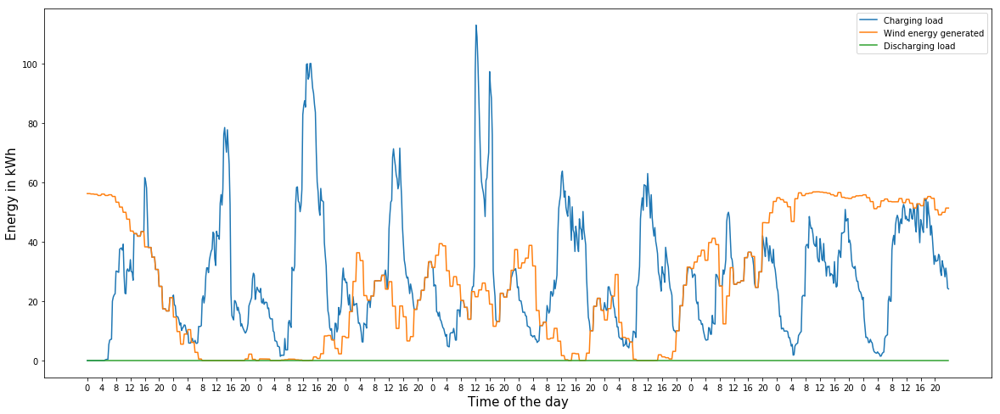

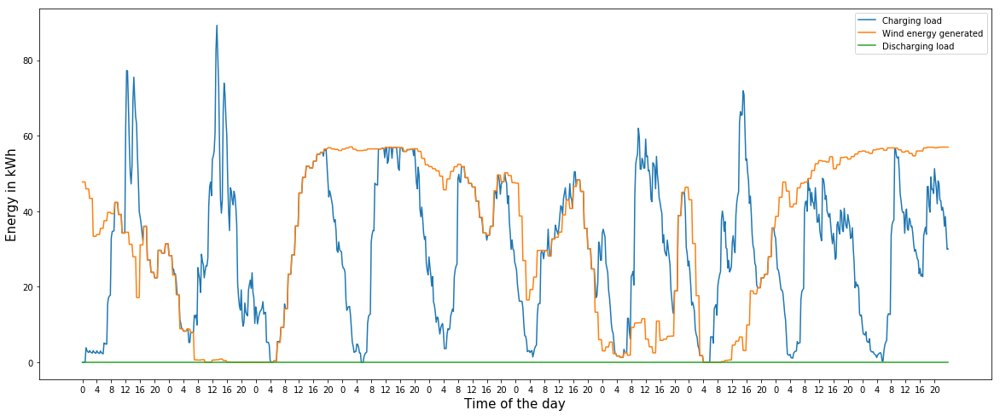

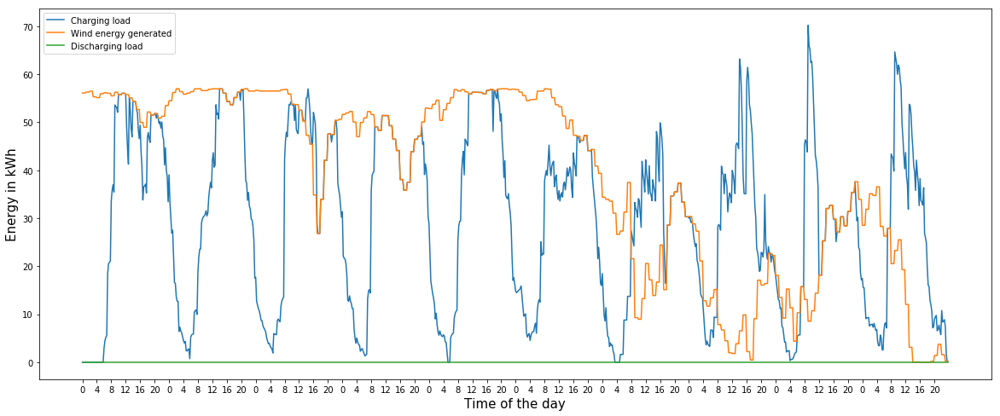

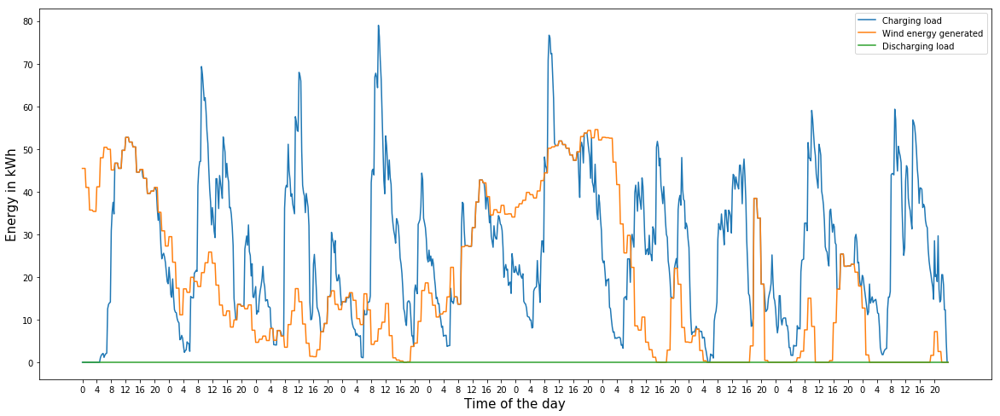

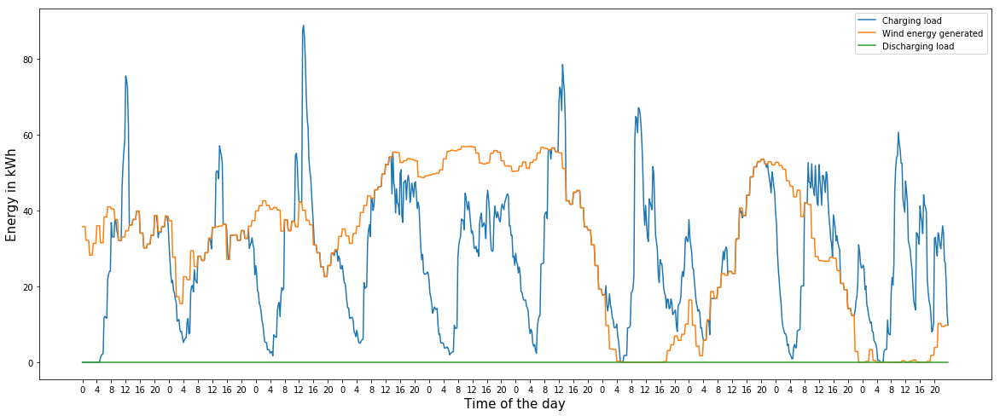

...

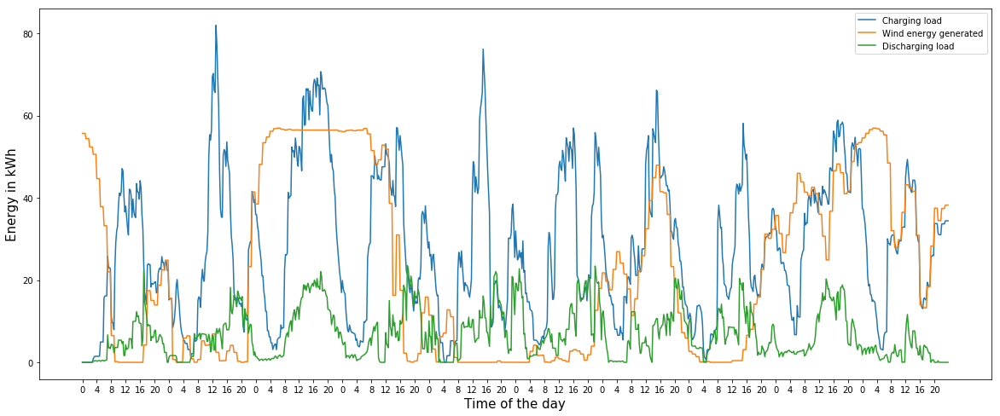

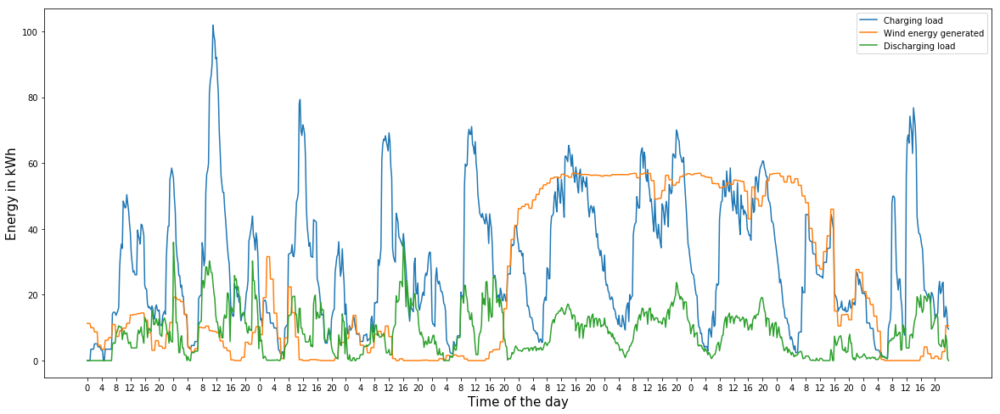

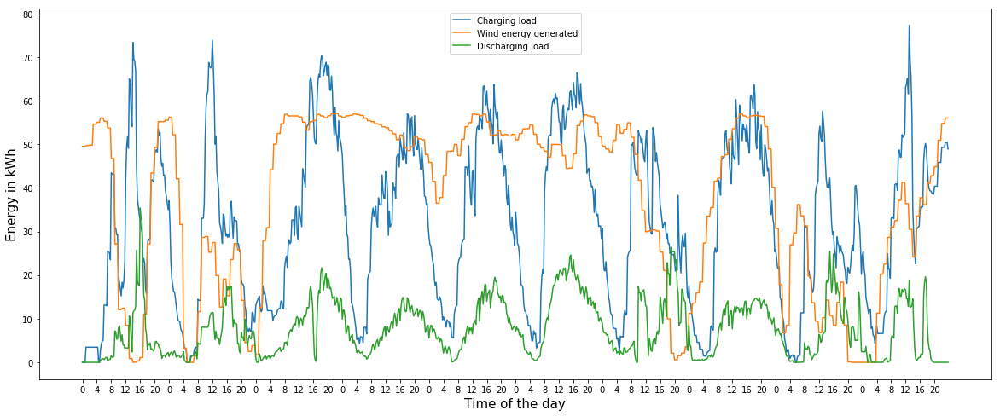

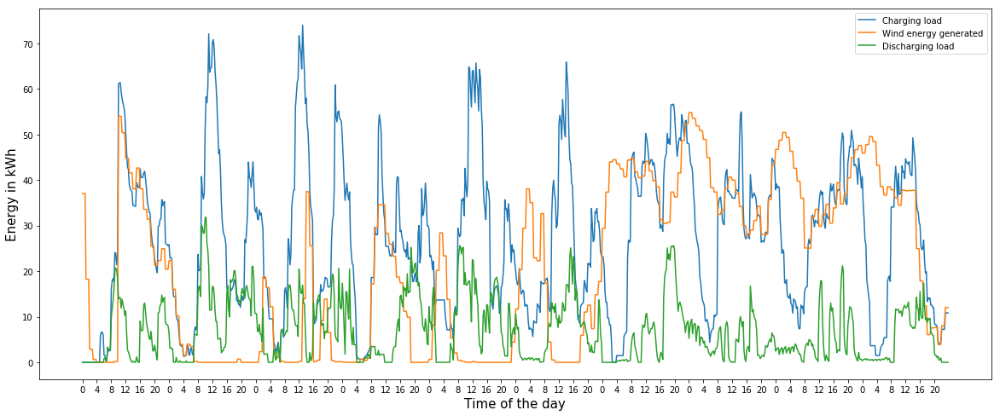

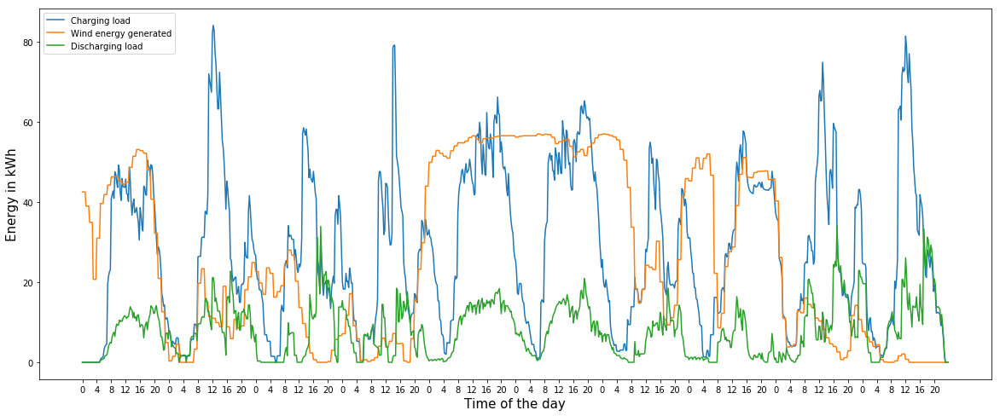

In [5]:
for low_Td, max_Td in zip([2, 3, 5], [10,11,13]:
    for delta in [0.1]:
        simulate_dynamic(low_Td=low_Td, max_Td= max_Td, S=10, eta_v=0.9, delta=delta, delta1=1, delta2=0, delta3=1, NumberOfDays=10, eta_DC_v=0.9,
                            Day_of_Month=15, p=1, Trans_P = 100, timelim =1000)
        l+=1

In [ ]:
# ### Delta 0.5 p=1
# Total wind production:  [24861.1367272, 32058.731937999997, 37425.450862679994, 17672.343508, 30056.1456126, 22248.2023921, 22730.375011, 36307.573659, 19850.627048000002, 25493.092153999998]
# exceeding consumption:  [8138.225325146652, 4689.708837401658, 3416.745213081398, 8210.152424739492, 3628.0906562949976, 7797.0673809423415, 8704.85172617935, 3182.563702269873, 7220.658145188636, 6298.218956101337]
# Wind curtailment:  [8992.323730631046, 10275.859816673912, 13459.974267838023, 3941.115309535681, 8519.552478696442, 7181.316294510818, 8473.990288616864, 13495.852624686539, 4972.853170536529, 9361.148590697012]
# total consumption:  [24007.04, 26472.582, 27382.22, 21941.38, 25164.684, 22863.953, 22961.236, 25994.285, 22098.434, 22430.164]
# total charging cost:  [10940.840162860277, 7141.8195284921585, 9081.653471163394, 47986.737266171855, 13600.098053951702, 33628.53220583282, 44840.00646509363, 11740.89489881053, 28169.64417317617, 28473.555410648016]
# total charge demand:  [25594.105, 26443.082, 26698.66, 24443.637, 25566.484, 25050.69, 25327.176, 25957.035, 24707.785, 24531.752]
# total discharge:  [4430.8545, 2908.6216, 2282.9543, 5218.2163, 3242.5212, 4970.146, 5180.0693, 2846.8667, 5354.6616, 4827.3394]
# Charge cost per kWh is:  [0.45573467574976073, 0.2697817507964081, 0.3316624159021167, 2.187042719586554, 0.5404438328534946, 1.4708100572976843, 1.9528567984890925, 0.45167215902406066, 1.2747348835232948, 1.2694314375636555]
# degradation cost:  [3316.731195404037, 3143.650100535594, 3170.950555222542, 3491.954408608491, 3248.3450650882205, 3421.3082487436213, 3624.6669667890665, 3116.6163070966336, 3502.266683816379, 3435.5069559888348]
# total cost (charge cost + deg cost - revenue):  [14257.570799059038, 10285.469126301488, 12252.603151572013, 51478.6909027528, 16848.440911843136, 37049.83936336896, 48464.67332591029, 14857.510243401533, 31671.90950048484, 31909.0608416711]

In [ ]:
# ### Delta 2 p=1
# Total wind production:  [24861.1367272, 32058.731937999997, 37425.450862679994, 17672.343508, 30056.1456126, 22248.2023921, 22730.375011, 36307.573659, 19850.627048000002, 25493.092153999998]
# exceeding consumption:  [8100.073765433004, 4737.663359321434, 3413.2236051243017, 8226.9599190926, 3596.6045391677626, 7946.503200951404, 8717.944878820323, 3172.428277228354, 7075.060489086147, 6239.198207352693]
# Wind curtailment:  [8650.415983912859, 9826.157171715628, 12912.73495332649, 3776.4278745043985, 8159.311355952837, 6952.174074482939, 8118.72880227871, 12960.83916390709, 4803.026473111968, 9022.060104607766]
# total consumption:  [24310.793, 26970.238, 27925.938, 22122.875, 25493.44, 23242.531, 23329.59, 26519.162, 22122.66, 22710.23]
# total charging cost:  [10901.656996308348, 7207.7681128734675, 9079.983463591925, 48037.456032154, 13483.079884740338, 34286.04743760539, 44919.724271368104, 11680.68064714981, 27659.19468396001, 28156.50466012486]
# total charge demand:  [28465.012, 30303.72, 31399.377, 25742.658, 28468.525, 26855.918, 28394.836, 30579.68, 25937.281, 27340.932]
# total discharge:  [7316.9956, 6700.5625, 6962.2563, 6480.0767, 6138.257, 6597.375, 8220.225, 7458.258, 6696.54, 7668.5815]
# Charge cost per kWh is:  [0.4484286880449249, 0.2672489593050568, 0.32514516168318164, 2.1713930053012547, 0.5288843001954204, 1.4751425767193662, 1.9254399486753988, 0.44046190445136574, 1.2502653156811185, 1.2398158926158458]
# degradation cost:  [3758.173126931791, 3735.82024448032, 3893.2645538344646, 3694.415434716289, 3724.704274453879, 3686.920430125054, 4095.582441190822, 3830.4967578608894, 3718.276054646206, 3902.266283829562]
# total cost (charge cost + deg cost - revenue):  [14659.829697903762, 10943.587830474462, 12973.247014939465, 51731.870635659434, 17207.782024940505, 37972.96686209386, 49015.30588171745, 15511.176485323027, 31377.469261429716, 32058.769873547302]

C:\tools\Anaconda3\lib\site-packages\pandas\core\frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]



Solving problem at TIME 0_1
B  []

Solving problem at TIME 0_2
B  []

Solving problem at TIME 0_3
B  []

Solving problem at TIME 0_4
B  []

Solving problem at TIME 0_5
B  [465]
NumVar and NumConstr = 244, 313

Solving problem at TIME 0_6
B  []
NumVar and NumConstr = 405, 513

Solving problem at TIME 0_7
B  [299, 426]
NumVar and NumConstr = 1031, 1286

Solving problem at TIME 0_8
B  [204, 332, 335]
NumVar and NumConstr = 2061, 2546

Solving problem at TIME 0_9
B  [264, 303, 333, 372, 385, 429]
NumVar and NumConstr = 2908, 3591

Solving problem at TIME 0_10
B  []
NumVar and NumConstr = 2847, 3507

Solving problem at TIME 0_11
B  [2]
NumVar and NumConstr = 2839, 3500

Solving problem at TIME 0_12
B  []
NumVar and NumConstr = 2377, 2939

Solving problem at TIME 0_13
B  [92, 139, 155]
NumVar and NumConstr = 2646, 3288

Solving problem at TIME 0_14
B  [22, 386]
NumVar and NumConstr = 2381, 2963

Solving problem at TIME 0_15
B  []
NumVar and NumConstr = 1991, 2490

Solving problem at TIME 0_

NumVar and NumConstr = 2405, 2967

Solving problem at TIME 0_114
B  [191, 210, 237]
NumVar and NumConstr = 2075, 2577

Solving problem at TIME 0_115
B  []
NumVar and NumConstr = 1640, 2049

Solving problem at TIME 0_116
B  [60]
NumVar and NumConstr = 1288, 1615

Solving problem at TIME 0_117
B  []
NumVar and NumConstr = 843, 1062

Solving problem at TIME 0_118
B  []
NumVar and NumConstr = 491, 632

Solving problem at TIME 0_119
B  [59]
NumVar and NumConstr = 221, 298
5998.365821540402 1135.8190744410256 4356.822368258717

Solving problem at TIME 1_1
B  []

Solving problem at TIME 1_2
B  []

Solving problem at TIME 1_3
B  []
NumVar and NumConstr = 155, 201

Solving problem at TIME 1_4
B  []
NumVar and NumConstr = 127, 165

Solving problem at TIME 1_5
B  []
NumVar and NumConstr = 99, 129

Solving problem at TIME 1_6
B  []
NumVar and NumConstr = 458, 579

Solving problem at TIME 1_7
B  [383, 397]
NumVar and NumConstr = 1374, 1710

Solving problem at TIME 1_8
B  [400, 420, 435, 438, 467]
N

NumVar and NumConstr = 2315, 2838

Solving problem at TIME 1_104
B  [191, 275, 459]
NumVar and NumConstr = 3038, 3725

Solving problem at TIME 1_105
B  [37, 357]
NumVar and NumConstr = 2973, 3648

Solving problem at TIME 1_106
B  [47]
NumVar and NumConstr = 2449, 3013

Solving problem at TIME 1_107
B  []
NumVar and NumConstr = 2063, 2547

Solving problem at TIME 1_108
B  [52, 125, 424]
NumVar and NumConstr = 1752, 2188

Solving problem at TIME 1_109
B  [16, 472]
NumVar and NumConstr = 2009, 2492

Solving problem at TIME 1_110
B  [173]
NumVar and NumConstr = 2303, 2844

Solving problem at TIME 1_111
B  [69, 306, 432, 488]
NumVar and NumConstr = 3318, 4091

Solving problem at TIME 1_112
B  [115, 211, 460, 463]
NumVar and NumConstr = 3258, 4014

Solving problem at TIME 1_113
B  [99, 166, 218, 280]
NumVar and NumConstr = 3014, 3711

Solving problem at TIME 1_114
B  [54, 97, 184]
NumVar and NumConstr = 2914, 3606

Solving problem at TIME 1_115
B  [7, 27, 216]
NumVar and NumConstr = 2888, 35

NumVar and NumConstr = 1964, 2440

Solving problem at TIME 2_94
B  []
NumVar and NumConstr = 1653, 2054

Solving problem at TIME 2_95
B  [28, 109]
NumVar and NumConstr = 1374, 1723

Solving problem at TIME 2_96
B  []
NumVar and NumConstr = 988, 1242

Solving problem at TIME 2_97
B  []
NumVar and NumConstr = 671, 844

Solving problem at TIME 2_98
B  []
NumVar and NumConstr = 435, 549

Solving problem at TIME 2_99
B  []
NumVar and NumConstr = 259, 330

Solving problem at TIME 2_100
B  []
NumVar and NumConstr = 119, 156

Solving problem at TIME 2_101
B  []
NumVar and NumConstr = 33, 45

Solving problem at TIME 2_102
B  [499]
NumVar and NumConstr = 513, 643

Solving problem at TIME 2_103
B  [277, 300, 371, 486]
NumVar and NumConstr = 1595, 1986

Solving problem at TIME 2_104
B  [133, 245, 319, 342, 356, 388, 389, 393, 418, 453, 300]
NumVar and NumConstr = 2970, 3686

Solving problem at TIME 2_105
B  [330, 346, 369]
NumVar and NumConstr = 3268, 4027

Solving problem at TIME 2_106
B  [304, 3

NumVar and NumConstr = 2914, 3594

Solving problem at TIME 3_85
B  [163, 236]
NumVar and NumConstr = 2832, 3496

Solving problem at TIME 3_86
B  [218]
NumVar and NumConstr = 2779, 3430

Solving problem at TIME 3_87
B  [158]
NumVar and NumConstr = 2445, 3037

Solving problem at TIME 3_88
B  [182, 363, 388]
NumVar and NumConstr = 2436, 3022

Solving problem at TIME 3_89
B  [135]
NumVar and NumConstr = 2040, 2529

Solving problem at TIME 3_90
B  [32, 101]
NumVar and NumConstr = 1635, 2041

Solving problem at TIME 3_91
B  [228, 465]
NumVar and NumConstr = 1404, 1743

Solving problem at TIME 3_92
B  [9]
NumVar and NumConstr = 1435, 1780

Solving problem at TIME 3_93
B  [91]
NumVar and NumConstr = 1747, 2158

Solving problem at TIME 3_94
B  []
NumVar and NumConstr = 1472, 1821

Solving problem at TIME 3_95
B  []
NumVar and NumConstr = 1056, 1314

Solving problem at TIME 3_96
B  []
NumVar and NumConstr = 710, 891

Solving problem at TIME 3_97
B  []
NumVar and NumConstr = 453, 573

Solving pro

NumVar and NumConstr = 272, 351

Solving problem at TIME 4_78
B  [295]
NumVar and NumConstr = 446, 562

Solving problem at TIME 4_79
B  [378]
NumVar and NumConstr = 1009, 1246

Solving problem at TIME 4_80
B  [10, 298, 395]
NumVar and NumConstr = 2066, 2546

Solving problem at TIME 4_81
B  [262, 338]
NumVar and NumConstr = 2426, 2985

Solving problem at TIME 4_82
B  [219, 339, 431, 480]
NumVar and NumConstr = 2944, 3655

Solving problem at TIME 4_83
B  []
NumVar and NumConstr = 2672, 3315

Solving problem at TIME 4_84
B  [324]
NumVar and NumConstr = 3103, 3845

Solving problem at TIME 4_85
B  [224, 414]
NumVar and NumConstr = 3225, 3992

Solving problem at TIME 4_86
B  [137, 440]
NumVar and NumConstr = 3125, 3884

Solving problem at TIME 4_87
B  [26, 242]
NumVar and NumConstr = 2739, 3416

Solving problem at TIME 4_88
B  [289, 493]
NumVar and NumConstr = 2772, 3478

Solving problem at TIME 4_89
B  []
NumVar and NumConstr = 2494, 3115

Solving problem at TIME 4_90
B  [1, 230]
NumVar and

NumVar and NumConstr = 2001, 2487

Solving problem at TIME 5_70
B  [216]
NumVar and NumConstr = 1645, 2039

Solving problem at TIME 5_71
B  []
NumVar and NumConstr = 1352, 1680

Solving problem at TIME 5_72
B  []
NumVar and NumConstr = 1076, 1341

Solving problem at TIME 5_73
B  []
NumVar and NumConstr = 742, 927

Solving problem at TIME 5_74
B  []
NumVar and NumConstr = 498, 630

Solving problem at TIME 5_75
B  []
NumVar and NumConstr = 310, 393

Solving problem at TIME 5_76
B  []
NumVar and NumConstr = 210, 267

Solving problem at TIME 5_77
B  [344]
NumVar and NumConstr = 251, 322

Solving problem at TIME 5_78
B  [95, 255]
NumVar and NumConstr = 460, 584

Solving problem at TIME 5_79
B  [426]
NumVar and NumConstr = 634, 798

Solving problem at TIME 5_80
B  [269, 412, 448, 470]
NumVar and NumConstr = 1990, 2466

Solving problem at TIME 5_81
B  [294]
NumVar and NumConstr = 2371, 2919

Solving problem at TIME 5_82
B  [136, 280]
NumVar and NumConstr = 2693, 3315

Solving problem at TIME 

NumVar and NumConstr = 2515, 3128

Solving problem at TIME 6_63
B  [208, 382, 412, 471]
NumVar and NumConstr = 2726, 3396

Solving problem at TIME 6_64
B  [44, 114, 366]
NumVar and NumConstr = 2730, 3395

Solving problem at TIME 6_65
B  [5, 161, 181, 290]
NumVar and NumConstr = 3403, 4202

Solving problem at TIME 6_66
B  [189]
NumVar and NumConstr = 3414, 4205

Solving problem at TIME 6_67
B  [180]
NumVar and NumConstr = 3452, 4246

Solving problem at TIME 6_68
B  []
NumVar and NumConstr = 2907, 3585

Solving problem at TIME 6_69
B  []
NumVar and NumConstr = 2402, 2986

Solving problem at TIME 6_70
B  [91]
NumVar and NumConstr = 1859, 2320

Solving problem at TIME 6_71
B  [295]
NumVar and NumConstr = 1461, 1840

Solving problem at TIME 6_72
B  [473]
NumVar and NumConstr = 1121, 1418

Solving problem at TIME 6_73
B  [221]
NumVar and NumConstr = 820, 1060

Solving problem at TIME 6_74
B  []
NumVar and NumConstr = 523, 675

Solving problem at TIME 6_75
B  []
NumVar and NumConstr = 309, 39

NumVar and NumConstr = 933, 1152

Solving problem at TIME 7_55
B  [369, 385, 437, 466]
NumVar and NumConstr = 1455, 1799

Solving problem at TIME 7_56
B  [310, 345, 439, 452]
NumVar and NumConstr = 2018, 2511

Solving problem at TIME 7_57
B  [429]
NumVar and NumConstr = 2589, 3198

Solving problem at TIME 7_58
B  [469]
NumVar and NumConstr = 2694, 3314

Solving problem at TIME 7_59
B  [7]
NumVar and NumConstr = 2335, 2886

Solving problem at TIME 7_60
B  [38, 216]
NumVar and NumConstr = 2482, 3066

Solving problem at TIME 7_61
B  [256, 314, 373, 402, 459]
NumVar and NumConstr = 3030, 3740

Solving problem at TIME 7_62
B  [349]
NumVar and NumConstr = 3479, 4279

Solving problem at TIME 7_63
B  []
NumVar and NumConstr = 2963, 3648

Solving problem at TIME 7_64
B  [14, 116]
NumVar and NumConstr = 2487, 3089

Solving problem at TIME 7_65
B  [18, 177, 180]
NumVar and NumConstr = 2879, 3552

Solving problem at TIME 7_66
B  [152, 206, 215]
NumVar and NumConstr = 3316, 4074

Solving problem at


Solving problem at TIME 8_43
B  []
NumVar and NumConstr = 2366, 2923

Solving problem at TIME 8_44
B  []
NumVar and NumConstr = 2210, 2724

Solving problem at TIME 8_45
B  []
NumVar and NumConstr = 1957, 2448

Solving problem at TIME 8_46
B  [61]
NumVar and NumConstr = 1790, 2228

Solving problem at TIME 8_47
B  []
NumVar and NumConstr = 1291, 1612

Solving problem at TIME 8_48
B  []
NumVar and NumConstr = 897, 1132

Solving problem at TIME 8_49
B  []
NumVar and NumConstr = 757, 962

Solving problem at TIME 8_50
B  []
NumVar and NumConstr = 476, 608

Solving problem at TIME 8_51
B  []
NumVar and NumConstr = 293, 384

Solving problem at TIME 8_52
B  []
NumVar and NumConstr = 163, 214

Solving problem at TIME 8_53
B  []
NumVar and NumConstr = 98, 129

Solving problem at TIME 8_54
B  []
NumVar and NumConstr = 361, 456

Solving problem at TIME 8_55
B  []
NumVar and NumConstr = 944, 1175

Solving problem at TIME 8_56
B  [307, 330, 363, 447]
NumVar and NumConstr = 2307, 2853

Solving proble


Solving problem at TIME 9_35
B  [115, 453]
NumVar and NumConstr = 2998, 3703

Solving problem at TIME 9_36
B  []
NumVar and NumConstr = 2703, 3339

Solving problem at TIME 9_37
B  [182, 418]
NumVar and NumConstr = 2385, 2959

Solving problem at TIME 9_38
B  [329, 348]
NumVar and NumConstr = 2497, 3102

Solving problem at TIME 9_39
B  []
NumVar and NumConstr = 2418, 2988

Solving problem at TIME 9_40
B  [93]
NumVar and NumConstr = 2318, 2860

Solving problem at TIME 9_41
B  [80, 370]
NumVar and NumConstr = 2942, 3614

Solving problem at TIME 9_42
B  [24]
NumVar and NumConstr = 2896, 3550

Solving problem at TIME 9_43
B  []
NumVar and NumConstr = 2780, 3417

Solving problem at TIME 9_44
B  [1, 117]
NumVar and NumConstr = 3042, 3748

Solving problem at TIME 9_45
B  [146]
NumVar and NumConstr = 2531, 3128

Solving problem at TIME 9_46
B  [12, 20]
NumVar and NumConstr = 2247, 2794

Solving problem at TIME 9_47
B  [12]
NumVar and NumConstr = 2032, 2528

Solving problem at TIME 9_48
B  []
Nu

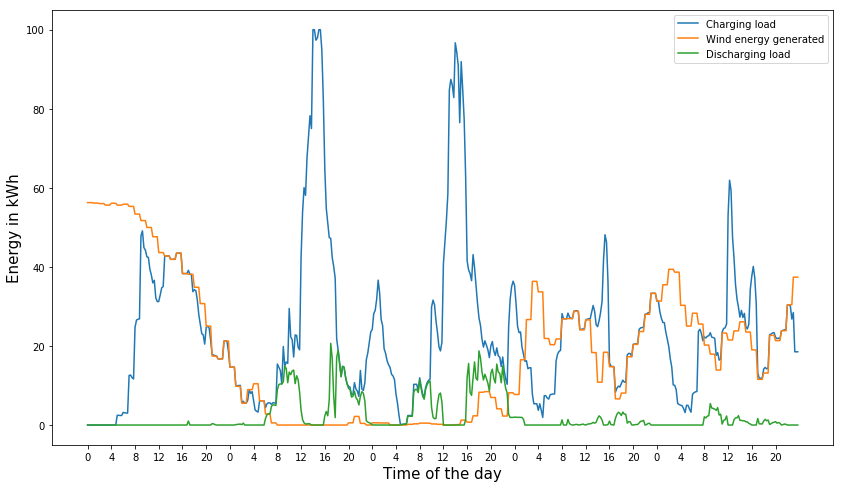

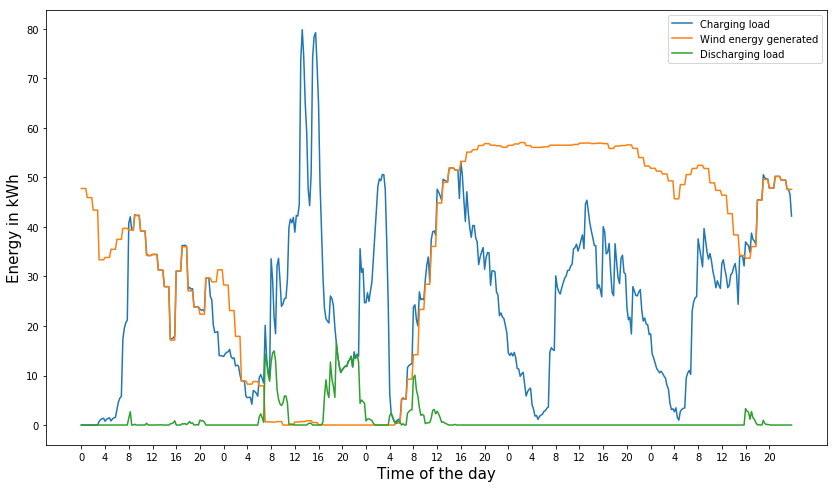

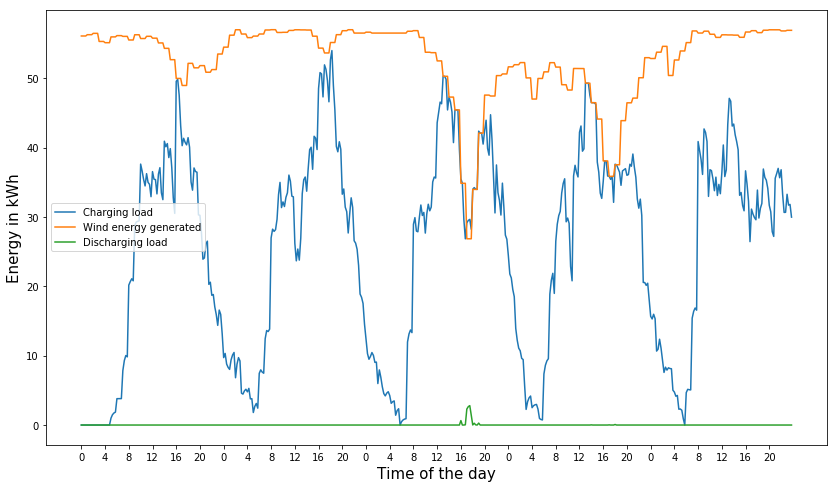

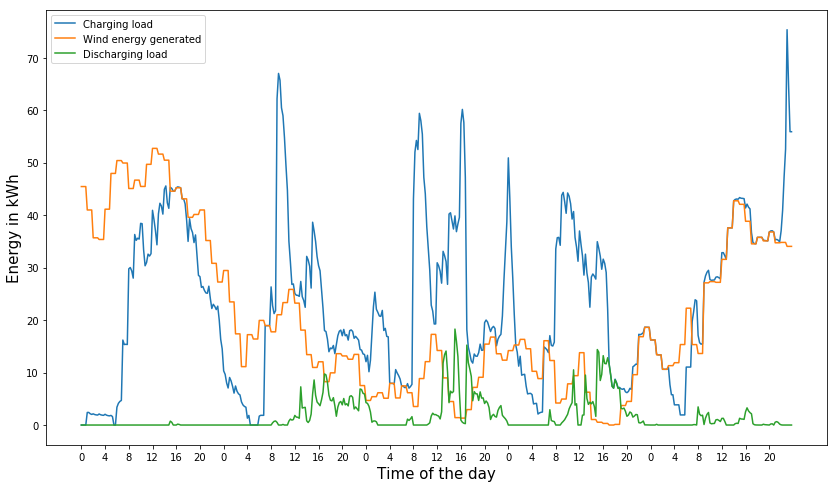

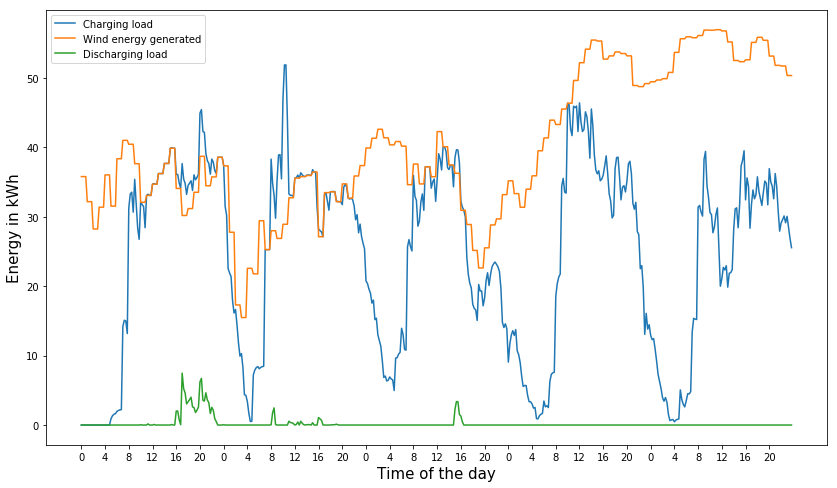

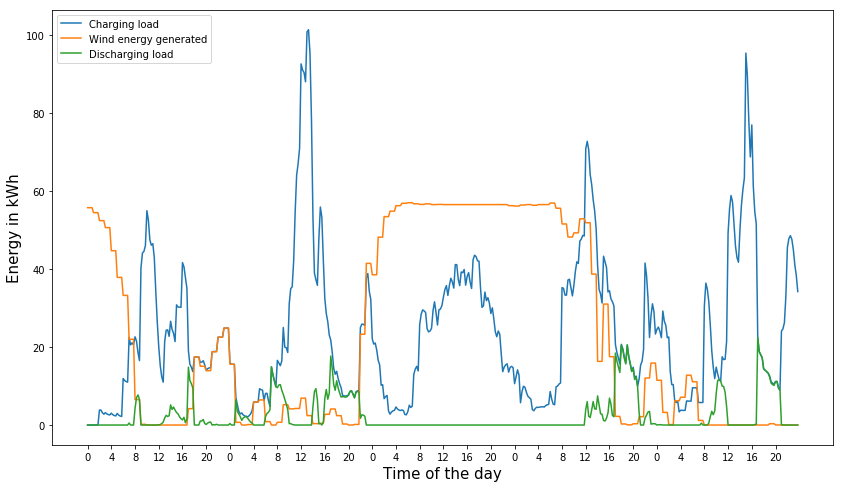

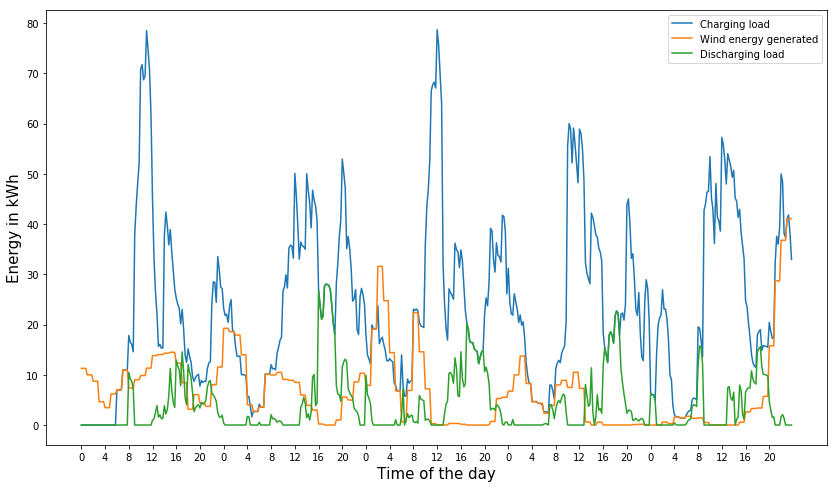

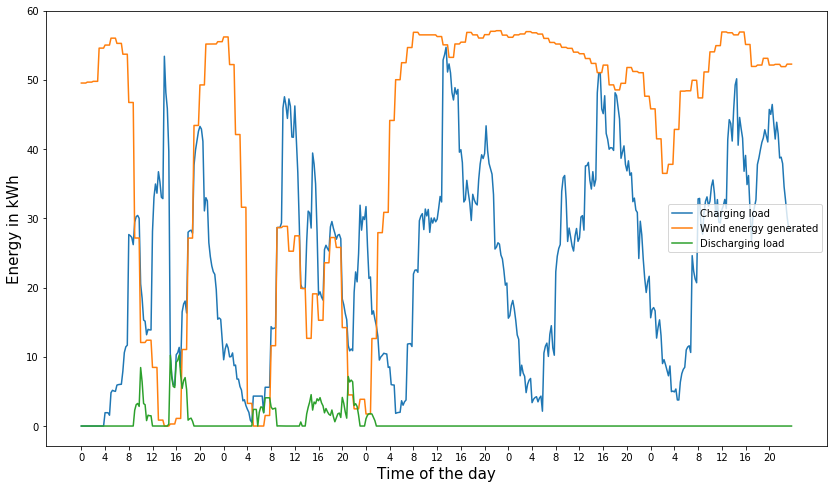

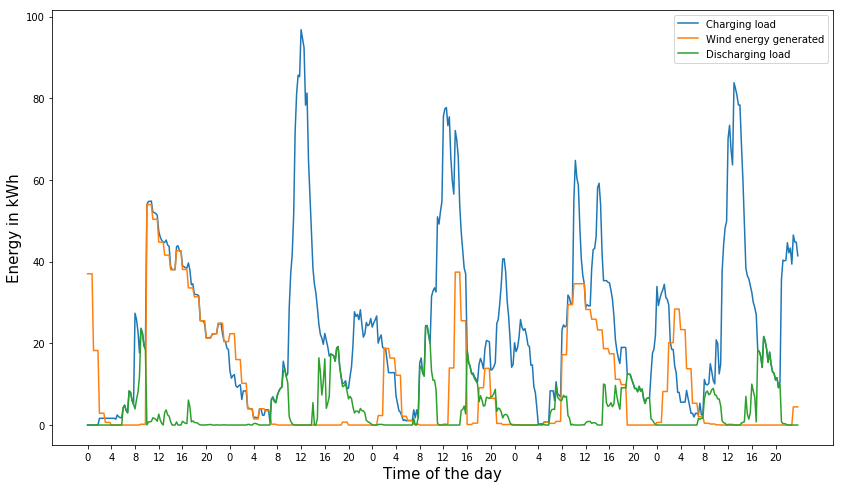

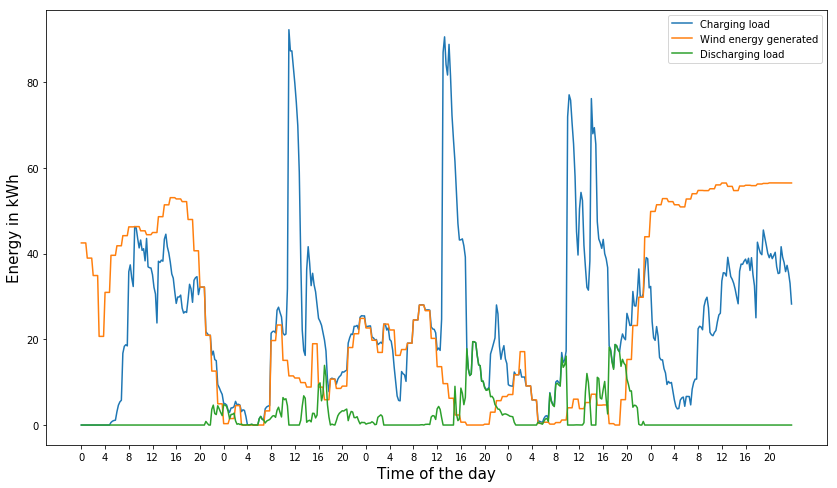

In [32]:
l=1
simulate_dynamic(S=10, eta_v=1, delta=0.9, delta1=1, delta2=0, delta3=1, NumberOfDays=5, eta_DC_v=1,
                        Day_of_Month=15, Trans_P = 100, timelim =1000)

In [25]:
df= pd.read_excel('EV_Dataset_Dynamic.xlsx')
df.head()

,Unnamed: 0,index,BC,AR,pc,chargepow,IS,DL,Ta,Td,...,Charge load kWh,Total Discharge kWh,Charge Cost,Wind Usage,Consumption from discharge,Consumption from grid,Degradation Cost,wind during park,Revenue,Is in V2G
0,0,1,32.000000,7.7,7.0,7.0,8.240458,26.204270,239,279,...,23.759542,5.79573,2.727741e+01,0.000000,0.0,2.375954e+01,2.519620,124.870801,18.378931,True
1,1,2,33.500000,7.7,6.6,6.6,0.470941,27.807020,41,62,...,29.700000,0.00000,0.000000e+00,29.700000,0.0,0.000000e+00,2.722500,940.745000,0.000000,True
2,2,3,25.025727,9.6,9.6,9.6,13.261133,22.625727,265,274,...,9.364594,0.00000,9.641942e-14,9.364594,0.0,1.287859e-14,0.920166,72.625225,0.000000,True
3,3,4,40.000000,15.4,17.2,15.4,18.613135,32.931898,239,251,...,14.318763,0.00000,1.631140e+01,0.000000,0.0,1.431876e+01,1.601874,0.478331,0.000000,True
4,4,5,32.000000,7.7,7.0,7.0,9.215519,30.013898,234,251,...,20.798379,0.00000,2.472458e+01,0.000000,0.0,2.079838e+01,1.868062,1.576837,0.000000,True


In [26]:
len(df)

1500

In [15]:
0.9*df['Revenue'].sum()

2309.8347675640043

In [18]:
df['WindUsage'].sum()

27883.051374423925

In [19]:
sum([9093.7414412, 16608.193688, 25335.112999999998]) - sum([3080.3823842625084, 7121.632045090922, 12951.982716830611])

27883.050983015957